<div style="text-align: right"><img src="https://datascientest.com/wp-content/uploads/2020/10/logo-text-right-768x130.png"/></div>

<div style="text-align: right"><i>Elise SOYEUX<br/>
Johan TAING<br/>
Toussaint ILBOUDO<br/>
Pierre-Yves ESNAULT</i></div>

<br/>
<div style="text-align: center"><b><font size="36">Modélisation – Consommation</font></div>

# 0- Données communes

## 1. Bibliothèques

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import pearsonr
from sklearn.preprocessing import StandardScaler
from scipy.stats.kde import gaussian_kde
import math
from math import *
from datetime import *

from sklearn import model_selection
from sklearn.model_selection import cross_val_predict, cross_validate
from sklearn.linear_model import LinearRegression

from sklearn import linear_model
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Lasso

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
import scipy.stats as stats
from sklearn.linear_model import RidgeCV
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import lasso_path
import matplotlib.cm as cm
from sklearn.linear_model import LassoCV

from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as rmse

# Seasonality decomposition
from statsmodels.tsa.seasonal import seasonal_decompose
# holt winters 
# single exponential smoothing
from statsmodels.tsa.holtwinters import SimpleExpSmoothing   
# double and triple exponential smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing

import warnings
warnings.filterwarnings('ignore')

## 2. Dataset

In [115]:
df = pd.read_csv('eco2mix-regional-cons-def.csv', sep=';')
df2 = df
temp = pd.read_csv('temperature-quotidienne-regionale.csv', sep = ';')
meteo = pd.read_csv('donnees-synop-essentielles-omm.csv', sep = ';')
dyn=pd.read_csv('cession-departement-secteur-activite.csv',sep='\t')

df.info()
#temp.info()
meteo.info()
#dyn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1875456 entries, 0 to 1875455
Data columns (total 28 columns):
 #   Column               Dtype  
---  ------               -----  
 0   Code INSEE région    int64  
 1   Région               object 
 2   Nature               object 
 3   Date                 object 
 4   Heure                object 
 5   Date - Heure         object 
 6   Consommation (MW)    float64
 7   Thermique (MW)       float64
 8   Nucléaire (MW)       float64
 9   Eolien (MW)          float64
 10  Solaire (MW)         float64
 11  Hydraulique (MW)     float64
 12  Pompage (MW)         float64
 13  Bioénergies (MW)     float64
 14  Ech. physiques (MW)  float64
 15  TCO Thermique (%)    float64
 16  TCH Thermique (%)    float64
 17  TCO Nucléaire (%)    float64
 18  TCH Nucléaire (%)    float64
 19  TCO Eolien (%)       float64
 20  TCH Eolien (%)       float64
 21  TCO Solaire (%)      float64
 22  TCH Solaire (%)      float64
 23  TCO Hydraulique (%)  float64
 24

## 3. Opérations communes

In [3]:
# Liste des régions
regions = ['Auvergne-Rhône-Alpes', 'Bourgogne-Franche-Comté', 'Bretagne', 'Centre-Val de Loire', 'Grand Est', 'Hauts-de-France', 'Normandie', 'Nouvelle-Aquitaine', 'Occitanie', 'Pays de la Loire', "Provence-Alpes-Côte d'Azur", 'Île-de-France']

# Création d'une liste de couleurs
couleurs_filieres = ['r', 'm', 'c', 'y', 'b', 'g']
couleurs_regions = [(0.5, 0.25, 0.75), (0.25, 0.5, 0.75), (0.5, 0.0, 1.0), (0.75, 0.25, 0.5),
                    (0.25, 0.75, 0.5), (0.5, 1.0, 0.0), (0.0, 0.5, 1.0), (0.5, 0.75, 0.25), (0.75, 0.25, 1.0), (0.75, 0.5, 0.25), (0.0, 1.0, 0.5), (0.5, 0.5, 0.5)]

# Création de listes temporelles
saisons = ['Hiver', 'Printemps', 'Eté', 'Automne', 'Hiver']
mois = ['Janvier', 'Février', 'Mars', 'Avril', 'Mai', 'Juin', 'Juillet', 'Août', 'Septembre', 'Octobre', 'Novembre', 'Décembre']
jours = ['Lundi', 'Mardi', 'Mercredi', 'Jeudi', 'Vendredi', 'Samedi', 'Dimanche']

# Suppression des colonnes "Code INSEE région", "Nature" et "Column 26", sans intérêt pour notre étude
df.drop(['Code INSEE région', 'Nature', 'Column 26'], axis=1, inplace=True, errors='ignore')

# Ajout de colonnes temporelles dans le Dataframe principal
df['Datetime'] = (df['Date']+' '+df['Heure']).apply(lambda date: datetime.strptime(date, "%Y-%m-%d %H:%M"))
df.drop(['Année', 'Saison', 'Mois', 'Jour'], axis=1, inplace=True, errors='ignore') # Pour réactualisation du Kernel
df.insert(1, 'Jour',df['Datetime'].dt.weekday) # Jours de la semaine de 0 (Lundi) à 6 (Dimanche)
df.insert(1, 'Mois',df['Datetime'].dt.month) # Mois de l'année de 1 (Janvier) à 12 (Décembre)
df.insert(1, 'Saison',df['Datetime'].dt.dayofyear) # Jours de l'année servant comme base aux saisons
df['Saison'].replace([range(0, 80), range(80, 172), range(172, 264), range(264, 355), range(355, 367)], [0, 1, 2, 3, 0], inplace=True) # Saisons de 0 (Hiver) à 3 (Automne)
df.insert(1,'Année',df['Datetime'].dt.year) # Années

# Suppression de la colonne "Date - Heure", redondante avec les manipulations temporelles plus utiles
df.drop('Date - Heure', axis=1, inplace=True, errors='ignore')

# Suppression des valeurs manquantes de consommation et production
df = df.dropna(subset = df.columns[7:-1], how='all')

df.head()


,Région,Année,Saison,Mois,Jour,Date,Heure,Consommation (MW),Thermique (MW),Nucléaire (MW),...,TCH Nucléaire (%),TCO Eolien (%),TCH Eolien (%),TCO Solaire (%),TCH Solaire (%),TCO Hydraulique (%),TCH Hydraulique (%),TCO Bioénergies (%),TCH Bioénergies (%),Datetime
12,Pays de la Loire,2013,0,1,1,2013-01-01,00:30,3595.0,127.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-01 00:30:00
13,Nouvelle-Aquitaine,2013,0,1,1,2013-01-01,00:30,5464.0,240.0,4993.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-01 00:30:00
14,Occitanie,2013,0,1,1,2013-01-01,00:30,5228.0,78.0,2497.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-01 00:30:00
15,Île-de-France,2013,0,1,1,2013-01-01,00:30,9134.0,685.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-01 00:30:00
16,Bourgogne-Franche-Comté,2013,0,1,1,2013-01-01,00:30,2357.0,236.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-01-01 00:30:00


In [4]:
# Datetime en tant qu'index
df.set_index('Datetime', inplace=True)

# Affichage des 5 premières lignes du Dataframe commun
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1875444 entries, 2013-01-01 00:30:00 to 2021-11-30 23:30:00
Data columns (total 28 columns):
 #   Column               Dtype  
---  ------               -----  
 0   Région               object 
 1   Année                int64  
 2   Saison               int64  
 3   Mois                 int64  
 4   Jour                 int64  
 5   Date                 object 
 6   Heure                object 
 7   Consommation (MW)    float64
 8   Thermique (MW)       float64
 9   Nucléaire (MW)       float64
 10  Eolien (MW)          float64
 11  Solaire (MW)         float64
 12  Hydraulique (MW)     float64
 13  Pompage (MW)         float64
 14  Bioénergies (MW)     float64
 15  Ech. physiques (MW)  float64
 16  TCO Thermique (%)    float64
 17  TCH Thermique (%)    float64
 18  TCO Nucléaire (%)    float64
 19  TCH Nucléaire (%)    float64
 20  TCO Eolien (%)       float64
 21  TCH Eolien (%)       float64
 22  TCO Solaire (%)      float64
 23 

,Région,Année,Saison,Mois,Jour,Date,Heure,Consommation (MW),Thermique (MW),Nucléaire (MW),...,TCO Nucléaire (%),TCH Nucléaire (%),TCO Eolien (%),TCH Eolien (%),TCO Solaire (%),TCH Solaire (%),TCO Hydraulique (%),TCH Hydraulique (%),TCO Bioénergies (%),TCH Bioénergies (%)
Datetime,,,,,,,,,,,,,,,,,,,,,
2013-01-01 00:30:00,Pays de la Loire,2013,0,1,1,2013-01-01,00:30,3595.0,127.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-01 00:30:00,Nouvelle-Aquitaine,2013,0,1,1,2013-01-01,00:30,5464.0,240.0,4993.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-01 00:30:00,Occitanie,2013,0,1,1,2013-01-01,00:30,5228.0,78.0,2497.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-01 00:30:00,Île-de-France,2013,0,1,1,2013-01-01,00:30,9134.0,685.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-01 00:30:00,Bourgogne-Franche-Comté,2013,0,1,1,2013-01-01,00:30,2357.0,236.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# I- Introduction

<p>Les étapes précédentes de visualisation et premières études de corrélation ont mis en évidence une problématique principale qui servira de fil directeur pour cette étape de modélisation.
<p>Nous partons d'un postulat résumé ci-dessous.

## 1. À quelle production nationale du Nucléaire minimale faut-il s'attendre ?

Nous nous baserons sur l'historique de production des dernières années afin de vérifier s'il est possible d'en extraire une base minimale de production avec un niveau de confiance suffisant.

Production nucléaire minimale à l'échelle nationale (95 %): 23093 MW.


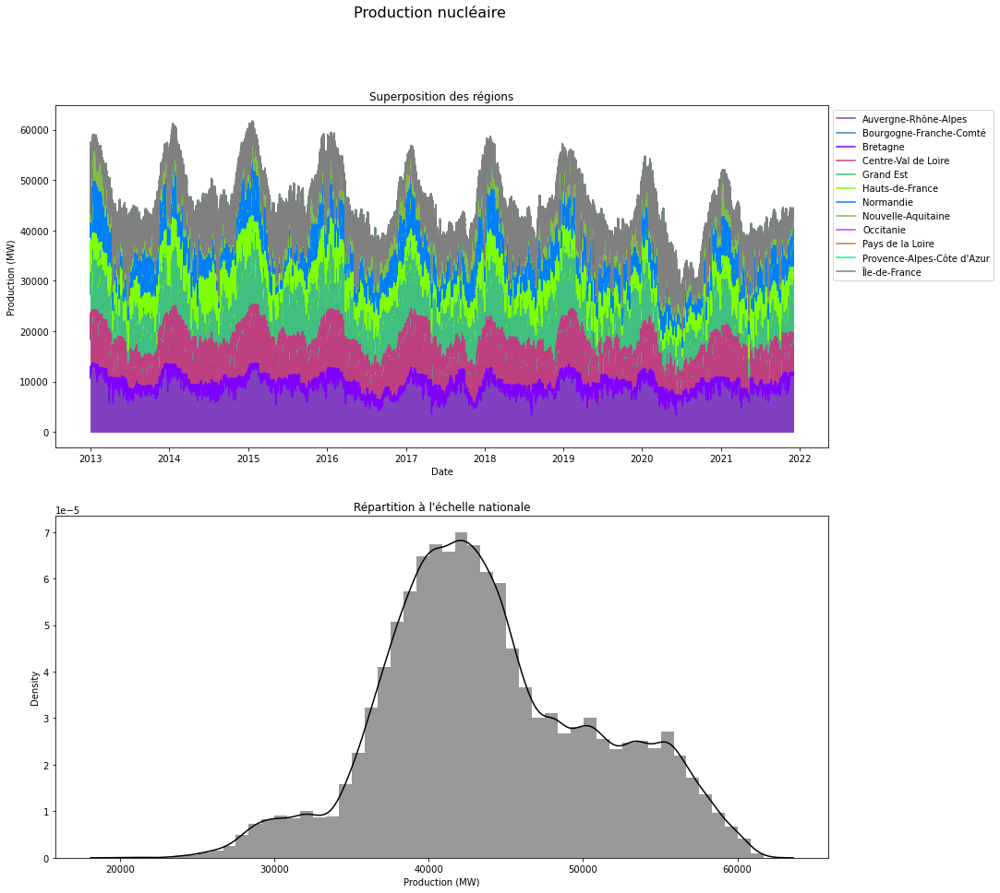

In [5]:
# 1 Kernel par période afin de présenter 1 Dataframe par période pour plus de lisibilité.
nucleaire = df.dropna(subset = ['Nucléaire (MW)']).iloc[:,[0,9,19]]

# Création d'une colonne par région pour la production et le TCH nucléaires
for i in range(len(regions)):
    nucleaire['Production '+regions[i]+' (MW)'] = nucleaire[nucleaire['Région']==regions[i]]['Nucléaire (MW)']
    nucleaire['TCH '+regions[i]+' (%)'] = nucleaire[nucleaire['Région']==regions[i]]['TCH Nucléaire (%)']

nucleaire.drop(['Région', 'Nucléaire (MW)', 'TCH Nucléaire (%)'], axis=1, inplace=True) # Suppression des colonnes devenues inutiles 
nucleaire = nucleaire.groupby(nucleaire.index).max() # Groupement selon la date
nucleaire.fillna(0, inplace=True) # Les NaN restants sont associés à une absence de production : traitement plus simple en les remplaçant par 0

# Initialisation d'une liste associée aux productions nucléaires pour permettre une superposition simplifiée des courbes dans une boucle
prod_nucleaire = []

# Superposition des valeurs de production régionale dans la liste
for i in range(len(regions)):
    prod_nucleaire.append(nucleaire['Production '+regions[i]+' (MW)'] if i==0 else nucleaire['Production '+regions[i]+' (MW)']+prod_nucleaire[i-1])

# Courbes des productions nucléaires superposées
fig = plt.figure(figsize = (15,15))
plt.suptitle('Production nucléaire', fontsize=16)
for i in range(len(regions)):
    plt.subplot(2,1,1)
    plt.plot(prod_nucleaire[i], label=regions[i], color=couleurs_regions[i])
    plt.fill_between(nucleaire.index, prod_nucleaire[i-1] if i>0 else 0, prod_nucleaire[i], color=couleurs_regions[i])
    plt.title('Superposition des régions')
    plt.xlabel('Date')
    plt.ylabel('Production (MW)')
    plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left');

# Répartition des valeurs de production nucléaire
plt.subplot(2,1,2)
plt.title("Répartition à l'échelle nationale")
sns.distplot(prod_nucleaire[len(regions)-1], kde=True, color='k')
plt.xlabel('Production (MW)')
prod_nucleaire_mini_95 = prod_nucleaire[len(regions)-1].mean()-3*prod_nucleaire[len(regions)-1].std()
print("Production nucléaire minimale à l'échelle nationale (95 %):",round(prod_nucleaire_mini_95),'MW.')

La filière nucléaire semble suivre une loi normale de laquelle nous pouvons déduire une production minimale d'environ 23 GW à l'échelle nationale. Cela nous servira de base afin de déduire la puissance restant à fournir par les 2 leviers restants - le thermique et l'hydraulique. On considérera le pire scénario possible, à savoir une consommation à son maximum et l'absence d'énergies renouvelables dont la production est trop aléatoire.

Dans cette logique, nous souhaitons néanmoins vérifier la capacité constante des filières thermique et hydraulique en nous basant sur leurs TCH respectifs pour déduire leur capacité maximale de production

## 2. Les capacités maximales de productions thermiques et hydrauliques sont-elles constantes ?

Puisque nous utilisons le TCH, notre étude portera uniquement sur l'année 2021 pour laquelle nous avons à la fois les valeurs de production et leurs TCH associés.

Objectif : déduire la capacité maximale de ces filières et étudier son évolution sur l'année.

Productions thermique + hydraulique minimales à l'échelle nationale : 43334 MW.


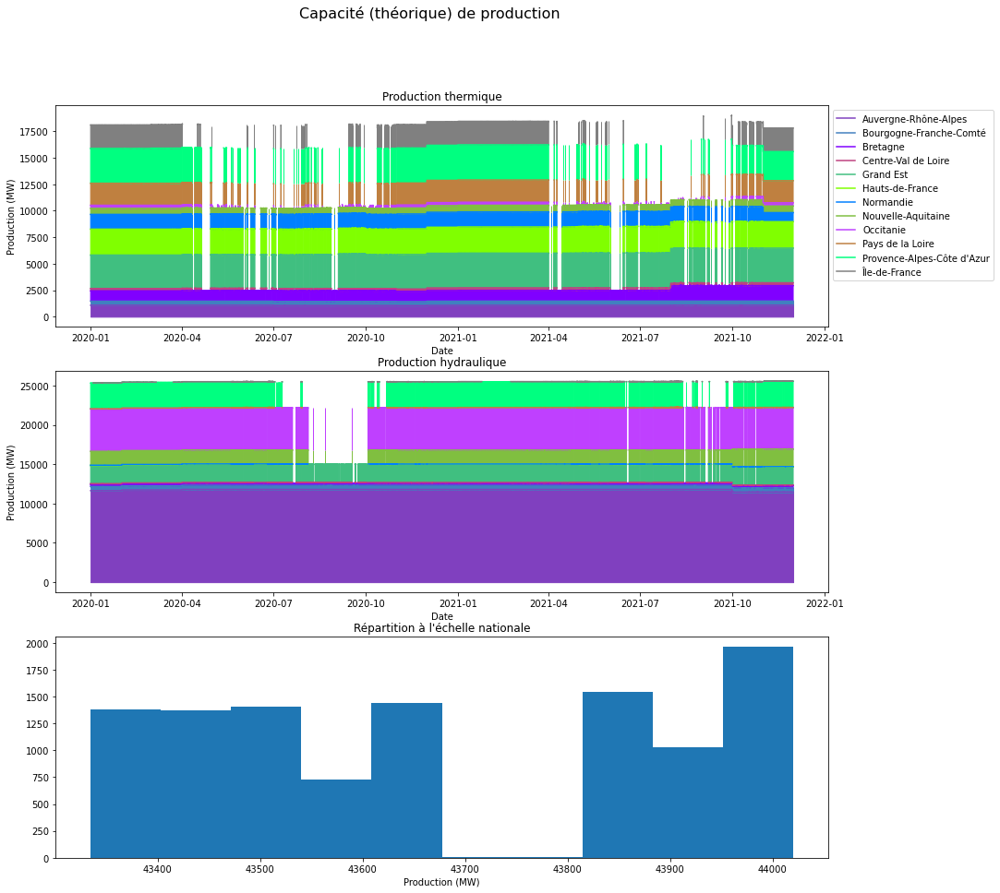

In [6]:
# 1 Kernel par période afin de présenter 1 Dataframe par période pour plus de lisibilité.
thermique = df.dropna(subset = ['TCH Thermique (%)']).iloc[:,[0,8,17]]
hydraulique = df.dropna(subset = ['TCH Hydraulique (%)']).iloc[:,[0,12,25]]

# Création d'une colonne par région pour la production et le TCH thermiques
for i in range(len(regions)):
    thermique['Production '+regions[i]+' (MW)'] = thermique[thermique['Région']==regions[i]]['Thermique (MW)']
    hydraulique['Production '+regions[i]+' (MW)'] = hydraulique[hydraulique['Région']==regions[i]]['Hydraulique (MW)']
    thermique['TCH '+regions[i]+' (%)'] = thermique[thermique['Région']==regions[i]]['TCH Thermique (%)']
    hydraulique['TCH '+regions[i]+' (%)'] = hydraulique[hydraulique['Région']==regions[i]]['TCH Hydraulique (%)']

thermique.drop(['Région', 'Thermique (MW)', 'TCH Thermique (%)'], axis=1, inplace=True) # Suppression des colonnes devenues inutiles 
hydraulique.drop(['Région', 'Hydraulique (MW)', 'TCH Hydraulique (%)'], axis=1, inplace=True) # Suppression des colonnes devenues inutiles 
thermique = thermique.groupby(thermique.index).max() # Groupement selon la date
hydraulique = hydraulique.groupby(hydraulique.index).max() # Groupement selon la date
thermique.fillna(0, inplace=True) # Les NaN restants sont associés à une absence de production : traitement plus simple en les remplaçant par 0
hydraulique.fillna(0, inplace=True) # Les NaN restants sont associés à une absence de production : traitement plus simple en les remplaçant par 0

# Initialisation de listes associées aux productions thermiques et hydrauliques pour permettre une superposition simplifiée des courbes dans une boucle
prod_thermique = []
prod_hydraulique = []

# Superposition des valeurs de production régionale dans la liste
for i in range(len(regions)):
    prod_thermique.append(100*thermique['Production '+regions[i]+' (MW)']/thermique['TCH '+regions[i]+' (%)'] if i==0 else 100*thermique['Production '+regions[i]+' (MW)']/thermique['TCH '+regions[i]+' (%)']+prod_thermique[i-1])
    prod_hydraulique.append(100*hydraulique['Production '+regions[i]+' (MW)']/hydraulique['TCH '+regions[i]+' (%)'] if i==0 else 100*hydraulique['Production '+regions[i]+' (MW)']/hydraulique['TCH '+regions[i]+' (%)']+prod_hydraulique[i-1])

# Courbes des productions thermiques et hydrauliques superposées
fig = plt.figure(figsize = (15,15))
plt.suptitle('Capacité (théorique) de production', fontsize=16)
for i in range(len(regions)):
    plt.subplot(3,1,1)
    plt.plot(prod_thermique[i], label=regions[i], color=couleurs_regions[i])
    plt.fill_between(thermique.index, prod_thermique[i-1] if i>0 else 0, prod_thermique[i], color=couleurs_regions[i])
    plt.title('Production thermique')
    plt.xlabel('Date')
    plt.ylabel('Production (MW)')
    plt.legend(bbox_to_anchor=(1.0, 1.0), loc='upper left');
    
    plt.subplot(3,1,2)
    plt.plot(prod_hydraulique[i], label=regions[i], color=couleurs_regions[i])
    plt.fill_between(hydraulique.index, prod_hydraulique[i-1] if i>0 else 0, prod_hydraulique[i], color=couleurs_regions[i])
    plt.title('Production hydraulique')
    plt.xlabel('Date')
    plt.ylabel('Production (MW)');

# Répartition des valeurs de production thermique
plt.subplot(3,1,3)
plt.title("Répartition à l'échelle nationale")
plt.hist(prod_thermique[len(regions)-1]+prod_hydraulique[len(regions)-1])
plt.xlabel('Production (MW)')
prod_thermique_hydraulique_mini = (prod_thermique[len(regions)-1]+prod_hydraulique[len(regions)-1]).min()
print("Productions thermique + hydraulique minimales à l'échelle nationale :",round(prod_thermique_hydraulique_mini),'MW.')

On note une capacité de production constante pour les filières thermique et hydraulique sur une partie de l'année 2021 avec néanmoins des cas de chute de plusieurs jours sur certaines régions. Un minimum est néanmoins toujours assuré car ce profil est compensé entre les 2 filières et les régions.

Il est ainsi intéressant d'étudier la distribution de la capacité totale de production des 2 filières combinées. Il en ressort des valeurs très concentrées entre 43 et 44 GW, d'où la précision du résultat minimal, cette fois-ci directement issu de la plus faible valeur relevée par la somme des capacités des filières.

## 3. Dans le pire scénario, les productions stables (nucléaires, thermiques et hydrauliques) permettent-elles d'assurer les consommations les plus élevées ?

Nous souhaitons confronter les consommations les plus élevées aux productions des filières maîtrisées – nucléaire, thermique et hydraulique – afin de vérifier si celles-ci suffiraient même en scénario défavorable.

Dans cette logique, nous devons établir un ordre de grandeur maximal de consommation attendue, de la même manière que nous l'avons fait pour les productions minimales.

Consommation maximale à l'échelle nationale (95 %): 89318 MW.


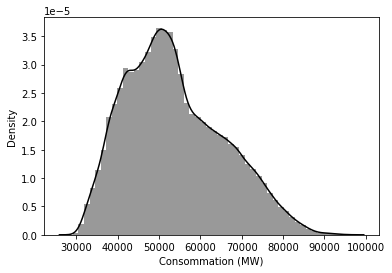

In [7]:
# Suppression des valeurs manquantes de consommation
conso = df.dropna(subset = ['Consommation (MW)'])

conso = conso.groupby(conso.index, as_index=True).sum().iloc[:,4] # Sommes des consommations régionales par année pour récupérer la valeur nationale

sns.distplot(conso, kde=True, color='k')

conso_maxi_95 = conso.mean()+3*conso.std()
print("Consommation maximale à l'échelle nationale (95 %):",round(conso_maxi_95),'MW.')

In [8]:
print("Production restant à fournir pour assurer la consommation maximale :",round(conso_maxi_95-prod_thermique_hydraulique_mini-prod_nucleaire_mini_95),'MW.')

Production restant à fournir pour assurer la consommation maximale : 22890 MW.


<p>Les productions "stables" pourraient donc ne pas suffire à elles seules à éviter un Black-Out en situation défavorable.
<p>Deux pistes sont alors exploitables en parallèle d'une prédiction de la consommation :
<ul><li><i>Augmenter la production</i> : nous nous focaliserons cette fois sur les énergies renouvelables.</li>
<li><i>Réduire la consommation</i> : l'année "Covid" représente une source d'information particulièrement riche car elle permet de se représenter l'écart de consommation entre une activité industrielle normale et sa réduction à l'essentiel.</li></ul>

L'étape de modélisation s'articulera donc en 2 axes :
<ul><li><b>I- Consommation :</b>
    <ul><li><b><i>Aspect temporel</i></b> : on étudie la consommation passée pour en déduire la consommation future. Une première approche naïve introduira cette étude et sera suivie d'études plus poussées utilisant les modèles SARIMA et Holt-Winters.</li>
        <li><b><i>Corrélation avec la température</i></b>, facteur défini par les visualisation comme ayant un fort impact. L'objectif est de permettre un éventuel ajustement des prédictions temporelles en cas de conditions météorologiques anormales.</li></ul>
    <li><b>II- Productions renouvelables – éoliennes et solaires :</b> à défaut de les contrôler, leur prédiction permettra de mettre en place des ajustements sur les autres formes de production ou, éventuellement, sur la consommation.</li></ul>


Ce Notebook traitera l'étape des modélisations associées à la <b><u><i>consommation</i></u></b>.

# II- Première approche : corrélation entre la consommation moyenne d'une période et la consommation maximale à venir

L'objectif est d'avoir un premier aperçu d'une corrélation entre consommation moyenne et consommation maximale. On détaille ici la logique imposée par le travail sur des données temporelles. Des modélisations plus poussées sur les données de consommation nécessitant l'application de modèles adaptés seront proposées dans les paragraphes suivants.

## 1. Périodes les plus fortement corrélées

Les bases de temps associées aux meilleures prédictions de pics de consommation sont :
19.0 heures
5.0 jours


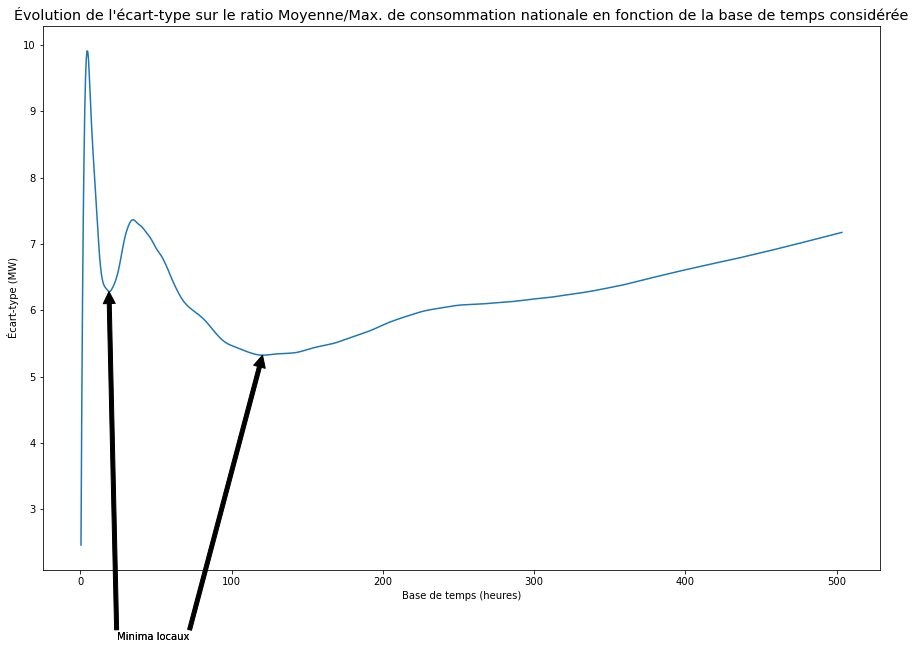

In [9]:
from scipy.signal import argrelextrema

# Suppression des valeurs manquantes de consommation
conso = df.dropna(subset = ['Consommation (MW)'])

# Fonctions de groupement de consommation
def group_conso(dframe, variable):
    dframe.columns = dframe.columns.str.rstrip(' (MW)')
    return pd.merge(dframe.groupby(variable, as_index=True).max().iloc[:,6],dframe.groupby(variable, as_index=True).mean().iloc[:,3], right_index = True, left_index = True, suffixes=[' max. (MW)', ' moyenne (MW)']).join(dframe.groupby(variable, as_index=True).mean().iloc[:,3]/dframe.groupby(variable, as_index=True).max().iloc[:,6]*100)

conso = conso.groupby(conso.index, as_index=True).sum().iloc[:,[4,5]] # Sommes des consommations et productions régionales par année pour récupérer la valeur nationale

ecart_type = []
for i in range(1,1008): # Base de temps jusqu'à 3 semaine (1008 demi-heures) : possibilité de monter la valeur jusqu'à 17532 pour exprimer la logique sur une base annuelle par curiosité mais gros ralentissement du code pour résultats identiques
    conso['Consommation moyenne (MW)'] = conso['Consommation (MW)'].rolling(i).mean() # Saison
    conso['Consommation max. (MW)'] = conso['Consommation (MW)'].rolling(i).max().shift(-i)
    conso['Ratio'] = conso['Consommation moyenne (MW)']/conso['Consommation max. (MW)'] * 100
    ecart_type.append(conso['Ratio'].std())

bases_temps = argrelextrema(np.array(ecart_type), np.less) # Multiples de la base de temps (00:30) associés aux minimum locaux d'écarts-types sur les ratios

fig = plt.figure(figsize = (15,10))
plt.title("Évolution de l'écart-type sur le ratio Moyenne/Max. de consommation nationale en fonction de la base de temps considérée", fontsize="x-large")
plt.plot(np.arange(1,1008)/2, ecart_type)
for i in range(len(bases_temps[0])):
                              plt.annotate('Minima locaux',ha = 'center', va = 'bottom',xytext = (48, 1),xy = (bases_temps[0][i]/2,ecart_type[bases_temps[0][i]]),arrowprops = {'facecolor' : 'black'})
plt.xlabel('Base de temps (heures)')
plt.ylabel('Écart-type (MW)')

print('Les bases de temps associées aux meilleures prédictions de pics de consommation sont :')
for i in range(len(bases_temps[0])):
    print(round(bases_temps[0][i]/2,1), 'heures') if bases_temps[0][i]<48 else print(round(bases_temps[0][i]/48,1), 'jours')
    
plt.savefig('ratios_consos.png')

<p>On a relevé 2 bases de temps associées aux 2 minima locaux sur l'écart-type du ratio entre la consommation maximale à venir et sa moyenne passée.
<p>Cela correspond à 19 heures et à 5 jours.
<p>L'étude des bases de temps se focalise sur 3 semaines afin d'optimiser les performances ; en changeant les paramètres pour prendre en compte jusqu'à plusieurs mois, l'écart-type ne fait que monter linéairement, ce qui ne présente aucun intérêt supplémentaire pour la suite de notre étude.
<p>Ci-dessous sont représentées les courbes de consommation maximales, moyennes ainsi que leur ratio sur les bases de temps retenues pour compléter cette explication.

## 2. Consommation sur les bases de temps retenues

No handles with labels found to put in legend.


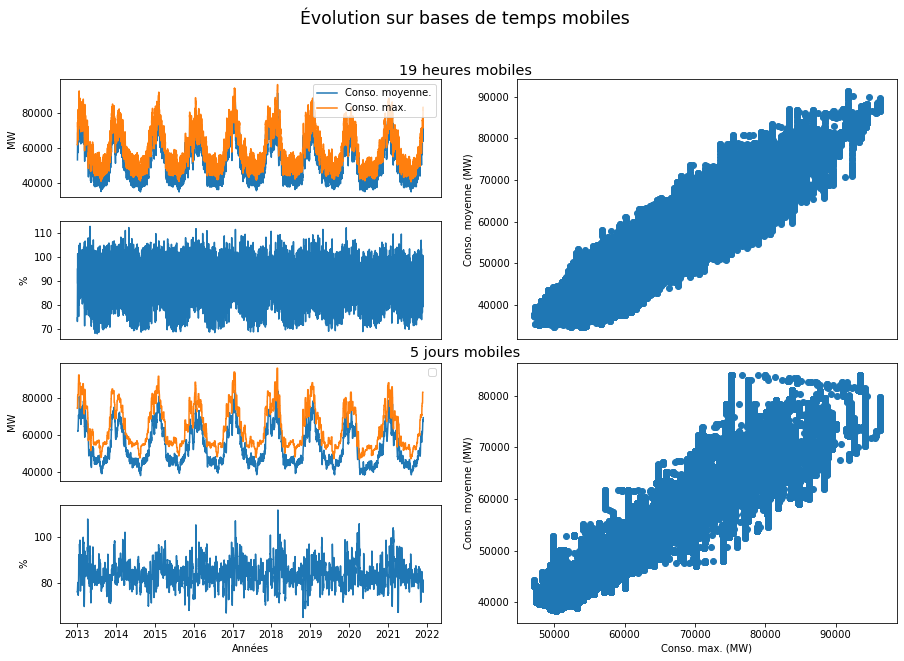

In [10]:
bases_temps_approx = ['19 heures mobiles', '5 jours mobiles'] # Liste des bases de temps associées aux conclusions précédentes

fig = plt.figure(figsize = (15,10))
plt.suptitle('Évolution sur bases de temps mobiles', fontsize='xx-large')
for i in range(len(bases_temps[0])):
    plt.subplot2grid((len(bases_temps[0])*2,2), (2*i,0))
    plt.figtext(0.5, 1-(i/(len(bases_temps[0])+0.55)+1/(2*(len(bases_temps[0])+2.6))), bases_temps_approx[i], ha='center', va='center', fontsize='x-large')
    plt.plot(conso['Consommation (MW)'].rolling(bases_temps[0][i]).mean(),label=('Conso. moyenne.'if i==0 else ''))
    plt.plot(conso['Consommation (MW)'].rolling(bases_temps[0][i]).max().shift(-bases_temps[0][i]),label=('Conso. max.'if i==0 else ''))
    plt.legend()
    plt.ylabel('MW')
    plt.xticks([])
    plt.subplot2grid((len(bases_temps[0])*2,2), (2*i+1,0))
    plt.plot(100*conso['Consommation (MW)'].rolling(bases_temps[0][i]).mean()/conso['Consommation (MW)'].rolling(bases_temps[0][i]).max().shift(-bases_temps[0][i]))
    plt.xlabel('Années' if i==len(bases_temps[0])-1 else '')
    plt.ylabel('%')
    plt.xticks() if i==len(bases_temps[0])-1 else plt.xticks([])
    plt.subplot2grid((len(bases_temps[0])*2,2), (2*i,1), rowspan=2)
    plt.scatter(conso['Consommation (MW)'].rolling(bases_temps[0][i]).max().shift(-bases_temps[0][i]),conso['Consommation (MW)'].rolling(bases_temps[0][i]).mean())
    plt.xlabel('Conso. max. (MW)' if i==len(bases_temps[0])-1 else '')
    plt.ylabel('Conso. moyenne (MW)')
    plt.xticks() if i==len(bases_temps[0])-1 else plt.xticks([])
    
plt.savefig('valeurs_mobiles.png')

<p>Les courbes précédentes représentent de façon plus visuelle ce qui a été expliqué précédemment.

## 3. Corrélation ?

,19 heures mobiles,5 jours mobiles
Pearson Coeff,0.94,0.93
p-value,0.00,0.00


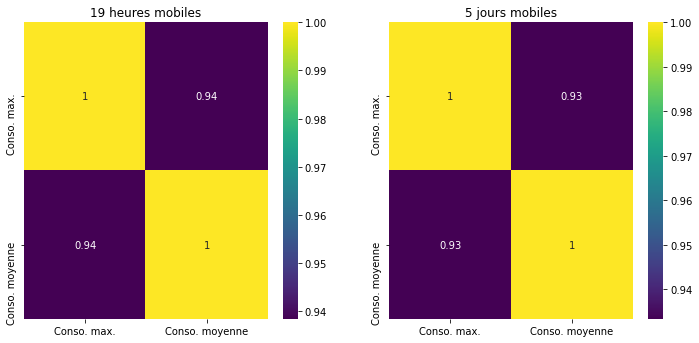

In [11]:
# Création des variables mobiles de consommations max. et moyennes pour les 2 bases de temps choisies
conso['Consommation max. sur 19 heures (MW)'] = conso['Consommation (MW)'].rolling(bases_temps[0][0]).max().shift(-bases_temps[0][0])
conso['Consommation moyenne sur 19 heures (MW)'] = conso['Consommation (MW)'].rolling(bases_temps[0][0]).mean()
conso['Consommation max. sur 5 jours (MW)'] = conso['Consommation (MW)'].rolling(bases_temps[0][1]).max().shift(-bases_temps[0][1])
conso['Consommation moyenne sur 5 jours (MW)'] = conso['Consommation (MW)'].rolling(bases_temps[0][1]).mean()
conso.dropna(inplace=True)
plt.figure(figsize=(12, 12))  # Taille de la figure

# Méthode de Pearson : corrélation consommation max./moyenne ?
for i in range(0,2):
    plt.subplot(2,2,i+1)
    plt.title(bases_temps_approx[i])
    sns.heatmap(conso[[conso.columns.to_list()[5+2*i],conso.columns.to_list()[6+2*i]]].corr(), annot=True, cmap='viridis', xticklabels=['Conso. max.','Conso. moyenne'], yticklabels=['Conso. max.','Conso. moyenne']);
corr_moy_max = pd.DataFrame({bases_temps_approx[0]:pearsonr(conso[conso.columns.to_list()[5]],conso[conso.columns.to_list()[6]]),bases_temps_approx[1]:pearsonr(conso[conso.columns.to_list()[7]],conso[conso.columns.to_list()[8]])},index=['Pearson Coeff','p-value'])
plt.savefig('correlation_moyenne_max.png')
corr_moy_max.head().round(2)

<p>La p-value est presque nulle. On rejette donc l'hypothèse nulle de l'indépendance des consommations maximales et moyennes sur 19 heures et 5 jours.
<p>Les coefficients de Pearson très élevés – supérieurs à 0,9 – justifient une forte corrélation entre ces variables.
<p>Ces 2 bases de temps peuvent être utilisées pour une première approche de prédictions à l'aide de régressions linéaires. En effet, toutes deux présentent un intérêt. Une prédiction sur 19 heures permettra d'identifier un éventuel black-out de façon plus précise dans le temps. Une prédiction sur 5 jours permettra une meilleure anticipation.

## 4. Régression linéaire

In [12]:
conso_moyenne_19h = conso[['Consommation (MW)']].rolling(bases_temps[0][0]).mean().dropna()
conso_max_19h = conso['Consommation (MW)'].rolling(bases_temps[0][0]).max().shift(-bases_temps[0][0]).dropna()
conso_moyenne_19h = conso_moyenne_19h.drop(conso_moyenne_19h.index[[-1]])

In [13]:
conso_moyenne_5j = conso[['Consommation (MW)']].rolling(bases_temps[0][1]).mean().dropna()
conso_max_5j = conso['Consommation (MW)'].rolling(bases_temps[0][1]).max().shift(-bases_temps[0][1]).dropna()
conso_moyenne_5j = conso_moyenne_5j.drop(conso_moyenne_5j.index[[-1]])

In [14]:
lr_19h = LinearRegression()
lr_5j = LinearRegression()
lr_19h.fit(conso_moyenne_19h, conso_max_19h)
lr_5j.fit(conso_moyenne_5j, conso_max_5j)

LinearRegression()

In [15]:
print('Base de temps = 19 heures')
print('Intercept :',round(lr_19h.intercept_))
print('Coeff :',round(lr_19h.coef_[0],2))
print('Base de temps = 5 jours')
print('Intercept :',round(lr_5j.intercept_))
print('Coeff :',round(lr_5j.coef_[0],2))

Base de temps = 19 heures
Intercept : 5285
Coeff : 1.03
Base de temps = 5 jours
Intercept : 5758
Coeff : 1.09


In [16]:
print('Base de temps = 19 heures')
cross_validate(lr_19h, conso_moyenne_19h, conso_max_19h, return_train_score=True, cv=4)

Base de temps = 19 heures


{'fit_time': array([0.01396537, 0.01097012, 0.01296711, 0.00997567]),
 'score_time': array([0.00199366, 0.00299001, 0.00199342, 0.00199199]),
 'test_score': array([0.98196985, 0.98091111, 0.98315459, 0.98098361]),
 'train_score': array([0.98200672, 0.9826655 , 0.98194388, 0.98230021])}

In [17]:
print('Base de temps = 19 heures')
print('Test score moyen :',round(cross_validate(lr_19h, conso_moyenne_19h, conso_max_19h, return_train_score=True, cv=4)['test_score'].mean(),2))

pred_conso_max_19h = lr_19h.predict(conso_moyenne_19h)
residus = pred_conso_max_19h - conso_max_19h
residus.describe()

Base de temps = 19 heures
Test score moyen : 0.98


count    1.542360e+05
mean     1.477260e-12
std      1.495519e+03
min     -8.776605e+03
25%     -8.440355e+02
50%      1.099396e+02
75%      1.056504e+03
max      3.867337e+03
Name: Consommation (MW), dtype: float64

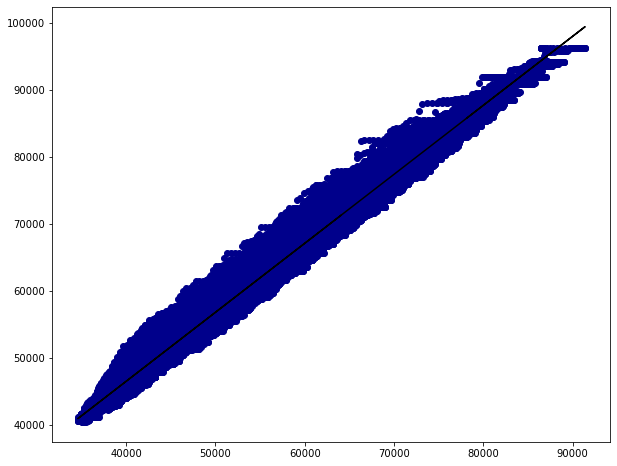

In [18]:
plt.figure(figsize=(10, 8))

plt.scatter(conso_moyenne_19h, conso_max_19h, color='darkblue')
plt.plot(conso_moyenne_19h, pred_conso_max_19h ,color='k');

In [19]:
print('Base de temps = 5 jours')
cross_validate(lr_5j, conso_moyenne_5j, conso_max_5j, return_train_score=True, cv=4)

Base de temps = 5 jours


{'fit_time': array([0.01396203, 0.01197124, 0.00798488, 0.01495647]),
 'score_time': array([0.00199604, 0.00299239, 0.002985  , 0.00299168]),
 'test_score': array([0.97413698, 0.97132426, 0.97415244, 0.97275512]),
 'train_score': array([0.97327568, 0.97463082, 0.97375195, 0.97365882])}

In [20]:
print('Base de temps = 5 jours')
print('Test score moyen :',round(cross_validate(lr_5j, conso_moyenne_5j, conso_max_5j, return_train_score=True, cv=4)['test_score'].mean(),2))

pred_conso_max_5j = lr_5j.predict(conso_moyenne_5j)
residus = pred_conso_max_5j - conso_max_5j
residus.describe()

Base de temps = 5 jours
Test score moyen : 0.97


count    1.540330e+05
mean    -4.427747e-12
std      1.827367e+03
min     -1.132521e+04
25%     -9.894821e+02
50%      1.204646e+02
75%      1.252479e+03
max      4.756031e+03
Name: Consommation (MW), dtype: float64

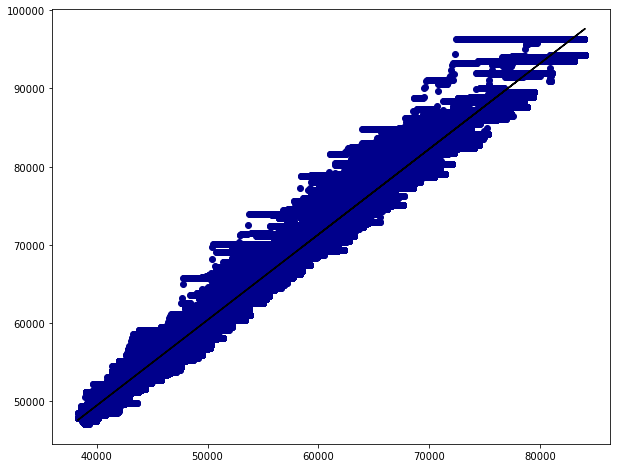

In [21]:
plt.figure(figsize=(10, 8))

plt.scatter(conso_moyenne_5j, conso_max_5j, color='darkblue')
plt.plot(conso_moyenne_5j, pred_conso_max_5j ,color='k');

## 5. Synthèse

Ces données démontrent une première approche  naïve d'estimation des pics de consommation à partir des données passées. Nous allons reprendre cette approche à travers des modèles plus adaptés : Holt Winter et Sarima.

# Modélisation sur la région Nouvelle Aquitaine

Les résultats obtenus précédemment nous montre qu'il y a une corrélation des résultats sur une base de 19H00. 19HOO est une base proche d'une journée. elle n'est pas d'une journée parce que les résultats sont différent d'un région à une autre.
Nous allons donc poursuivre l'étude sur une région. nous avons choisi la région Nouvelle Aquitaine.

In [23]:
# traitement des données consommation
df2 = pd.read_csv('eco2mix-regional-cons-def.csv', sep=';')
energie = pd.DataFrame(df2, columns=['Région','Date - Heure','Date', 'Heure', 'Consommation (MW)', 'Solaire (MW)','Eolien (MW)'])
energie

,Région,Date - Heure,Date,Heure,Consommation (MW),Solaire (MW),Eolien (MW)
0,Bourgogne-Franche-Comté,2013-01-01T00:00:00+01:00,2013-01-01,00:00,NaN,NaN,NaN
1,Occitanie,2013-01-01T00:00:00+01:00,2013-01-01,00:00,NaN,NaN,NaN
2,Centre-Val de Loire,2013-01-01T00:00:00+01:00,2013-01-01,00:00,NaN,NaN,NaN
3,Normandie,2013-01-01T00:00:00+01:00,2013-01-01,00:00,NaN,NaN,NaN
4,Pays de la Loire,2013-01-01T00:00:00+01:00,2013-01-01,00:00,NaN,NaN,NaN
...,...,...,...,...,...,...,...
1875451,Provence-Alpes-Côte d'Azur,2021-11-30T23:30:00+01:00,2021-11-30,23:30,6663.0,0.0,35.0
1875452,Centre-Val de Loire,2021-11-30T23:30:00+01:00,2021-11-30,23:30,2912.0,0.0,1022.0
1875453,Bourgogne-Franche-Comté,2021-11-30T23:30:00+01:00,2021-11-30,23:30,3120.0,0.0,635.0
1875454,Bretagne,2021-11-30T23:30:00+01:00,2021-11-30,23:30,3208.0,0.0,672.0


In [24]:
# traitement des données météo
meteo_utile = pd.DataFrame(meteo,columns=['Date', 'Direction du vent moyen 10 mn', 'Vitesse du vent moyen 10 mn', 'Température', 'Humidité', 'Visibilité horizontale', 'region (name)'])
meteo_utile = meteo_utile.rename(columns={"Date":"Date - Heure"})
meteo_utile = meteo_utile.rename(columns={"region (name)":"Région"})

In [25]:
# fusionner les data consommation et conditions météo
meteo_data = energie.merge(meteo_utile, on=['Date - Heure', 'Région'])
meteo_data.head()

,Région,Date - Heure,Date,Heure,Consommation (MW),Solaire (MW),Eolien (MW),Direction du vent moyen 10 mn,Vitesse du vent moyen 10 mn,Température,Humidité,Visibilité horizontale
0,Bourgogne-Franche-Comté,2013-01-01T01:00:00+01:00,2013-01-01,01:00,2289.0,0.0,105.0,190.0,2.1,275.85,88.0,22000.0
1,Nouvelle-Aquitaine,2013-01-01T01:00:00+01:00,2013-01-01,01:00,5422.0,0.0,185.0,180.0,8.2,279.35,81.0,45000.0
2,Nouvelle-Aquitaine,2013-01-01T01:00:00+01:00,2013-01-01,01:00,5422.0,0.0,185.0,180.0,8.7,280.95,92.0,10000.0
3,Nouvelle-Aquitaine,2013-01-01T01:00:00+01:00,2013-01-01,01:00,5422.0,0.0,185.0,270.0,9.8,285.35,88.0,NaN
4,Nouvelle-Aquitaine,2013-01-01T01:00:00+01:00,2013-01-01,01:00,5422.0,0.0,185.0,190.0,5.1,281.75,97.0,NaN


In [26]:
# regrouper par date et par région
meteo_region = meteo_data.groupby(['Date', 'Région']).mean()
meteo_region = meteo_region.reset_index()

meteo_region.head()

,Date,Région,Consommation (MW),Solaire (MW),Eolien (MW),Direction du vent moyen 10 mn,Vitesse du vent moyen 10 mn,Température,Humidité,Visibilité horizontale
0,2013-01-01,Auvergne-Rhône-Alpes,7554.500,5.125,124.750,195.0000,4.203125,280.26250,79.34375,19296.875
1,2013-01-01,Bourgogne-Franche-Comté,2353.750,1.500,81.125,225.0000,3.737500,278.67500,89.75000,28375.000
2,2013-01-01,Bretagne,2595.875,9.000,136.875,282.8125,5.159375,281.65625,80.21875,27840.000
3,2013-01-01,Centre-Val de Loire,2197.750,9.250,274.750,251.8750,3.962500,280.83750,87.50000,22937.500
4,2013-01-01,Grand Est,4666.375,5.625,895.500,216.5000,4.307500,278.95000,83.32500,29450.000


In [27]:
# grouper par région aquitaine
meteo_region_Aquitaine = meteo_region.loc[meteo_region['Région'] == 'Nouvelle-Aquitaine']
meteo_region_Aquitaine = meteo_region_Aquitaine.reset_index()
meteo_region_Aquitaine.head()

# target conso (MW) 
target_Aquitaine = pd.DataFrame(meteo_region_Aquitaine, columns=['Consommation (MW)'])


# supression de la première ligne de target pour avoir les données à la date N pour les données et N +1 pour la target
target_Aquitaine = target_Aquitaine[1:]



In [28]:
# création des données target pour entrainement et pour comparaison avec la prédiction
train_target_Aquitaine = target_Aquitaine.iloc[:2000,:]
test_target_Aquitaine = target_Aquitaine.iloc[2000:,:]

# réinitialiser l'index pour les données pour comparer avec la prédiction
test_target_Aquitaine = test_target_Aquitaine.reset_index()
test_target_Aquitaine.drop(['index'], axis = 1, inplace=True)
print(test_target_Aquitaine.head())

   Consommation (MW)
0           4180.875
1           4407.250
2           4466.750
3           4562.500
4           4543.875


In [29]:
# data météo aquitaine
meteo_region_Aquitaine.drop(['index','Date', 'Région'], axis = 1, inplace=True)
print(meteo_region_Aquitaine.head())

   Consommation (MW)  Solaire (MW)  Eolien (MW)  \
0           4955.125        34.875       76.750   
1           5964.750        64.750       21.250   
2           6198.500        32.125       20.375   
3           6045.250        16.375       11.375   
4           5741.500        17.375       29.250   

   Direction du vent moyen 10 mn  Vitesse du vent moyen 10 mn  Température  \
0                         258.25                       4.5150     281.8500   
1                         243.25                       2.1975     278.8250   
2                         144.50                       1.3500     280.7775   
3                          69.50                       2.4900     281.2325   
4                          68.00                       2.6800     279.8925   

   Humidité  Visibilité horizontale  
0    87.825            26727.272727  
1    87.700            21936.363636  
2    88.850            20654.545455  
3    92.350            13528.000000  
4    91.525             9512.00000

In [30]:
# supression de la dernière ligne pour avoir le même nombre de jours de données
meteo_region_Aquitaine = meteo_region_Aquitaine.iloc[:-1]
print(meteo_region_Aquitaine.head())

   Consommation (MW)  Solaire (MW)  Eolien (MW)  \
0           4955.125        34.875       76.750   
1           5964.750        64.750       21.250   
2           6198.500        32.125       20.375   
3           6045.250        16.375       11.375   
4           5741.500        17.375       29.250   

   Direction du vent moyen 10 mn  Vitesse du vent moyen 10 mn  Température  \
0                         258.25                       4.5150     281.8500   
1                         243.25                       2.1975     278.8250   
2                         144.50                       1.3500     280.7775   
3                          69.50                       2.4900     281.2325   
4                          68.00                       2.6800     279.8925   

   Humidité  Visibilité horizontale  
0    87.825            26727.272727  
1    87.700            21936.363636  
2    88.850            20654.545455  
3    92.350            13528.000000  
4    91.525             9512.00000

In [31]:
# séparation pour prédiction
train_meteo_Aquitaine = meteo_region_Aquitaine.iloc[:2000,:]
test_meteo_Aquitaine = meteo_region_Aquitaine.iloc[2000:,:]

# index réinitialiser l'index
test_meteo_Aquitaine = test_meteo_Aquitaine.reset_index()
test_meteo_Aquitaine.drop(['index'], axis = 1, inplace=True)
print(test_meteo_Aquitaine.head())

   Consommation (MW)  Solaire (MW)  Eolien (MW)  \
0           3522.625       640.000      322.125   
1           4180.875       683.500      380.000   
2           4407.250       668.625      322.375   
3           4466.750       583.875      175.375   
4           4562.500       612.750      322.125   

   Direction du vent moyen 10 mn  Vitesse du vent moyen 10 mn  Température  \
0                          71.00                       4.1300     293.2300   
1                          45.25                       4.5400     294.1950   
2                          63.50                       3.8350     296.2875   
3                         146.75                       3.8275     296.2150   
4                         111.00                       4.1050     295.9675   

   Humidité  Visibilité horizontale  
0    57.750            35798.378378  
1    55.850            33392.058824  
2    55.800            34722.162162  
3    65.400            26247.714286  
4    60.225            25101.62162

## Prédiction régression linéaire

In [38]:
from sklearn.metrics import r2_score
slr = LinearRegression()

slr.fit(train_meteo_Aquitaine, train_target_Aquitaine)

y_train_predict = slr.predict(train_meteo_Aquitaine)

print('interception de la régression linéaire: ')
print(slr.intercept_)
print('coefficient de la pente de la régression linéaire: ', slr.coef_)

rmse_train = (np.sqrt(mean_squared_error(train_target_Aquitaine, y_train_predict)))
r2_train = r2_score(train_target_Aquitaine, y_train_predict)

print('Entrainement')
print('Nombre de données :',len(y_train_predict))
print("La performance du modèle sur la base d'apprentissage")
print('--------------------------------------')
print("L'erreur quadratique moyenne est {}".format(rmse))
print('le score R2 est {}'.format(r2_train))
print('\n')

y_test_predict_1 = slr.predict(test_meteo_Aquitaine)
rmse_test = (np.sqrt(mean_squared_error(test_target_Aquitaine, y_test_predict_1)))
r2 = r2_score(test_target_Aquitaine, y_test_predict_1)

print('Prédiction')
print('Nombre de données de la prédiction:',len(y_test_predict_1))
print("La performance du modèle sur la base d'apprentissage")
print('--------------------------------------')
print("L'erreur quadratique moyenne est {}".format(rmse_test))
print('le score R2 est {}', r2)
print('\n')
print("Performance de la prédiction avec la méthode additionnelle:")
print("Moyenne des prédictions:", np.mean(y_test_predict_1))
print("Maximum des prédictions:", np.max(y_test_predict_1))
print("Minimum des prédictions:", np.min(y_test_predict_1))
print("Moyenne de la consommation réelle:", np.mean(test_target_Aquitaine))
print("Maximum de la consommation réelle:", np.max(test_target_Aquitaine))
print("Minimum de la consommation réelle:", np.min(test_target_Aquitaine))


interception de la régression linéaire: 
[9549.68744041]
coefficient de la pente de la régression linéaire:  [[ 7.94688514e-01 -9.54043511e-02 -1.26533747e-01 -1.94302761e-01
   3.01331839e+01 -2.99904146e+01 -2.01881053e-01  1.30515107e-03]]
Entrainement
Nombre de données : 2000
La performance du modèle sur la base d'apprentissage
--------------------------------------
L'erreur quadratique moyenne est <function mean_squared_error at 0x00000194DE737550>
le score R2 est 0.8898402752396605


Prédiction
Nombre de données de la prédiction: 1255
La performance du modèle sur la base d'apprentissage
--------------------------------------
L'erreur quadratique moyenne est 334.4061610925266
le score R2 est {} 0.8790190293352373


Performance de la prédiction avec la méthode additionnelle:
Moyenne des prédictions: 4802.910832758947
Maximum des prédictions: 7848.7988753378395
Minimum des prédictions: 3403.2120573102293
Moyenne de la consommation réelle: Consommation (MW)    4831.774467
dtype: floa

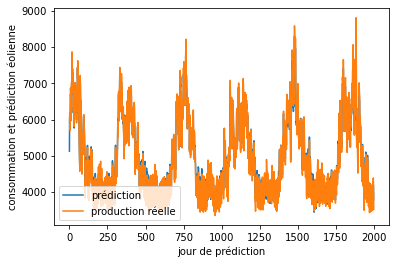

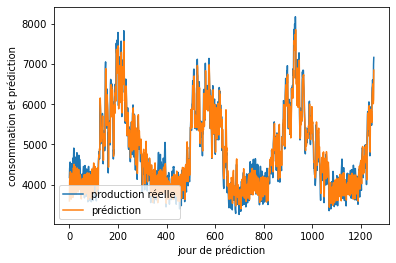

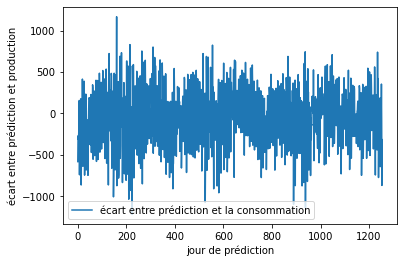

In [39]:
plt.plot(y_train_predict, label='prédiction')
plt.plot(train_target_Aquitaine, label='production réelle')
plt.xlabel('jour de prédiction')
plt.ylabel('consommation et prédiction éolienne')
plt.legend(loc='lower left')
plt.show()

# graphique prédiction
plt.plot(test_target_Aquitaine, label='production réelle')
plt.plot(y_test_predict_1, label='prédiction')
plt.xlabel('jour de prédiction')
plt.ylabel('consommation et prédiction')
plt.legend(loc='lower left')
plt.show()

add = y_test_predict_1 - test_target_Aquitaine
# graphique résidus
plt.ylabel('écart entre prédiction et production')
plt.plot(add, label='écart entre prédiction et la consommation')
plt.xlabel('jour de prédiction')
plt.legend(loc='lower left')
plt.show()

# Régression multiple

In [40]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

sk = SelectKBest(f_regression, k=3)

sk.fit(train_meteo_Aquitaine, train_target_Aquitaine)

sk_train = sk.transform(train_meteo_Aquitaine)
sk_test = sk.transform(test_meteo_Aquitaine)

In [41]:
sklr = LinearRegression()
sklr.fit(sk_train, train_target_Aquitaine)

print(sklr.score(sk_train, train_target_Aquitaine))
print(sklr.score(sk_test, test_target_Aquitaine))

0.8889129007927992
0.878424890415159


In [42]:
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.feature_selection import SelectFromModel

lr = LinearRegression()

sfm = SelectFromModel(lr)

scaler = preprocessing.StandardScaler().fit(train_meteo_Aquitaine)

X_train_scaled = scaler.transform(train_meteo_Aquitaine)

X_test_scaled = scaler.transform(test_meteo_Aquitaine)

sfm_train = sfm.fit_transform(train_meteo_Aquitaine, train_target_Aquitaine)

sfm_test = sfm.transform(X_test_scaled)

In [43]:
sfmlr = LinearRegression()
sfmlr.fit(sfm_train, train_target_Aquitaine)

print(sfmlr.score(sfm_train, train_target_Aquitaine))
print(sfmlr.score(sfm_test, test_target_Aquitaine))


y_test_predict_sfmlr = slr.predict(test_meteo_Aquitaine)
rmse_test = (np.sqrt(mean_squared_error(test_target_Aquitaine, y_test_predict_1)))
r2 = r2_score(test_target_Aquitaine, y_test_predict_sfmlr)

print('Prédiction')
print('Nombre de données de la prédiction:',len(y_test_predict_sfmlr))
print("La performance du modèle sur la base d'apprentissage")
print('--------------------------------------')
print("L'erreur quadratique moyenne est {}".format(rmse_test))
print('le score R2 est {}'.format(r2))
print('\n')
print("Performance de la prédiction avec la méthode additionnelle:")
print("Moyenne des prédictions:", np.mean(y_test_predict_sfmlr))
print("Maximum des prédictions:", np.max(y_test_predict_sfmlr))
print("Minimum des prédictions:", np.min(y_test_predict_sfmlr))
print("Moyenne de la production solaire réelle:", np.mean(test_target_Aquitaine))
print("Maximum de la production solaire réelle:", np.max(test_target_Aquitaine))
print("Minimum de la production solaire réelle:", np.min(test_target_Aquitaine))

0.6972694618428668
-1916.504642664148
Prédiction
Nombre de données de la prédiction: 1255
La performance du modèle sur la base d'apprentissage
--------------------------------------
L'erreur quadratique moyenne est 334.4061610925266
le score R2 est 0.8790190293352373


Performance de la prédiction avec la méthode additionnelle:
Moyenne des prédictions: 4802.910832758947
Maximum des prédictions: 7848.7988753378395
Minimum des prédictions: 3403.2120573102293
Moyenne de la production solaire réelle: Consommation (MW)    4831.774467
dtype: float64
Maximum de la production solaire réelle: Consommation (MW)    8169.675676
dtype: float64
Minimum de la production solaire réelle: Consommation (MW)    3264.125
dtype: float64


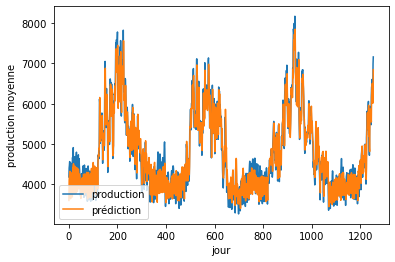

In [44]:
plt.plot(test_target_Aquitaine, label='production')
plt.plot(y_test_predict_sfmlr, label='prédiction')
plt.xlabel('jour')
plt.ylabel('production moyenne')
plt.legend(loc='lower left')
plt.show()

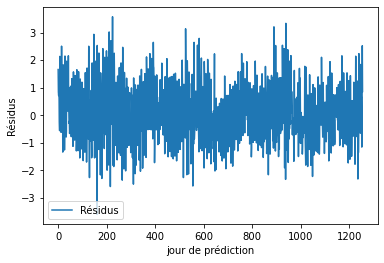

Résidus moyen Consommation (MW)    28.863634
dtype: float64
Résidus maximum Consommation (MW)    1219.673027
dtype: float64
Résidus minimum Consommation (MW)   -1168.33088
dtype: float64


In [45]:
residus = test_target_Aquitaine - y_test_predict_sfmlr
residus.describe()

residus_norm = (residus - residus.mean()) / residus.std()

plt.plot(residus_norm, label='Résidus')

plt.xlabel('jour de prédiction')
plt.ylabel('Résidus')
plt.legend(loc='lower left')
plt.show()
print('Résidus moyen', residus.mean())
print('Résidus maximum', residus.max())
print('Résidus minimum', residus.min())

# Régression polynomiale

In [46]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures

nombre de degrés : 2
La performance du modèle sur la base d'apprentissage
--------------------------------------
L'erreur quadratique moyenne est 321.6423515101448
le score R2 est 0.9059951576190932


La performance du modèle sur la base de test
--------------------------------------
L'erreur quadratique moyenne est 323.4708863587495
le score R2 est 0.8868019563408318


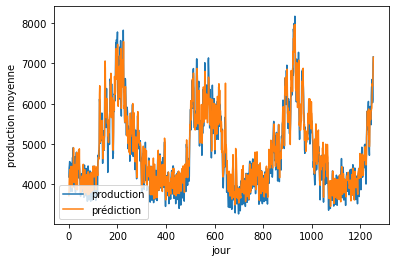

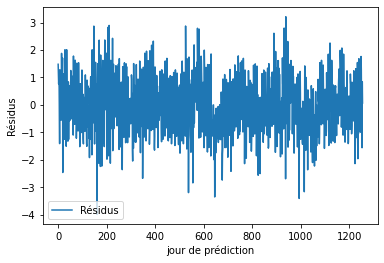

nombre de degrés : 3
La performance du modèle sur la base d'apprentissage
--------------------------------------
L'erreur quadratique moyenne est 300.5896827266444
le score R2 est 0.9178983456030959


La performance du modèle sur la base de test
--------------------------------------
L'erreur quadratique moyenne est 549.9823404769362
le score R2 est 0.6727602789381107


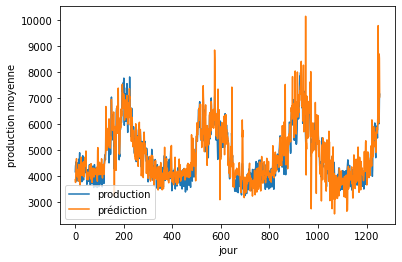

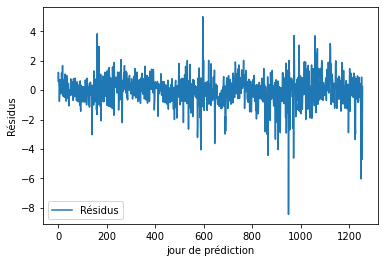

nombre de degrés : 4
La performance du modèle sur la base d'apprentissage
--------------------------------------
L'erreur quadratique moyenne est 299.3879881165604
le score R2 est 0.9185534838728732


La performance du modèle sur la base de test
--------------------------------------
L'erreur quadratique moyenne est 1600.392365991281
le score R2 est -1.770903915104458


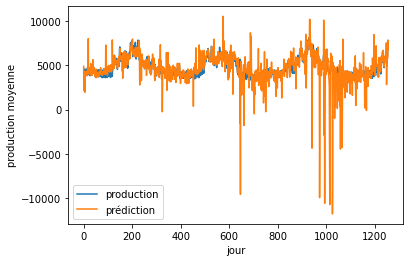

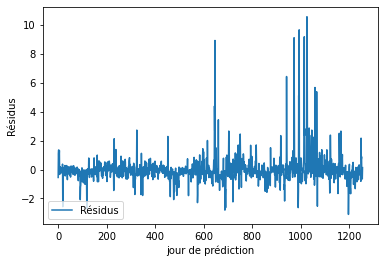

nombre de degrés : 5
La performance du modèle sur la base d'apprentissage
--------------------------------------
L'erreur quadratique moyenne est 328.4429336425625
le score R2 est 0.901977987771176


La performance du modèle sur la base de test
--------------------------------------
L'erreur quadratique moyenne est 11632.740347146997
le score R2 est -145.39714012769986


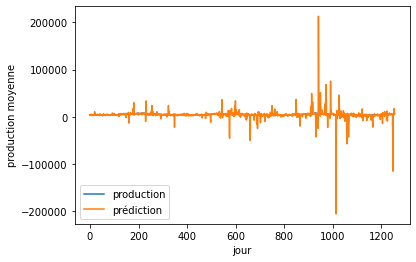

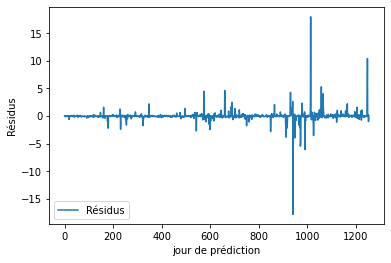

In [47]:
degree = 1
while degree < 5:
    degree = degree + 1
    print('nombre de degrés :', degree)
    #Génération de modèle
    polynomial_features= PolynomialFeatures(degree)
    X_train_poly = polynomial_features.fit_transform(train_meteo_Aquitaine)
    X_test_poly = polynomial_features.fit_transform(test_meteo_Aquitaine)
    model = LinearRegression()
    model.fit(X_train_poly, train_target_Aquitaine)
    
    y_train_predict = model.predict(X_train_poly)
    
    
    # Evaluation du model
    rmse = (np.sqrt(mean_squared_error(train_target_Aquitaine, y_train_predict)))
    r2 = r2_score(train_target_Aquitaine, y_train_predict)
    print("La performance du modèle sur la base d'apprentissage")
    print('--------------------------------------')
    print("L'erreur quadratique moyenne est {}".format(rmse))
    print('le score R2 est {}'.format(r2))
    print('\n')
    
   
    # prédiction
    y_test_predict_poly = model.predict(X_test_poly)
    # Evaluation de la prédiction
    rmse_p = (np.sqrt(mean_squared_error(test_target_Aquitaine, y_test_predict_poly)))
    r2_p = r2_score(test_target_Aquitaine, y_test_predict_poly)
 
    print('La performance du modèle sur la base de test')
    print('--------------------------------------')
    print("L'erreur quadratique moyenne est {}".format(rmse_p))
    print('le score R2 est {}'.format(r2_p))
    
    
    plt.plot(test_target_Aquitaine, label='production')
    plt.plot(y_test_predict_poly, label='prédiction')
    plt.xlabel('jour')
    plt.ylabel('production moyenne')
    plt.legend(loc='lower left')
    plt.show()
    
    # Analyse des résidus
    residus = test_target_Aquitaine - y_test_predict_poly
    residus.describe()
    residus_norm = (residus - residus.mean()) / residus.std()
    plt.plot(residus_norm, label='Résidus')
    plt.xlabel('jour de prédiction')
    plt.ylabel('Résidus')
    plt.legend(loc='lower left')
    plt.show()


# Régression par la méthode de Ridge, Lasso, ElasticNet

In [48]:
def Résidus (X, Y):
    # Analyse des résidus
    residus = X - Y
    # residus_norm = (residus - residus.mean()) / residus.std()
    plt.plot(residus, label='Résidus')
    plt.xlabel('jour de prédiction')
    plt.ylabel('Résidus')
    plt.legend(loc='lower left')
    plt.show()
    print('Résidus moyen', residus.mean())
    print('Résidus maximum', residus.max())
    print('Résidus minimum', residus.min())

In [49]:
# liste des méthodes de prédiction 
from sklearn.linear_model import ElasticNetCV
models = {
    'linear': LinearRegression(),
    'Ridge': RidgeCV(),
    'Lasso': Lasso(),
    'ElasticNetCV': ElasticNetCV(),
}

graphique selon linear
Nombre de données : 2000
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 348.184582546402
le score R2 est 0.8898402752396605


Nombre de données : 1255
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 334.4061610925266
le score R2 est 0.8790190293352373




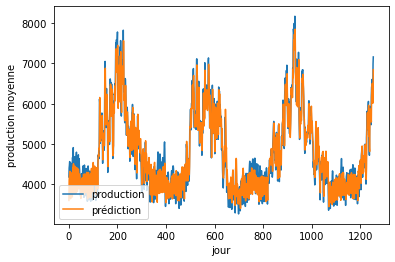

graphique selon Ridge
Nombre de données : 2000
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 348.1846600008545
le score R2 est 0.8898402262290922


Nombre de données : 1255
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 334.3865154691632
le score R2 est 0.8790332436473285




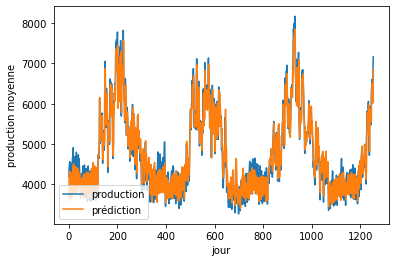

graphique selon Lasso
Nombre de données : 2000
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 348.1880732911436
le score R2 est 0.8898380664031591


Nombre de données : 1255
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 334.28804568183443
le score R2 est 0.8791044774822325




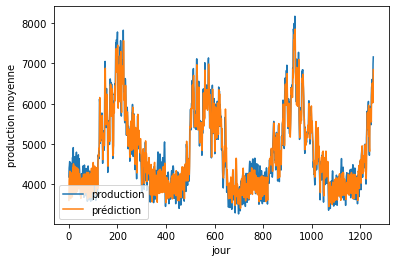

graphique selon ElasticNetCV
Nombre de données : 2000
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 363.86620362748187
le score R2 est 0.8796940220755647


Nombre de données : 1255
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 345.6659593645515
le score R2 est 0.8707347619989257




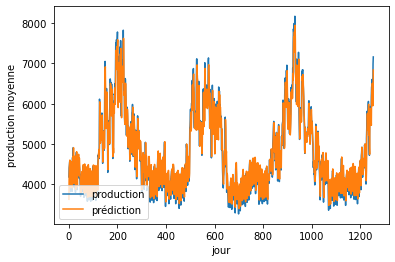

In [50]:

#Générer chaque modèle en séquence, calculer et stocker le taux de réponses correctes
for model_name, model in models.items():
    residus = 0
    print('graphique selon', model_name)
    #Génération de modèle
    
    train_predict = model.fit(train_meteo_Aquitaine, train_target_Aquitaine)
    y_train_predict = model.predict(train_meteo_Aquitaine)
    
    #prédiction
    y_test_predict = model.predict(test_meteo_Aquitaine)  
          
    #Taux de réponses correctes des données d'entraînement
    rmse_train = (np.sqrt(mean_squared_error(train_target_Aquitaine, y_train_predict)))
    r2_train = r2_score(train_target_Aquitaine, y_train_predict)    
        
    #Taux de réponses correctes des données de prédiction
    rmse_predict = (np.sqrt(mean_squared_error(test_target_Aquitaine, y_test_predict)))
    r2_predict = r2_score(test_target_Aquitaine, y_test_predict)

    # print(y_train_predict)
    print('Nombre de données :',len(y_train_predict))
    print('La performance du modèle sur la prédiction')
    print('--------------------------------------')
    print("L'erreur quadratique moyenne est {}".format(rmse_train))
    print('le score R2 est {}'.format(r2_train))
    print('\n')
        
    
    # print(y_test_predict)
    print('Nombre de données :',len(y_test_predict))
    print('La performance du modèle sur la prédiction')
    print('--------------------------------------')
    print("L'erreur quadratique moyenne est {}".format(rmse_predict))
    print('le score R2 est {}'.format(r2_predict))
    print('\n')
    
    plt.plot(test_target_Aquitaine, label='production')
    plt.plot(y_test_predict, label='prédiction')
    plt.xlabel('jour')
    plt.ylabel('production moyenne')
    plt.legend(loc='lower left')
    plt.show()
    

# Prédictions avec plusieurs jours de décalage

In [52]:
def conso_decale (X):
    test_t = 0
    y_test_predict_1 = 0
    y_test_predict_2 = 0
    y_test_predict_3 = 0
    y_test_predict_4 = 0
    y_test_predict_5 = 0
    nationale = 0
    
    # grouper par région aquitaine
    meteo_2 = meteo_region.loc[meteo_region['Région'] == X]
    meteo_2 = meteo_2.dropna()
    meteo_2 = meteo_2.reset_index()
    # target consommation (MW) 
    target_conso = pd.DataFrame(meteo_2, columns=['Consommation (MW)'])
    target_conso = target_conso.reset_index()
    target_conso.drop(['index'], axis = 1, inplace=True)
    
    temp_region = pd.DataFrame(meteo_2,columns=['Consommation (MW)', 'Température', 'Direction du vent moyen 10 mn' , 'Vitesse du vent moyen 10 mn' , 'Humidité' , 'Visibilité horizontale'])
    temp_region = temp_region.reset_index()
    temp_region.drop(['index'], axis = 1, inplace=True)
    temp_region['Température'] = temp_region['Température'] - 273.15  

    for i in range(1, 5, 1):
        # target 
        target_conso = target_conso[1:]
        # donnée 
        donnee_conso = temp_region       
        # suppression dernière ligne
        temp_region = temp_region.iloc[:-1]
        donnee_conso = pd.concat([donnee_conso, temp_region], axis = 1)
        donnee_conso = donnee_conso.dropna()
           
        # solaire en MW
        test_conso = pd.DataFrame(donnee_conso).iloc[500:,:]
        test_conso = test_conso.reset_index()
        test_conso.drop(['index'], axis = 1, inplace=True)
        train_conso = pd.DataFrame(donnee_conso).iloc[:500,:]
        train_target = target_conso.iloc[:500,:]
        test_target = target_conso.iloc[500:,:]
        test_target = test_target.reset_index()
        test_target.drop(['index'], axis = 1, inplace=True)
    

    #Générez chaque modèle en séquence, calculez et stockez le taux de réponses correctes

        if i == 1:
            print('----------------------------------------------------------------------------------------------')
            print('jour de décalage', i)
            for model_name, model in models.items():
                print('graphique selon', model_name)
                #Génération de modèle   
                train_predict = model.fit(train_conso, train_target)
               
                #entrainement du modèle
                y_train_predict = model.predict(train_conso)

                #prédiction du modèle
                y_test_predict = model.predict(test_conso)
            
                y_test_predict_1 = y_test_predict
                test_t = test_conso
                rmse_predict_1 = (np.sqrt(mean_squared_error(test_target, y_test_predict_1)))
                r2_predict_1 = r2_score(test_target, y_test_predict_1)   
                print("L'erreur quadratique moyenne est {}".format(rmse_predict_1))    
                print('le score R2 avec la température prédite la veille {}'.format(r2_predict_1))
        
        if i == 2:
            print('----------------------------------------------------------------------------------------------')
            print('jour de décalage', i)
            for model_name, model in models.items():
                print('selon', model_name)
                #Génération de modèle   
                train_predict = model.fit(train_conso, train_target)
               
                #prédiction du modèle
                y_test_predict = model.predict(test_conso)
                y_test_predict_2 = y_test_predict
                rmse_predict_2 = (np.sqrt(mean_squared_error(test_target, y_test_predict_2)))
                r2_predict_2 = r2_score(test_target, y_test_predict_2)   
                print("L'erreur quadratique moyenne est {}".format(rmse_predict_2))    
                print('le score R2 avec la température prédite la veille {}'.format(r2_predict_2))
            
        if i == 3:
            print('----------------------------------------------------------------------------------------------')
            print('jour de décalage', i)
            for model_name, model in models.items():
                print('selon', model_name)
                #Génération de modèle   
                train_predict = model.fit(train_conso, train_target)

                #prédiction du modèle
                y_test_predict = model.predict(test_conso)
                y_test_predict_3 = y_test_predict

                test_target_3 = test_target

                rmse_predict_3 = (np.sqrt(mean_squared_error(test_target_3, y_test_predict_3)))
                r2_predict_3 = r2_score(test_target_3, y_test_predict_3)   
                print("L'erreur quadratique moyenne est {}".format(rmse_predict_3))    
                print('le score R2 avec la température prédite la veille {}'.format(r2_predict_3))
                   
        if i == 4:
            print('----------------------------------------------------------------------------------------------')
            print('jour de décalage', i)
            for model_name, model in models.items():
                print('selon', model_name)
                #Génération de modèle   
                train_predict = model.fit(train_conso, train_target)

                #prédiction du modèle
                y_test_predict = model.predict(test_conso)
                y_test_predict_4 = y_test_predict

                test_target_4 = test_target

                rmse_predict_4 = (np.sqrt(mean_squared_error(test_target_4, y_test_predict_4)))
                r2_predict_4 = r2_score(test_target_4, y_test_predict_4)   
                print("L'erreur quadratique moyenne est {}".format(rmse_predict_4))    
                print('le score R2 avec la température prédite la veille {}'.format(r2_predict_4))
                
                
        if i == 5:
            print('jour de décalage', i)
            for model_name, model in models.items():
                print('selon', model_name)
                #Génération de modèle   
                train_predict = model.fit(train_conso, train_target)


                #prédiction du modèle
                y_test_predict = model.predict(test_conso)
                y_test_predict_5 = y_test_predict

                test_target_5 = test_target

                rmse_predict_5 = (np.sqrt(mean_squared_error(test_target_5, y_test_predict_5)))
                r2_predict_5 = r2_score(test_target_3, y_test_predict_3)   
                print("L'erreur quadratique moyenne est {}".format(rmse_predict_5))    
                print('le score R2 avec la température prédite la veille {}'.format(r2_predict_5))
                        
                   
    print('Graphique prédiction')
    plt.plot(test_target, label='production')
    plt.plot(y_test_predict_1, label='prédiction 1')
    plt.plot(y_test_predict_2, label='prédiction 2')
    plt.plot(y_test_predict_3, label='prédiction 3')
    plt.plot(y_test_predict_4, label='prédiction 4')
    plt.plot(y_test_predict_5, label='prédiction 5')
    plt.xlabel('jour')
    plt.ylabel('production moyenne')
    plt.legend(loc='lower left')
    plt.show()
    return       


Auvergne-Rhône-Alpes
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 528.9254902066403
le score R2 avec la température prédite la veille 0.8611040508089958
graphique selon Ridge
L'erreur quadratique moyenne est 528.8945485674981
le score R2 avec la température prédite la veille 0.8611203008960608
graphique selon Lasso
L'erreur quadratique moyenne est 528.8675339760723
le score R2 avec la température prédite la veille 0.861134487778959
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 546.8105245874984
le score R2 avec la température prédite la veille 0.851552012103182
----------------------------------------------------------------------------------------------
jour de décalage 2
selon linear
L'erreur quadratique moyenne est 744.9768124193837
le score R2 avec l

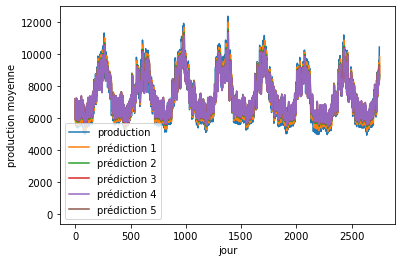

----------------------------------------------------------------------------------------------
Bourgogne-Franche-Comté
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 211.3935765082395
le score R2 avec la température prédite la veille 0.8197525178425685
graphique selon Ridge
L'erreur quadratique moyenne est 211.3874790467696
le score R2 avec la température prédite la veille 0.8197629158522437
graphique selon Lasso
L'erreur quadratique moyenne est 211.38287437254357
le score R2 avec la température prédite la veille 0.8197707680109472
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 221.26574040460093
le score R2 avec la température prédite la veille 0.802524153366565
----------------------------------------------------------------------------------------------


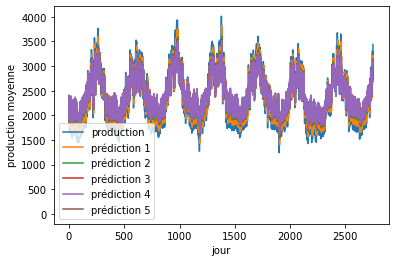

----------------------------------------------------------------------------------------------
Bretagne
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 232.74688911005478
le score R2 avec la température prédite la veille 0.8448628098863316
graphique selon Ridge
L'erreur quadratique moyenne est 232.73523480741315
le score R2 avec la température prédite la veille 0.8448783458232905
graphique selon Lasso
L'erreur quadratique moyenne est 232.71396689601238
le score R2 avec la température prédite la veille 0.844906695315447
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 244.3333483633808
le score R2 avec la température prédite la veille 0.8290324671862722
----------------------------------------------------------------------------------------------
jour de décala

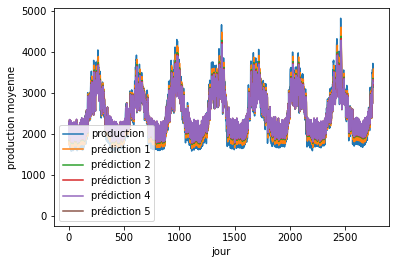

----------------------------------------------------------------------------------------------
Centre-Val de Loire
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 175.13458022355192
le score R2 avec la température prédite la veille 0.8860835654216719
graphique selon Ridge
L'erreur quadratique moyenne est 175.1228839309709
le score R2 avec la température prédite la veille 0.8860987806402201
graphique selon Lasso
L'erreur quadratique moyenne est 175.01531113601376
le score R2 avec la température prédite la veille 0.8862386699455341
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 177.80070497570523
le score R2 avec la température prédite la veille 0.8825887992854343
----------------------------------------------------------------------------------------------
jo

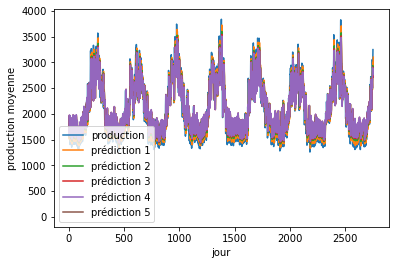

----------------------------------------------------------------------------------------------
Grand Est
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 399.670732922038
le score R2 avec la température prédite la veille 0.8203869286959349
graphique selon Ridge
L'erreur quadratique moyenne est 399.6507846438502
le score R2 avec la température prédite la veille 0.8204048578651292
graphique selon Lasso
L'erreur quadratique moyenne est 399.69445991727497
le score R2 avec la température prédite la veille 0.8203656021156455
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 415.4243632154127
le score R2 avec la température prédite la veille 0.8059484254494661
----------------------------------------------------------------------------------------------
jour de décalag

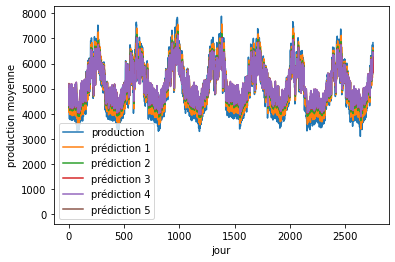

----------------------------------------------------------------------------------------------
Hauts-de-France
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 368.1538842633032
le score R2 avec la température prédite la veille 0.8695314436055972
graphique selon Ridge
L'erreur quadratique moyenne est 366.01155603471034
le score R2 avec la température prédite la veille 0.8710454476330602
graphique selon Lasso
L'erreur quadratique moyenne est 365.9300116019055
le score R2 avec la température prédite la veille 0.8711029013077854
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 382.15492733835276
le score R2 avec la température prédite la veille 0.8594192000359238
----------------------------------------------------------------------------------------------
jour de

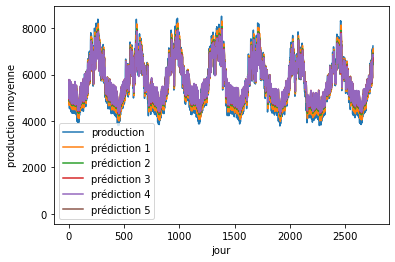

----------------------------------------------------------------------------------------------
Normandie
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 216.43717993540432
le score R2 avec la température prédite la veille 0.8929301837747443
graphique selon Ridge
L'erreur quadratique moyenne est 216.42970689203895
le score R2 avec la température prédite la veille 0.8929375773618038
graphique selon Lasso
L'erreur quadratique moyenne est 216.4762065579852
le score R2 avec la température prédite la veille 0.8928915679506404
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 225.89885120093072
le score R2 avec la température prédite la veille 0.8833643353330493
----------------------------------------------------------------------------------------------
jour de déca

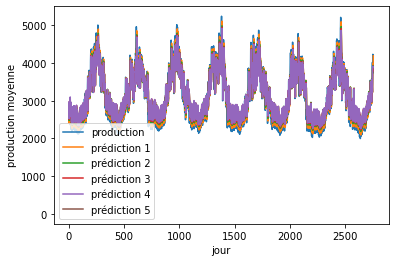

----------------------------------------------------------------------------------------------
Nouvelle-Aquitaine
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 346.8911006148238
le score R2 avec la température prédite la veille 0.8817717376606355
graphique selon Ridge
L'erreur quadratique moyenne est 346.8799185283544
le score R2 avec la température prédite la veille 0.8817793597491942
graphique selon Lasso
L'erreur quadratique moyenne est 346.84596606699034
le score R2 avec la température prédite la veille 0.88180250139025
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 357.7059339723684
le score R2 avec la température prédite la veille 0.8742849479818232
----------------------------------------------------------------------------------------------
jour de

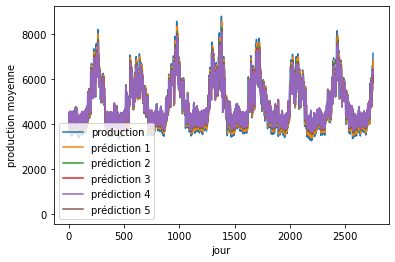

----------------------------------------------------------------------------------------------
Occitanie
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 276.82563170815814
le score R2 avec la température prédite la veille 0.9071673429741766
graphique selon Ridge
L'erreur quadratique moyenne est 276.81176260084635
le score R2 avec la température prédite la veille 0.9071766446694135
graphique selon Lasso
L'erreur quadratique moyenne est 276.7395109150773
le score R2 avec la température prédite la veille 0.9072250946960678
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 281.9234653782069
le score R2 avec la température prédite la veille 0.903716774283758
----------------------------------------------------------------------------------------------
jour de décala

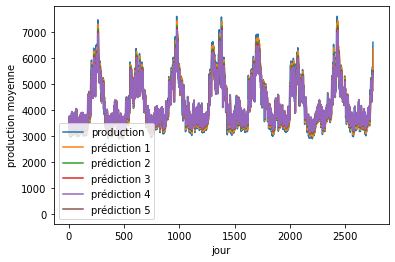

----------------------------------------------------------------------------------------------
Pays de la Loire
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 305.880163188288
le score R2 avec la température prédite la veille 0.8042290550085712
graphique selon Ridge
L'erreur quadratique moyenne est 304.462445643316
le score R2 avec la température prédite la veille 0.8060395987205207
graphique selon Lasso
L'erreur quadratique moyenne est 304.45917441157235
le score R2 avec la température prédite la veille 0.8060437666303709
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 322.7927814965494
le score R2 avec la température prédite la veille 0.7819815543139461
----------------------------------------------------------------------------------------------
jour de d

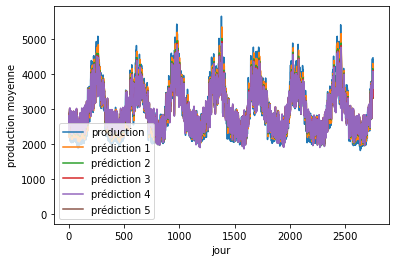

----------------------------------------------------------------------------------------------
Provence-Alpes-Côte d'Azur
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 207.7538245753983
le score R2 avec la température prédite la veille 0.9301782962961184
graphique selon Ridge
L'erreur quadratique moyenne est 207.74918331768666
le score R2 avec la température prédite la veille 0.9301814159200448
graphique selon Lasso
L'erreur quadratique moyenne est 207.73521749482342
le score R2 avec la température prédite la veille 0.9301908026351967
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 209.26234969147637
le score R2 avec la température prédite la veille 0.9291606477142882
------------------------------------------------------------------------------------------

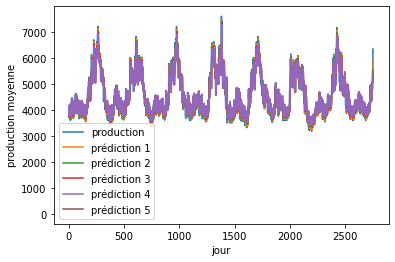

----------------------------------------------------------------------------------------------
Île-de-France
----------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
jour de décalage 1
graphique selon linear
L'erreur quadratique moyenne est 562.2963064173484
le score R2 avec la température prédite la veille 0.9024243792925913
graphique selon Ridge
L'erreur quadratique moyenne est 562.249420234337
le score R2 avec la température prédite la veille 0.9024406509899876
graphique selon Lasso
L'erreur quadratique moyenne est 562.156400771241
le score R2 avec la température prédite la veille 0.9024729290760245
graphique selon ElasticNetCV
L'erreur quadratique moyenne est 573.7745537390811
le score R2 avec la température prédite la veille 0.8984000652892762
----------------------------------------------------------------------------------------------
jour de décal

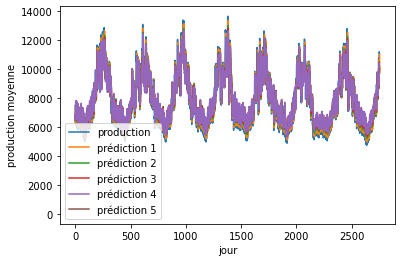

----------------------------------------------------------------------------------------------


In [53]:
for reg in regions:
    print(reg)
    print('----------------------------------------------------------------------------------------------')
    conso_decale (reg)

    print('----------------------------------------------------------------------------------------------')

# 2ème méthode - Utilisation de la température avec une prédiction régionale avec incertitude des prédictions météo

Les données météo sont fiables à 70 et 90% à 24 heures. Seules les données de température sont utilisées pour les modélisations, car la fiabilité des prédictions concernent uniquement la température et pas toutes les conditions météo.
Pour la suite des prédictions, nous utiliserons une fiabilité à 90%.
Cette méthode devra être faite aussi à 70% si les résultats à 90% ne sont pas suffisammment pertinents.

Source : https://dailygeekshow.com/previsions-meteo-fiables/

In [54]:
meteo_region_Aquitaine = meteo_region.loc[meteo_region['Région'] == 'Nouvelle-Aquitaine']
meteo_region_Aquitaine.drop(['TCH Eolien (%)', 'TCH Solaire (%)'], axis=1, inplace=True, errors='ignore')
meteo_region_Aquitaine = meteo_region_Aquitaine.reset_index()
meteo_region_Aquitaine = meteo_region_Aquitaine.dropna()
meteo_region_Aquitaine = meteo_region_Aquitaine.reset_index()
meteo_region_Aquitaine.drop(['index'], axis = 1, inplace=True)
meteo_region_Aquitaine.head()

,level_0,Date,Région,Consommation (MW),Solaire (MW),Eolien (MW),Direction du vent moyen 10 mn,Vitesse du vent moyen 10 mn,Température,Humidité,Visibilité horizontale
0,0,2013-01-01,Nouvelle-Aquitaine,4955.125,34.875,76.750,258.25,4.5150,281.8500,87.825,26727.272727
1,1,2013-01-02,Nouvelle-Aquitaine,5964.750,64.750,21.250,243.25,2.1975,278.8250,87.700,21936.363636
2,2,2013-01-03,Nouvelle-Aquitaine,6198.500,32.125,20.375,144.50,1.3500,280.7775,88.850,20654.545455
3,3,2013-01-04,Nouvelle-Aquitaine,6045.250,16.375,11.375,69.50,2.4900,281.2325,92.350,13528.000000
4,4,2013-01-05,Nouvelle-Aquitaine,5741.500,17.375,29.250,68.00,2.6800,279.8925,91.525,9512.000000


In [55]:
# target Solaire (MW) Eolien (MW) 

target_Aquitaine = pd.DataFrame(meteo_region_Aquitaine, columns=['Consommation (MW)'])
print(target_Aquitaine.head())

print('Nombre de données :',len(target_Aquitaine))

   Consommation (MW)
0           4955.125
1           5964.750
2           6198.500
3           6045.250
4           5741.500
Nombre de données : 3256


In [56]:
conso_Aquitaine = pd.DataFrame(meteo_region_Aquitaine, columns=['Consommation (MW)'])
print(conso_Aquitaine.head())

   Consommation (MW)
0           4955.125
1           5964.750
2           6198.500
3           6045.250
4           5741.500


In [57]:
# target 

# target solaire
train_target_Aquitaine = conso_Aquitaine.iloc[:2000,:]
test_target_Aquitaine = conso_Aquitaine.iloc[2000:,:]

# index réinitialiser l'index
train_target_Aquitaine = train_target_Aquitaine.reset_index()
train_target_Aquitaine.drop(['index'], axis = 1, inplace=True)

test_target_Aquitaine = test_target_Aquitaine.reset_index()
test_target_Aquitaine.drop(['index'], axis = 1, inplace=True)

In [58]:
#donnée
meteo_region_Aquitaine = pd.DataFrame(meteo_region_Aquitaine,columns=['Température', 'Direction du vent moyen 10 mn' , 'Vitesse du vent moyen 10 mn' , 'Humidité' , 'Visibilité horizontale'])
meteo_region_Aquitaine = meteo_region_Aquitaine.reset_index()
meteo_region_Aquitaine.drop(['index'], axis = 1, inplace=True)

meteo_region_Aquitaine['Température'] = (meteo_region_Aquitaine['Température'] - 273.15)


In [59]:

# séparation pour entrainement
train_meteo_Aquitaine = meteo_region_Aquitaine.iloc[:2000,:]

# séparation pour prédiction
test_meteo_Aquitaine = meteo_region_Aquitaine.iloc[2000:,:]
test_meteo_Aquitaine = test_meteo_Aquitaine.reset_index()
test_meteo_Aquitaine.drop(['index'], axis = 1, inplace=True)
print(test_meteo_Aquitaine)

test_meteo_Aquitaine_9 = test_meteo_Aquitaine * 9 / 10
test_meteo_Aquitaine_7 = test_meteo_Aquitaine * 0.7
test_meteo_Aquitaine_11 = test_meteo_Aquitaine * 1.1
test_meteo_Aquitaine_13 = test_meteo_Aquitaine * 1.3

      Température  Direction du vent moyen 10 mn  Vitesse du vent moyen 10 mn  \
0       20.080000                      71.000000                     4.130000   
1       21.045000                      45.250000                     4.540000   
2       23.137500                      63.500000                     3.835000   
3       23.065000                     146.750000                     3.827500   
4       22.817500                     111.000000                     4.105000   
...           ...                            ...                          ...   
1251     6.350000                     253.250000                     4.847500   
1252     5.253846                     285.384615                     5.358974   
1253     4.271795                     293.076923                     5.425641   
1254     2.794737                     214.210526                     2.273684   
1255     3.786842                     146.052632                     2.884211   

       Humidité  Visibilité

In [60]:
from sklearn.linear_model import RidgeCV, Lasso, LinearRegression, ElasticNetCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import neighbors, datasets
from sklearn.cluster import KMeans

models = {
    'linear': LinearRegression(),
    'Ridge': RidgeCV(),
    'Lasso': Lasso(),
    'ElasticNetCV': ElasticNetCV(),
    
    'Kmeans_model' : KMeans(n_clusters=6, init = 'k-means++', random_state=123)
}


graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 607.662495973539
L'erreur quadratique minimum est 1107.905098104094
L'erreur quadratique maximum est 688.3787111177342
L'erreur quadratique minimum est 667.9051526942767
L'erreur quadratique maximum est 1069.6493984625981
le score R2 avec la température prédite la veille 0.6007925354349803
le score R2 avec la 90% de la température prédite la veille est -0.32702440095982466
le score R2 avec la 110% de la température prédite la veille est 0.4876949361677918
le score R2 avec la 90% de la température prédite la veille est 0.5177154218377555
le score R2 avec la 110% de la température prédite la veille est -0.23696294394993345


Graphique prédiction


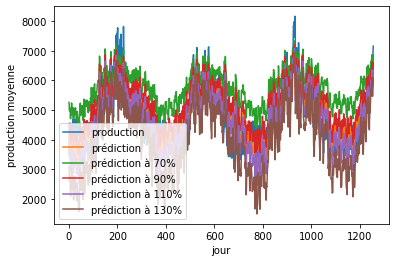

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 607.6254210628615
L'erreur quadratique minimum est 1107.8337525734298
L'erreur quadratique maximum est 688.348801698826
L'erreur quadratique minimum est 667.8374066378301
L'erreur quadratique maximum est 1069.5063394176423
le score R2 avec la température prédite la veille 0.6008412471118719
le score R2 avec la 90% de la température prédite la veille est -0.3268534942426393
le score R2 avec la 110% de la température prédite la veille est 0.48773945356391657
le score R2 avec la 90% de la température prédite la veille est 0.5178132537562788
le score R2 avec la 110% de la température prédite la veille est -0.23663209366555216


Graphique prédiction


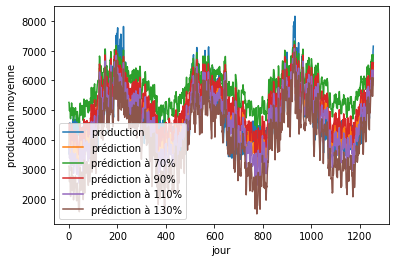

graphique selon Lasso
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 607.5255745638585
L'erreur quadratique minimum est 1107.6319698805037
L'erreur quadratique maximum est 688.2116971744636
L'erreur quadratique minimum est 667.7662090702112
L'erreur quadratique maximum est 1069.4286746885464
le score R2 avec la température prédite la veille 0.6009724178237539
le score R2 avec la 90% de la température prédite la veille est -0.3263701876316667
le score R2 avec la 110% de la température prédite la veille est 0.4879434961769278
le score R2 avec la 90% de la température prédite la veille est 0.5179160592989325
le score R2 avec la 110% de la température prédite la veille est -0.23645249826565173


Graphique prédiction


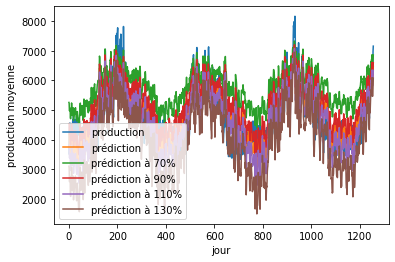

graphique selon ElasticNetCV
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 869.8836563832907
L'erreur quadratique minimum est 1070.6001941866264
L'erreur quadratique maximum est 915.9340314131273
L'erreur quadratique minimum est 849.7361318923902
L'erreur quadratique maximum est 891.9270192233532
le score R2 avec la température prédite la veille 0.1819193328552855
le score R2 avec la 90% de la température prédite la veille est -0.23916295787641184
le score R2 avec la 110% de la température prédite la veille est 0.09301067003030972
le score R2 avec la 90% de la température prédite la veille est 0.2193758949280047
le score R2 avec la 110% de la température prédite la veille est 0.13993271681667319


Graphique prédiction


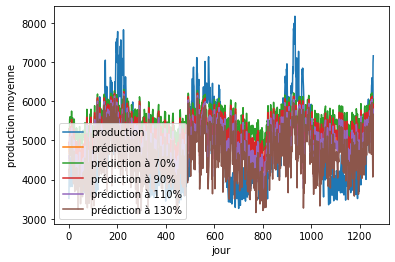

graphique selon Kmeans_model
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 4923.332784147659
L'erreur quadratique minimum est 4923.016281814933
L'erreur quadratique maximum est 4923.2594078906195
L'erreur quadratique minimum est 4923.238730266725
L'erreur quadratique maximum est 4922.7093609425565
le score R2 avec la température prédite la veille -25.205483156336502
le score R2 avec la 90% de la température prédite la veille est -25.20211396302178
le score R2 avec la 110% de la température prédite la veille est -25.204702040769753
le score R2 avec la 90% de la température prédite la veille est -25.204481922433384
le score R2 avec la 110% de la température prédite la veille est -25.198846972002237


Graphique prédiction


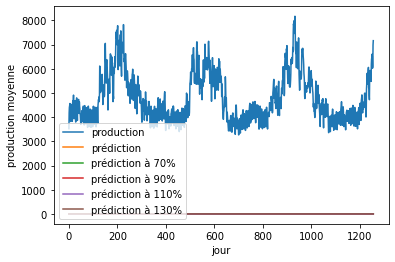

In [61]:

#Générez chaque modèle en séquence, calculez et stockez le taux de réponses correctes
for model_name, model in models.items():
    residus = 0
    print('graphique selon', model_name)
    #Génération de modèle   
    train_predict = model.fit(train_meteo_Aquitaine, train_target_Aquitaine)
    
    #entrainement du modèle
    y_train_predict = model.predict(train_meteo_Aquitaine)

    #prédiction du modèle
    y_test_predict = model.predict(test_meteo_Aquitaine)
    y_test_predict_7 = model.predict(test_meteo_Aquitaine_7)
    y_test_predict_9 = model.predict(test_meteo_Aquitaine_9)
    y_test_predict_11 = model.predict(test_meteo_Aquitaine_11)
    y_test_predict_13 = model.predict(test_meteo_Aquitaine_13)
      
        
    #Taux de réponses correctes des données d'entraînement
    rmse_train = (np.sqrt(mean_squared_error(train_target_Aquitaine, y_train_predict)))
    r2_train = r2_score(train_target_Aquitaine, y_train_predict)    
        
    #Taux de réponses correctes des données de prédiction
    rmse_predict = (np.sqrt(mean_squared_error(test_target_Aquitaine, y_test_predict)))
    r2_predict = r2_score(test_target_Aquitaine, y_test_predict)
    
    # évaluation du modèle testé 7
    rmse_predict_7 = (np.sqrt(mean_squared_error(test_target_Aquitaine, y_test_predict_7)))
    r_7 = r2_score(test_target_Aquitaine, y_test_predict_7)

    # évaluation du modèle testé 9
    rmse_predict_9 = (np.sqrt(mean_squared_error(test_target_Aquitaine, y_test_predict_9)))
    r_9 = r2_score(test_target_Aquitaine, y_test_predict_9)
 
    # évaluation du modèle testé 7
    rmse_predict_11 = (np.sqrt(mean_squared_error(test_target_Aquitaine, y_test_predict_11)))
    r_11 = r2_score(test_target_Aquitaine, y_test_predict_11)

    # évaluation du modèle testé 9
    rmse_predict_13 = (np.sqrt(mean_squared_error(test_target_Aquitaine, y_test_predict_13)))
    r_13 = r2_score(test_target_Aquitaine, y_test_predict_13)
           
    print('La performance du modèle sur la prédiction')
    print('--------------------------------------')
    print("L'erreur quadratique moyenne est {}".format(rmse_predict))
    print("L'erreur quadratique minimum est {}".format(rmse_predict_7))
    print("L'erreur quadratique maximum est {}".format(rmse_predict_9))
    print("L'erreur quadratique minimum est {}".format(rmse_predict_11))
    print("L'erreur quadratique maximum est {}".format(rmse_predict_13))
        
    print('le score R2 avec la température prédite la veille {}'.format(r2_predict))
    print('le score R2 avec la 90% de la température prédite la veille est {}'.format(r_7))
    print('le score R2 avec la 110% de la température prédite la veille est {}'.format(r_9))
    print('le score R2 avec la 90% de la température prédite la veille est {}'.format(r_11))
    print('le score R2 avec la 110% de la température prédite la veille est {}'.format(r_13))
    print('\n')
    
    print('Graphique prédiction')
    plt.plot(test_target_Aquitaine, label='production')
    plt.plot(y_test_predict, label='prédiction')
    plt.plot(y_test_predict_7, label='prédiction à 70%')
    plt.plot(y_test_predict_9, label='prédiction à 90%')
    plt.plot(y_test_predict_11, label='prédiction à 110%')
    plt.plot(y_test_predict_13, label='prédiction à 130%')
    plt.xlabel('jour')
    plt.ylabel('production moyenne')
    plt.legend(loc='lower left')
    plt.show()

## Modélisation nationale de la production solaire et eolien

Pour modéliser la consommation en France à partir de données météo et des données de consommation et de production, nous devons découper la France en zone, car les données météo ne sont pas homogènes.

Nous avons opté pour un découpage régional pour l'analyse.

Dans un premier temps, nous devons déterminer qu'elle est la meilleure méthode pour modéliser. Pour cela, nous allons tester plusieurs méthodee de prédiction sur une seule région afin de choisir la plus adaptée aux données météo.

Puis dans une seconde étape, nous allons utiliser la méthode déterminée pour modéliser toutes les régions puis additionner les résultats de chaque région pour avoir les résultats au niveau national.

### modélisation nationale solaire avec décalage 1 jour

In [62]:
models = {
    'linear': LinearRegression(),
    'Ridge': RidgeCV(),
}

In [65]:
def conso (X):
    test_t = 0
    y_test_predict_linear = 0
    y_test_predict_ridge = 0
    nationale = 0
    print(reg)
    
    # grouper par région aquitaine
    meteo_2 = meteo_region.loc[meteo_region['Région'] == X]
    meteo_2 = meteo_2.dropna()
    meteo_2 = meteo_2.reset_index()
    # target consommation (MW) 
    target_conso = pd.DataFrame(meteo_2, columns=['Consommation (MW)'])
    target_conso = target_conso.reset_index()
    target_conso.drop(['index'], axis = 1, inplace=True)
    
    # données solaire en MW et TCH %
    conso = pd.DataFrame(meteo_2, columns=['Consommation (MW)']) 

    # solaire en MW
    test_conso = pd.DataFrame(conso['Consommation (MW)']).iloc[2001:,:]
    test_conso = test_conso.reset_index()
    test_conso.drop(['index'], axis = 1, inplace=True)
        
    # suppression de la première ligne
    target_conso = target_conso[1:]
    train_target = target_conso.iloc[:2000,:]
    test_target = target_conso.iloc[2000:,:]
    test_target = test_target.reset_index()
    test_target.drop(['index'], axis = 1, inplace=True)
    temp_region = pd.DataFrame(meteo_2,columns=['Température', 'Direction du vent moyen 10 mn' , 'Vitesse du vent moyen 10 mn' , 'Humidité' , 'Visibilité horizontale'])
    temp_region = temp_region.reset_index()
    temp_region.drop(['index'], axis = 1, inplace=True)
    temp_region['Température'] = temp_region['Température'] - 273.15
    # suppression dernière ligne
    temp_region = temp_region.iloc[:-1]
    # séparation pour entrainement
    train_temp_region = temp_region.iloc[:2000,:]
    # séparation pour prédicton
    test_temp_region = temp_region.iloc[2000:,:]
    test_temp_region = test_temp_region.reset_index()
    test_temp_region.drop(['index'], axis = 1, inplace=True)

    #Générez chaque modèle en séquence, calculez et stockez le taux de réponses correctes
    for model_name, model in models.items():
        print('graphique selon', model_name)
        #Génération de modèle   
        train_predict = model.fit(train_temp_region, train_target)
        
        #entrainement du modèle
        y_train_predict = model.predict(train_temp_region)

        #prédiction du modèle
        y_test_predict = model.predict(test_temp_region)
        if model_name == 'linear' : 
            y_test_predict_linear += y_test_predict
            test_t += test_conso
        if model_name == 'Ridge' : 
            y_test_predict_ridge += y_test_predict
        #Taux de réponses correctes des données d'entraînement
        rmse_train = (np.sqrt(mean_squared_error(train_target, y_train_predict)))
        r2_train = r2_score(train_target, y_train_predict)    
        
        #Taux de réponses correctes des données de prédiction
        rmse_predict = (np.sqrt(mean_squared_error(test_target, y_test_predict)))
        r2_predict = r2_score(test_target, y_test_predict)
            
        print("Moyenne des prédictions:", np.mean(y_test_predict))
        print("Maximum des prédiction:", np.max(y_test_predict))
        print("Minimum dde prédiction:", np.min(y_test_predict))
        print("Moyenne de la production solaire réelle:", np.mean(test_target))
        print("Maximum de la production solaire réelle:", np.max(test_target))
        print("Minimum de la production solaire réelle:", np.min(test_target))

        
        print('La performance du modèle sur la prédiction')
        print('--------------------------------------')
        print("L'erreur quadratique moyenne est {}".format(rmse_predict))    
    
        print('le score R2 avec la température prédite la veille {}'.format(r2_predict))

        print('Graphique prédiction')
        plt.plot(test_target, label='production')
        plt.plot(y_test_predict, label='prédiction')
        plt.xlabel('jour')
        plt.ylabel('production moyenne')
        plt.legend(loc='lower left')
        plt.show()
    return test_t, y_test_predict_linear, y_test_predict_ridge

Auvergne-Rhône-Alpes
----------------------------------------------------------------------------------------------
Auvergne-Rhône-Alpes
graphique selon linear
Moyenne des prédictions: 7446.656375965423
Maximum des prédiction: 10362.03606446302
Minimum dde prédiction: 4905.354376488859
Moyenne de la production solaire réel: Consommation (MW)    7261.568443
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    11217.625
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    4938.625
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 866.2496247340254
le score R2 avec la température prédite la veille 0.5905671424386119
Graphique prédiction


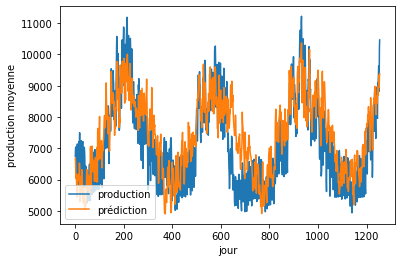

graphique selon Ridge
Moyenne des prédictions: 7446.679724450044
Maximum des prédiction: 10361.758282847724
Minimum dde prédiction: 4905.795701931914
Moyenne de la production solaire réel: Consommation (MW)    7261.568443
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    11217.625
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    4938.625
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 866.2316681816606
le score R2 avec la température prédite la veille 0.5905841165904884
Graphique prédiction


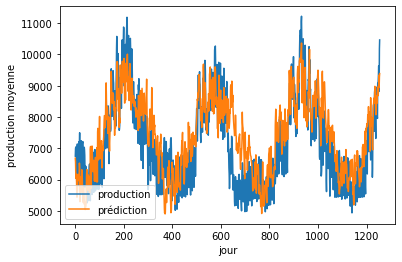

----------------------------------------------------------------------------------------------
Bourgogne-Franche-Comté
----------------------------------------------------------------------------------------------
Bourgogne-Franche-Comté
graphique selon linear
Moyenne des prédictions: 2408.3491958804993
Maximum des prédiction: 3534.3026651399396
Minimum dde prédiction: 1493.0365730944332
Moyenne de la production solaire réel: Consommation (MW)    2357.912171
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    3674.0
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1240.625
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 291.2963676751259
le score R2 avec la température prédite la veille 0.6162878178396587
Graphique prédiction


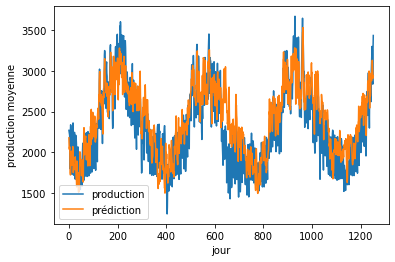

graphique selon Ridge
Moyenne des prédictions: 2408.338434203774
Maximum des prédiction: 3533.96844607171
Minimum dde prédiction: 1493.171648453626
Moyenne de la production solaire réel: Consommation (MW)    2357.912171
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    3674.0
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1240.625
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 291.2854761298944
le score R2 avec la température prédite la veille 0.6163165112318276
Graphique prédiction


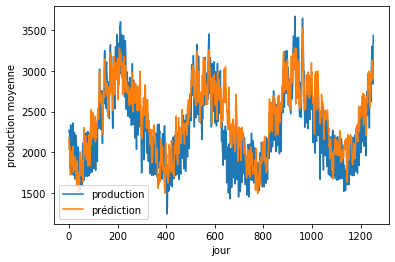

----------------------------------------------------------------------------------------------
Bretagne
----------------------------------------------------------------------------------------------
Bretagne
graphique selon linear
Moyenne des prédictions: 2479.3258947968357
Maximum des prédiction: 4199.4659832858715
Minimum dde prédiction: 1119.0801098115671
Moyenne de la production solaire réel: Consommation (MW)    2544.595148
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    4827.0
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1591.75
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 327.6463798446531
le score R2 avec la température prédite la veille 0.6851507050444069
Graphique prédiction


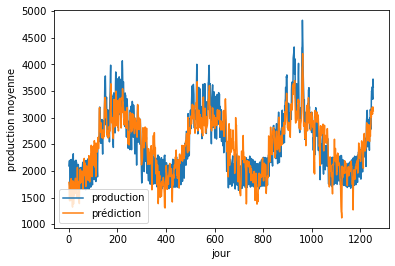

graphique selon Ridge
Moyenne des prédictions: 2479.34342255179
Maximum des prédiction: 4199.0248679838205
Minimum dde prédiction: 1119.484943298679
Moyenne de la production solaire réel: Consommation (MW)    2544.595148
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    4827.0
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1591.75
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 327.62813434915273
le score R2 avec la température prédite la veille 0.6851857698081267
Graphique prédiction


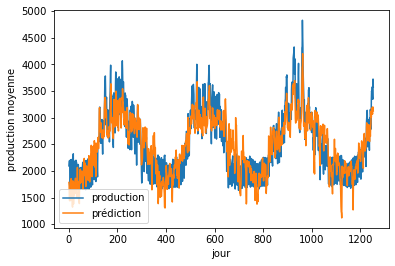

----------------------------------------------------------------------------------------------
Centre-Val de Loire
----------------------------------------------------------------------------------------------
Centre-Val de Loire
graphique selon linear
Moyenne des prédictions: 2084.2587378001886
Maximum des prédiction: 3305.788163447206
Minimum dde prédiction: 950.6213247542119
Moyenne de la production solaire réel: Consommation (MW)    2093.616635
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    3827.875
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1259.875
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 296.85306724153605
le score R2 avec la température prédite la veille 0.6547631652426142
Graphique prédiction


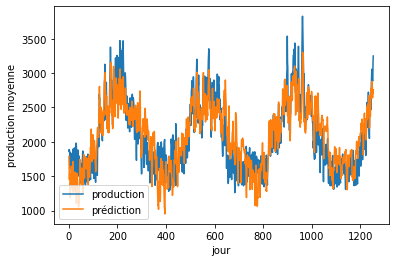

graphique selon Ridge
Moyenne des prédictions: 2084.241988885136
Maximum des prédiction: 3305.5006201277492
Minimum dde prédiction: 950.6683417201571
Moyenne de la production solaire réel: Consommation (MW)    2093.616635
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    3827.875
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1259.875
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 296.8432527314907
le score R2 avec la température prédite la veille 0.654785993198559
Graphique prédiction


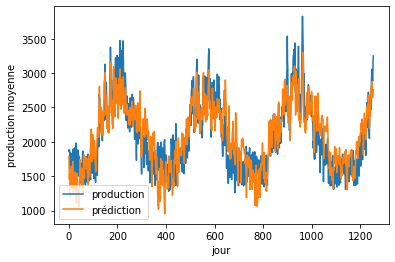

----------------------------------------------------------------------------------------------
Grand Est
----------------------------------------------------------------------------------------------
Grand Est
graphique selon linear
Moyenne des prédictions: 5187.399440347044
Maximum des prédiction: 7335.381337135267
Minimum dde prédiction: 3315.7218881522986
Moyenne de la production solaire réel: Consommation (MW)    5017.552378
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    7670.0
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    3095.5
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 595.3608412890011
le score R2 avec la température prédite la veille 0.5690575377470594
Graphique prédiction


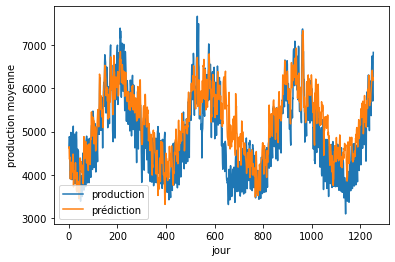

graphique selon Ridge
Moyenne des prédictions: 5187.334107268965
Maximum des prédiction: 7334.782651712768
Minimum dde prédiction: 3315.4803541901424
Moyenne de la production solaire réel: Consommation (MW)    5017.552378
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    7670.0
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    3095.5
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 595.3191207075229
le score R2 avec la température prédite la veille 0.5691179331876283
Graphique prédiction


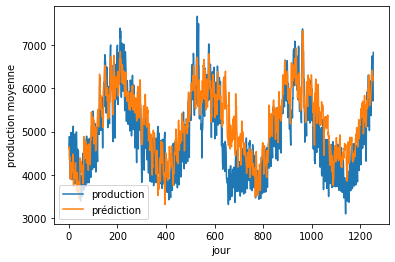

----------------------------------------------------------------------------------------------
Hauts-de-France
----------------------------------------------------------------------------------------------
Hauts-de-France
graphique selon linear
Moyenne des prédictions: 5722.827106695618
Maximum des prédiction: 8316.79236009845
Minimum dde prédiction: 2910.1886879927238
Moyenne de la production solaire réel: Consommation (MW)    5545.63813
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    8319.375
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    3787.625
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 580.7600007162541
le score R2 avec la température prédite la veille 0.639956079750603
Graphique prédiction


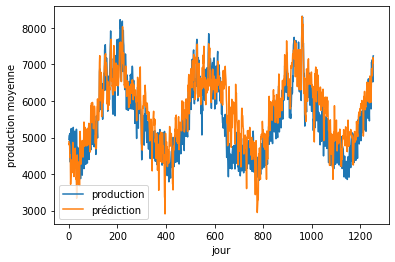

graphique selon Ridge
Moyenne des prédictions: 5722.855274060239
Maximum des prédiction: 8316.32396652754
Minimum dde prédiction: 2910.3666053644133
Moyenne de la production solaire réel: Consommation (MW)    5545.63813
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    8319.375
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    3787.625
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 580.7411902659214
le score R2 avec la température prédite la veille 0.639979402564127
Graphique prédiction


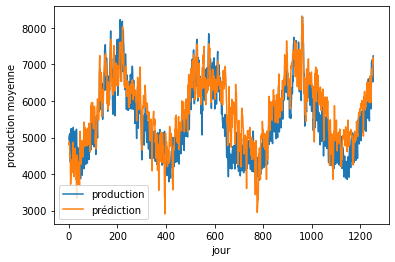

----------------------------------------------------------------------------------------------
Normandie
----------------------------------------------------------------------------------------------
Normandie
graphique selon linear
Moyenne des prédictions: 3159.277111829242
Maximum des prédiction: 4872.085712166634
Minimum dde prédiction: 1544.2651257047573
Moyenne de la production solaire réel: Consommation (MW)    3071.77978
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    5209.25
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1996.875
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 342.1807134893268
le score R2 avec la température prédite la veille 0.7221318332831125
Graphique prédiction


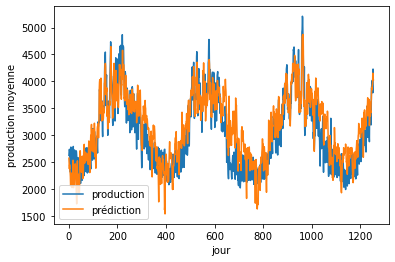

graphique selon Ridge
Moyenne des prédictions: 3159.2916904404187
Maximum des prédiction: 4871.748384274777
Minimum dde prédiction: 1544.493338934913
Moyenne de la production solaire réel: Consommation (MW)    3071.77978
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    5209.25
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1996.875
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 342.16109778549463
le score R2 avec la température prédite la veille 0.7221636902710669
Graphique prédiction


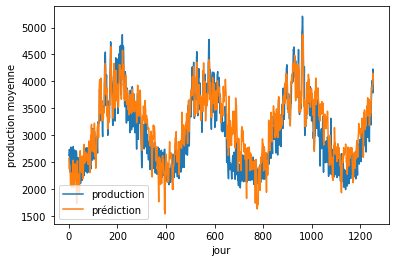

----------------------------------------------------------------------------------------------
Nouvelle-Aquitaine
----------------------------------------------------------------------------------------------
Nouvelle-Aquitaine
graphique selon linear
Moyenne des prédictions: 4882.55949371022
Maximum des prédiction: 7143.316390599144
Minimum dde prédiction: 2888.3294467112137
Moyenne de la production solaire réel: Consommation (MW)    4831.774467
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    8169.675676
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    3264.125
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 604.478983723965
le score R2 avec la température prédite la veille 0.6046962481444392
Graphique prédiction


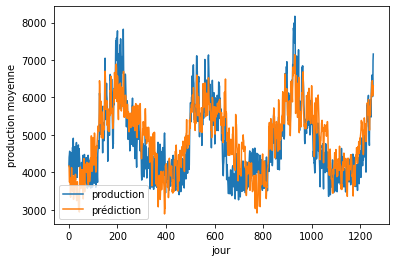

graphique selon Ridge
Moyenne des prédictions: 4882.5562258278005
Maximum des prédiction: 7142.781733359555
Minimum dde prédiction: 2888.5717566646226
Moyenne de la production solaire réel: Consommation (MW)    4831.774467
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    8169.675676
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    3264.125
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 604.4373250956809
le score R2 avec la température prédite la veille 0.604750732237513
Graphique prédiction


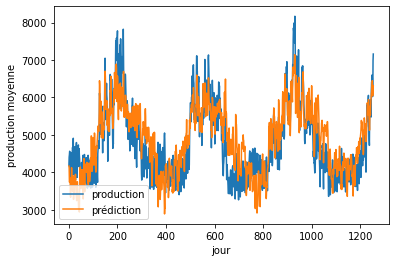

----------------------------------------------------------------------------------------------
Occitanie
----------------------------------------------------------------------------------------------
Occitanie
graphique selon linear
Moyenne des prédictions: 4168.704870662162
Maximum des prédiction: 6257.858720379193
Minimum dde prédiction: 2580.8211677100817
Moyenne de la production solaire réel: Consommation (MW)    4237.658918
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    7593.875
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    2887.5
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 603.9664614365478
le score R2 avec la température prédite la veille 0.5080994072913424
Graphique prédiction


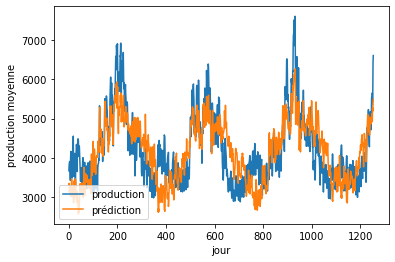

graphique selon Ridge
Moyenne des prédictions: 4168.725296525868
Maximum des prédiction: 6257.635563321946
Minimum dde prédiction: 2581.0197135384424
Moyenne de la production solaire réel: Consommation (MW)    4237.658918
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    7593.875
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    2887.5
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 603.9391483181278
le score R2 avec la température prédite la veille 0.5081438966337308
Graphique prédiction


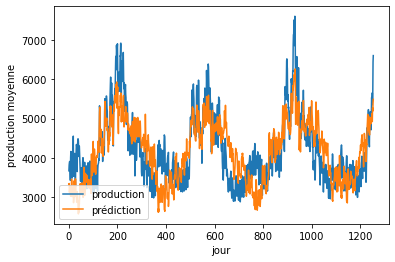

----------------------------------------------------------------------------------------------
Pays de la Loire
----------------------------------------------------------------------------------------------
Pays de la Loire
graphique selon linear
Moyenne des prédictions: 3060.3034394647093
Maximum des prédiction: 4782.4529859750455
Minimum dde prédiction: 1399.0655687925182
Moyenne de la production solaire réel: Consommation (MW)    3025.768176
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    5409.75
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1813.25
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 427.72277021943006
le score R2 avec la température prédite la veille 0.6006161799122407
Graphique prédiction


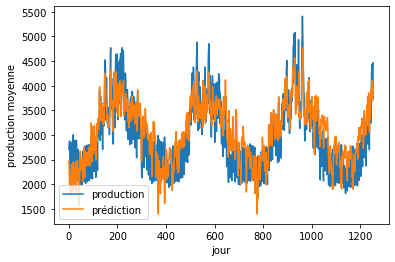

graphique selon Ridge
Moyenne des prédictions: 3060.266671643658
Maximum des prédiction: 4781.883143745553
Minimum dde prédiction: 1399.322761453177
Moyenne de la production solaire réel: Consommation (MW)    3025.768176
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    5409.75
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    1813.25
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 427.6968414341293
le score R2 avec la température prédite la veille 0.6006646001702468
Graphique prédiction


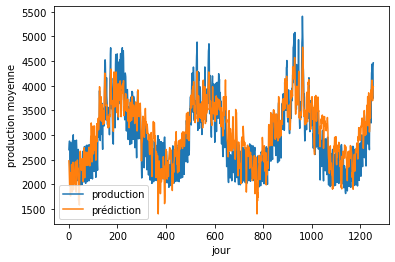

----------------------------------------------------------------------------------------------
Provence-Alpes-Côte d'Azur
----------------------------------------------------------------------------------------------
Provence-Alpes-Côte d'Azur
graphique selon linear
Moyenne des prédictions: 4639.812276853077
Maximum des prédiction: 6292.08344541346
Minimum dde prédiction: 3458.7234416843576
Moyenne de la production solaire réel: Consommation (MW)    4508.563082
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    7163.375
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    3178.75
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 559.7226442672568
le score R2 avec la température prédite la veille 0.43831981493218264
Graphique prédiction


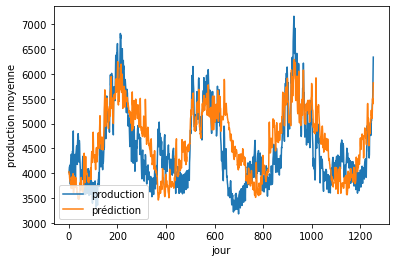

graphique selon Ridge
Moyenne des prédictions: 4639.833668419735
Maximum des prédiction: 6291.844105799816
Minimum dde prédiction: 3458.926630658332
Moyenne de la production solaire réel: Consommation (MW)    4508.563082
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    7163.375
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    3178.75
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 559.7007798692139
le score R2 avec la température prédite la veille 0.4383636958056938
Graphique prédiction


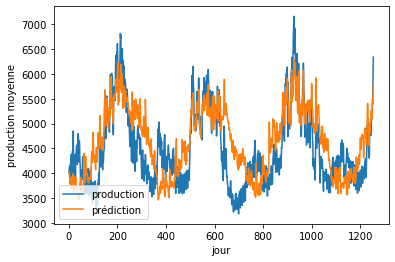

----------------------------------------------------------------------------------------------
Île-de-France
----------------------------------------------------------------------------------------------
Île-de-France
graphique selon linear
Moyenne des prédictions: 7977.675465451371
Maximum des prédiction: 12314.773044502295
Minimum dde prédiction: 3157.0687762497782
Moyenne de la production solaire réel: Consommation (MW)    7646.704157
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    12775.25
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    4729.0
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 1026.5887646019291
le score R2 avec la température prédite la veille 0.6455224959631447
Graphique prédiction


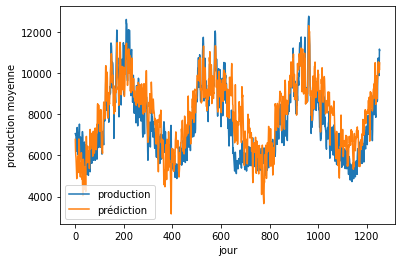

graphique selon Ridge
Moyenne des prédictions: 7977.664388066627
Maximum des prédiction: 12314.032895365805
Minimum dde prédiction: 3157.584042313769
Moyenne de la production solaire réel: Consommation (MW)    7646.704157
dtype: float64
Maximum de la production solaire réel: Consommation (MW)    12775.25
dtype: float64
Minimum de la production solaire réel: Consommation (MW)    4729.0
dtype: float64
La performance du modèle sur la prédiction
--------------------------------------
Lerreur quadratique moyenne est 1026.5323269577718
le score R2 avec la température prédite la veille 0.645561470333416
Graphique prédiction


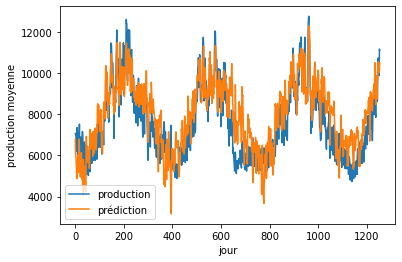

----------------------------------------------------------------------------------------------


In [64]:
nationale = 0
lin = 0
rid = 0


for reg in regions:
    print(reg)
    print('----------------------------------------------------------------------------------------------')
    a, b, c = conso (reg)
    nationale = a
    lin = b
    rid = c
    print('----------------------------------------------------------------------------------------------')


#### Résultats nationale solaire

---------------------------------------------------------------------
linéaire
---------------------------------------------------------------------
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 1026.5887646019291
Le score est de 0.6455224959631447


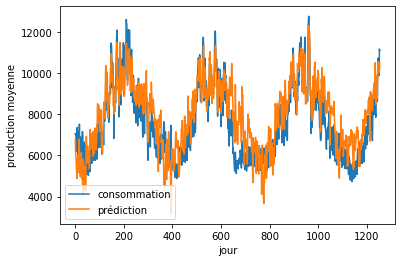

---------------------------------------------------------------------


In [66]:
print("---------------------------------------------------------------------")
print("linéaire")
print("---------------------------------------------------------------------")

rmse_linear = (np.sqrt(mean_squared_error(nationale, lin)))

r_linear = r2_score(nationale, lin)
      
print('La performance du modèle sur la prédiction')
print('--------------------------------------')
print("L'erreur quadratique moyenne est {}".format(rmse_linear)) 
print('Le score est de {}'.format(r_linear)) 
plt.plot(nationale, label='consommation')
plt.plot(lin, label='prédiction')
plt.xlabel('jour')
plt.ylabel('production moyenne')
plt.legend(loc='lower left')
plt.show()
print("---------------------------------------------------------------------")

---------------------------------------------------------------------
ridge
---------------------------------------------------------------------
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 1026.5323269577718
Le score est de 0.645561470333416


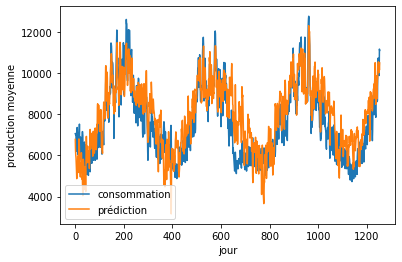

---------------------------------------------------------------------


In [67]:
print("---------------------------------------------------------------------")
print("ridge")
print("---------------------------------------------------------------------")

rmse_ridge = (np.sqrt(mean_squared_error(nationale, rid)))
r_ridge = r2_score(nationale, rid)     

print('La performance du modèle sur la prédiction')
print('--------------------------------------')
print("L'erreur quadratique moyenne est {}".format(rmse_ridge)) 
print('Le score est de {}'.format(r_ridge)) 
plt.plot(nationale, label='consommation')
plt.plot(rid, label='prédiction')
plt.xlabel('jour')
plt.ylabel('production moyenne')
plt.legend(loc='lower left')
plt.show()
print("---------------------------------------------------------------------")

### Deuxième méthode avec une incertitude de la prédiction des conditions météo

In [68]:
def conso_N (X):
    test_t = 0
    y_test_predict_linear = 0
    y_test_predict_linear_9 = 0
    y_test_predict_linear_7 = 0
    y_test_predict_linear_11 = 0
    y_test_predict_linear_13 = 0   
    y_test_predict_rid = 0
    y_test_predict_rid_9 = 0
    y_test_predict_rid_7 = 0
    y_test_predict_rid_11 = 0
    y_test_predict_rid_13 = 0 
    nationale = 0
    print("---------------------------------------------------------------------")
    print("---------------------------------------------------------------------")
    print(reg)
    
    # grouper par région aquitaine
    meteo_2 = meteo_region.loc[meteo_region['Région'] == X]
    meteo_2 = meteo_2.dropna()
    meteo_2 = meteo_2.reset_index()
    # target consommation (MW) 
    target_conso = pd.DataFrame(meteo_2, columns=['Consommation (MW)'])
    target_conso = target_conso.reset_index()
    target_conso.drop(['index'], axis = 1, inplace=True)
    
    # conso en MW
    conso = pd.DataFrame(meteo_2, columns=['Consommation (MW)']) 
    test_conso = pd.DataFrame(conso['Consommation (MW)']).iloc[2000:,:]
    test_conso = test_conso.reset_index()
    test_conso.drop(['index'], axis = 1, inplace=True)
        
    # données entrainement et cible
    train_target = target_conso.iloc[:2000,:]
    test_target = target_conso.iloc[2000:,:]
    test_target = test_target.reset_index()
    test_target.drop(['index'], axis = 1, inplace=True)
    temp_region = pd.DataFrame(meteo_2,columns=['Température', 'Direction du vent moyen 10 mn' , 'Vitesse du vent moyen 10 mn' , 'Humidité' , 'Visibilité horizontale'])
    temp_region = temp_region.reset_index()
    temp_region.drop(['index'], axis = 1, inplace=True)
    temp_region['Température'] = temp_region['Température'] - 273.15
    

    # séparation pour entrainement
    train_temp_region = temp_region.iloc[:2000,:]
    # séparation pour prédiction
    test_temp_region = temp_region.iloc[2000:,:]
    test_temp_region = test_temp_region.reset_index()
    test_temp_region.drop(['index'], axis = 1, inplace=True)
    test_temp_region_9 = test_temp_region * 9 / 10
    test_temp_region_7 = test_temp_region * 7 / 10
    test_temp_region_11 = test_temp_region * 11 / 10    
    test_temp_region_13 = test_temp_region * 13 / 10
    #Générez chaque modèle en séquence, calculez et stockez le taux de réponse correct
    for model_name, model in models.items():
        print('graphique selon', model_name)
        #Génération de modèle  
        train_predict = model.fit(train_temp_region, train_target)              
        #entrainement du modèle
        y_train_predict = model.predict(train_temp_region)

        #prédiction du modèle
        y_test_predict = model.predict(test_temp_region)
        y_test_predict_7 = model.predict(test_temp_region_7)
        y_test_predict_9 = model.predict(test_temp_region_9)
        y_test_predict_11 = model.predict(test_temp_region_11)
        y_test_predict_13 = model.predict(test_temp_region_13)
        if model_name == 'linear' : 
            y_test_predict_linear += y_test_predict 
            y_test_predict_linear_7 += y_test_predict_7 
            y_test_predict_linear_9 += y_test_predict_9
            y_test_predict_linear_11 += y_test_predict_11
            y_test_predict_linear_13 += y_test_predict_13
            test_t += test_conso                  
        if model_name == 'Ridge' : 
            y_test_predict_rid += y_test_predict 
            y_test_predict_rid_7 += y_test_predict_7 
            y_test_predict_rid_9 += y_test_predict_9
            y_test_predict_rid_11 += y_test_predict_11
            y_test_predict_rid_13 += y_test_predict_13 
        #Taux de réponse correct des données de prédiction
        rmse_predict = (np.sqrt(mean_squared_error(test_target, y_test_predict)))
        r2_predict = r2_score(test_target, y_test_predict)
        
        print('La performance du modèle sur la prédiction')
        print('--------------------------------------')
        print("L'erreur quadratique moyenne est {}".format(rmse_predict))    
    
        print('le score R2 avec la température prédite la veille {}'.format(r2_predict))

        print('Graphique prédiction')
        plt.plot(test_target, label='production')
        plt.plot(y_test_predict, label='prédiction')
        plt.xlabel('jour')
        plt.ylabel('production moyenne')
        plt.legend(loc='lower left')
        plt.show()
    return test_t, y_test_predict_linear, y_test_predict_linear_7, y_test_predict_linear_9, y_test_predict_linear_11, y_test_predict_linear_13, y_test_predict_rid, y_test_predict_rid_7, y_test_predict_rid_9, y_test_predict_rid_11, y_test_predict_rid_13


    

Auvergne-Rhône-Alpes
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Auvergne-Rhône-Alpes
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 879.2205584559088
le score R2 avec la température prédite la veille 0.5783554759794585
Graphique prédiction


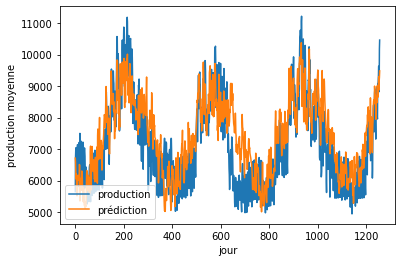

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 879.2004582229467
le score R2 avec la température prédite la veille 0.5783747545465971
Graphique prédiction


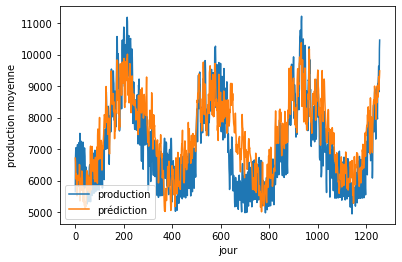

----------------------------------------------------------------------------------------------
Bourgogne-Franche-Comté
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Bourgogne-Franche-Comté
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 290.001593630716
le score R2 avec la température prédite la veille 0.6194338592356674
Graphique prédiction


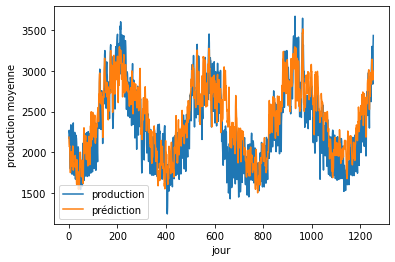

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 289.98738225799354
le score R2 avec la température prédite la veille 0.619471157201428
Graphique prédiction


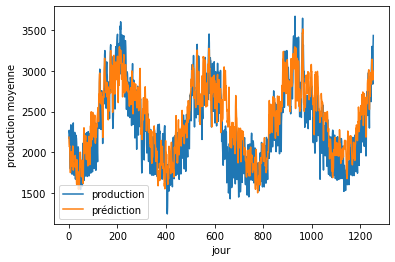

----------------------------------------------------------------------------------------------
Bretagne
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Bretagne
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 332.24970671151686
le score R2 avec la température prédite la veille 0.6766323463312056
Graphique prédiction


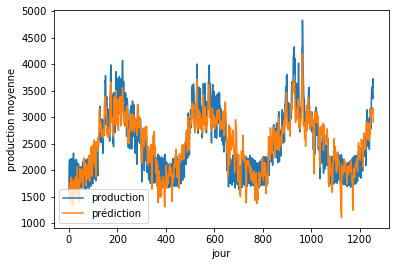

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 332.2300197810921
le score R2 avec la température prédite la veille 0.676670666472736
Graphique prédiction


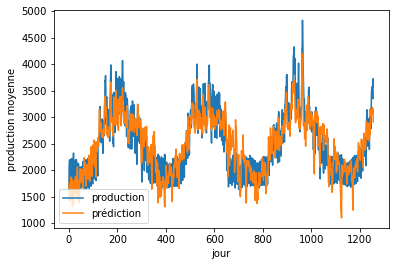

----------------------------------------------------------------------------------------------
Centre-Val de Loire
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Centre-Val de Loire
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 296.4687340699929
le score R2 avec la température prédite la veille 0.6554847886561845
Graphique prédiction


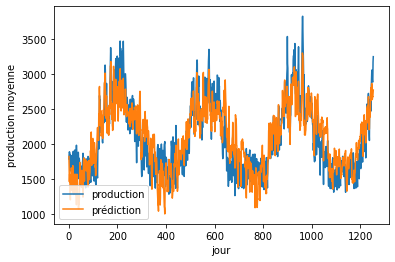

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 296.4533352199188
le score R2 avec la température prédite la veille 0.655520576580517
Graphique prédiction


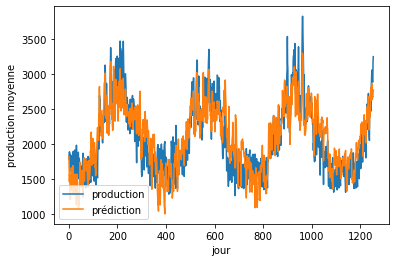

----------------------------------------------------------------------------------------------
Grand Est
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Grand Est
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 602.3198116316925
le score R2 avec la température prédite la veille 0.5591861505290365
Graphique prédiction


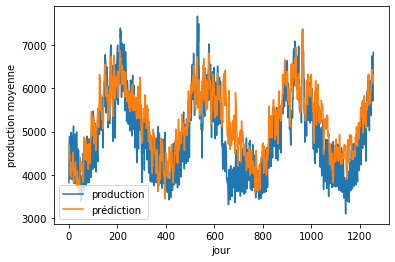

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 602.26838920746
le score R2 avec la température prédite la veille 0.559261415359185
Graphique prédiction


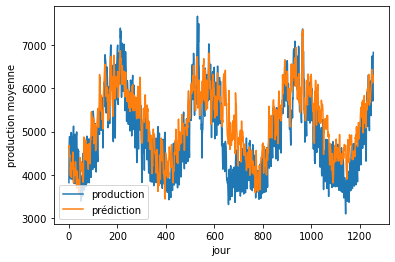

----------------------------------------------------------------------------------------------
Hauts-de-France
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Hauts-de-France
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 581.9865788290072
le score R2 avec la température prédite la veille 0.6387128565462101
Graphique prédiction


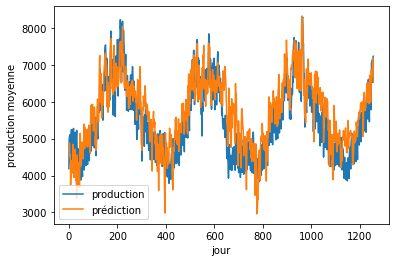

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 581.9648184641628
le score R2 avec la température prédite la veille 0.6387398729530027
Graphique prédiction


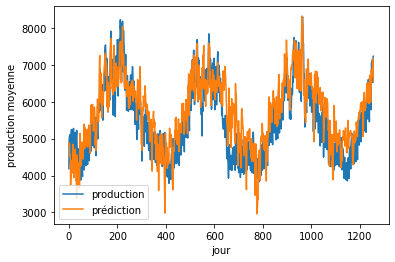

----------------------------------------------------------------------------------------------
Normandie
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Normandie
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 340.1019476760056
le score R2 avec la température prédite la veille 0.7256604875744349
Graphique prédiction


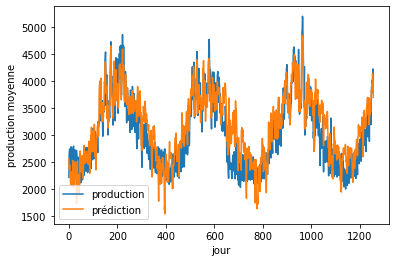

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 340.08099225760577
le score R2 avec la température prédite la veille 0.7256942934505626
Graphique prédiction


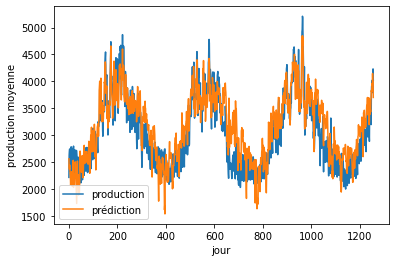

----------------------------------------------------------------------------------------------
Nouvelle-Aquitaine
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Nouvelle-Aquitaine
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 607.662495973539
le score R2 avec la température prédite la veille 0.6007925354349803
Graphique prédiction


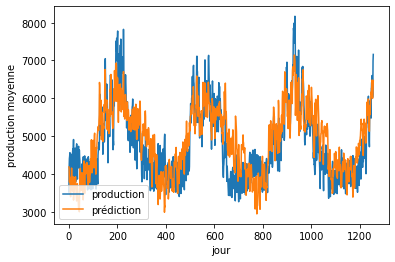

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 607.6254210628615
le score R2 avec la température prédite la veille 0.6008412471118719
Graphique prédiction


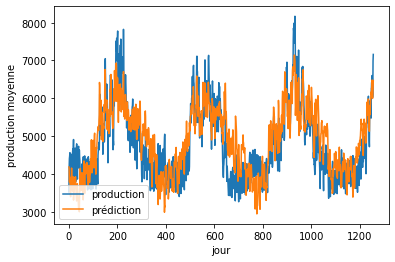

----------------------------------------------------------------------------------------------
Occitanie
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Occitanie
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 607.092030224292
le score R2 avec la température prédite la veille 0.5032382180671551
Graphique prédiction


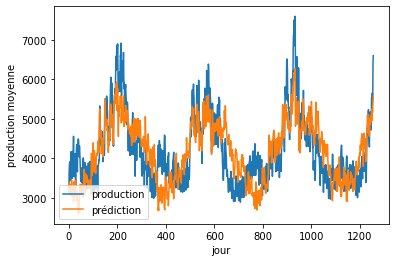

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 607.0664368811654
le score R2 avec la température prédite la veille 0.5032801014262334
Graphique prédiction


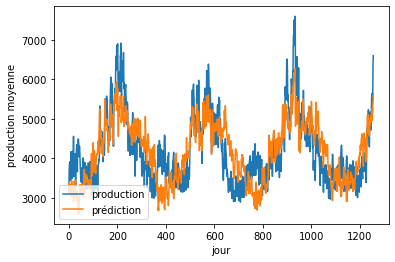

----------------------------------------------------------------------------------------------
Pays de la Loire
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Pays de la Loire
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 428.418699811872
le score R2 avec la température prédite la veille 0.5996450765000234
Graphique prédiction


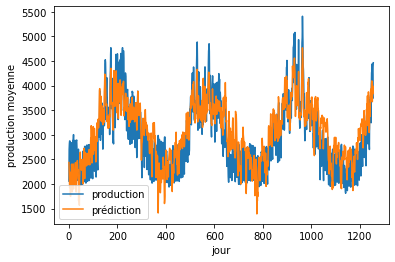

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 428.39303141198224
le score R2 avec la température prédite la veille 0.5996930490204808
Graphique prédiction


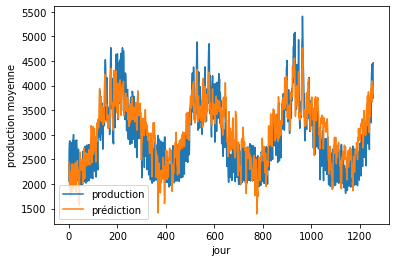

----------------------------------------------------------------------------------------------
Provence-Alpes-Côte d'Azur
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Provence-Alpes-Côte d'Azur
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 560.3262757918175
le score R2 avec la température prédite la veille 0.43723605050963643
Graphique prédiction


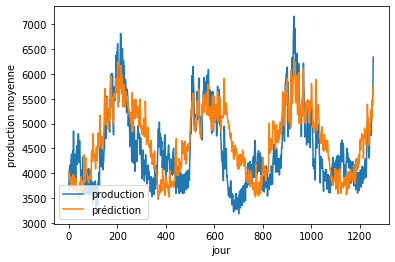

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 560.3057123340847
le score R2 avec la température prédite la veille 0.4372773555879137
Graphique prédiction


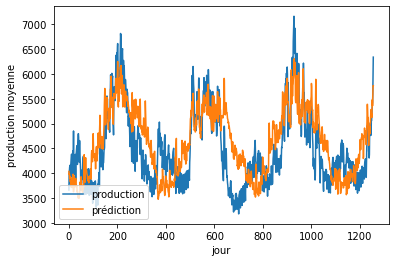

----------------------------------------------------------------------------------------------
Île-de-France
----------------------------------------------------------------------------------------------
---------------------------------------------------------------------
---------------------------------------------------------------------
Île-de-France
graphique selon linear
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 1025.8770927292996
le score R2 avec la température prédite la veille 0.6457937927585538
Graphique prédiction


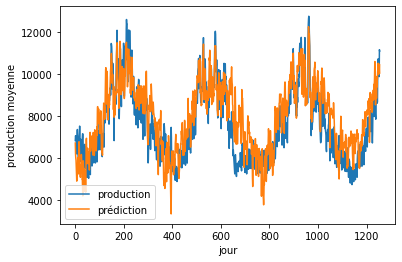

graphique selon Ridge
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 1025.8286854777741
le score R2 avec la température prédite la veille 0.6458272192665759
Graphique prédiction


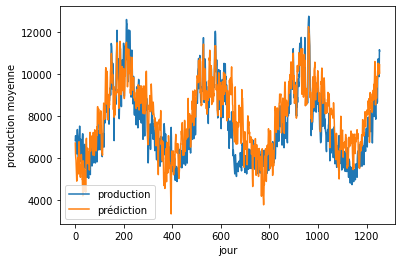

----------------------------------------------------------------------------------------------


In [70]:

models = {
    'linear': LinearRegression(),
    'Ridge': RidgeCV(),
}
nationale = 0
lin = 0
lin_7 = 0
lin_9 = 0
lin_11 = 0
lin_13 = 0
rid = 0
rid_7 = 0
rid_9 = 0
rid_11 = 0
rid_13 = 0

for reg in regions:
    print(reg)
    print('----------------------------------------------------------------------------------------------')
    conso, lin1, lin7, lin9, lin11, lin13, rid1, rid7, rid9, rid11, rid13 = conso_N (reg)
    nationale = conso
    lin = lin1
    lin_7 = lin7
    lin_9 = lin9
    lin_11 = lin11
    lin_13 = lin13
    rid = rid1
    rid_7 = rid7
    rid_9 = rid9
    rid_11 = rid11
    rid_13 = rid13
    print('----------------------------------------------------------------------------------------------')


---------------------------------------------------------------------
linéaire
---------------------------------------------------------------------
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 1025.8770927292996
L'erreur quadratique à 70% des conditions météo est 1693.3464183074698
L'erreur quadratique à 90% des conditions météo est 1168.7451173363281
L'erreur quadratique à 110% des conditions météo est 1015.056923149871
L'erreur quadratique à 130% des conditions météo est 1364.019177359931
La MAE est de 821.7026431603554
La MAE est de 1462.7889899855984
La MAE est de 963.4571249263968
La MAE est de 783.2496773725388
La MAE est de 1012.3769416570155
Le score est de 0.6457937927585538


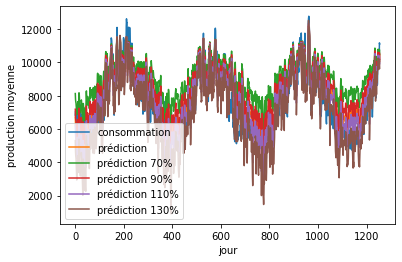

---------------------------------------------------------------------


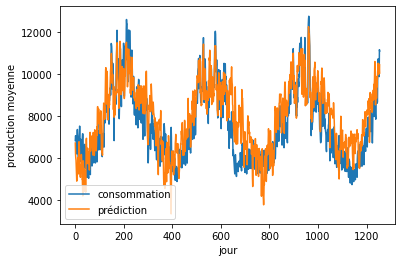

---------------------------------------------------------------------


In [71]:

print("---------------------------------------------------------------------")
print("linéaire")
print("---------------------------------------------------------------------")


rmse_linear = (np.sqrt(mean_squared_error(nationale, lin)))
rmse_linear7 = (np.sqrt(mean_squared_error(nationale, lin_7)))
rmse_linear9 = (np.sqrt(mean_squared_error(nationale, lin_9)))
rmse_linear11 = (np.sqrt(mean_squared_error(nationale, lin_11)))
rmse_linear13 = (np.sqrt(mean_squared_error(nationale, lin_13)))
mae_linear = mae(nationale, lin)
mae_linear7 = mae(nationale, lin_7)
mae_linear9 = mae(nationale, lin_9)
mae_linear11 = mae(nationale, lin_11)
mae_linear13 = mae(nationale, lin_13)
r_linear = r2_score(nationale, lin)
      
print('La performance du modèle sur la prédiction')
print('--------------------------------------')
print("L'erreur quadratique moyenne est {}".format(rmse_linear)) 
print("L'erreur quadratique à 70% des conditions météo est {}".format(rmse_linear7))
print("L'erreur quadratique à 90% des conditions météo est {}".format(rmse_linear9))
print("L'erreur quadratique à 110% des conditions météo est {}".format(rmse_linear11))
print("L'erreur quadratique à 130% des conditions météo est {}".format(rmse_linear13))
print('La MAE est de {}'.format(mae_linear)) 
print('La MAE est de {}'.format(mae_linear7)) 
print('La MAE est de {}'.format(mae_linear9)) 
print('La MAE est de {}'.format(mae_linear11)) 
print('La MAE est de {}'.format(mae_linear13)) 



print('Le score est de {}'.format(r_linear)) 
plt.plot(nationale, label='consommation')
plt.plot(lin, label='prédiction')
plt.plot(lin_7, label='prédiction 70%')
plt.plot(lin_9, label='prédiction 90%')
plt.plot(lin_11, label='prédiction 110%')
plt.plot(lin_13, label='prédiction 130%')
plt.xlabel('jour')
plt.ylabel('production moyenne')
plt.legend(loc='lower left')
plt.show()
print("---------------------------------------------------------------------")
plt.plot(nationale, label='consommation')
plt.plot(lin, label='prédiction')
plt.xlabel('jour')
plt.ylabel('production moyenne')
plt.legend(loc='lower left')
plt.show()
print("---------------------------------------------------------------------")

---------------------------------------------------------------------
ridge
---------------------------------------------------------------------
La performance du modèle sur la prédiction
--------------------------------------
L'erreur quadratique moyenne est 1025.8286854777741
L'erreur quadratique à 70% des conditopns météo est 1693.1837096949205
L'erreur quadratique à 90% des conditopns météo est 1168.6875707359768
L'erreur quadratique à 110% des conditopns météo est 1014.9685023704213
L'erreur quadratique à 130% des conditopns météo est 1363.7677013370514
La MAE est de 821.6849643533272
La MAE est de 1462.6358150555623
La MAE est de 963.4260489920102
La MAE est de 783.2120324194594
La MAE est de 1012.1859588737663
Le score est de 0.6458272192665759


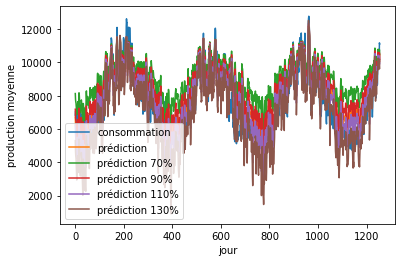

---------------------------------------------------------------------


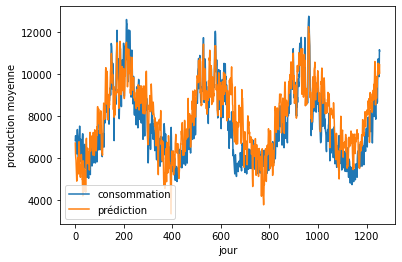

---------------------------------------------------------------------


In [72]:

print("---------------------------------------------------------------------")
print("ridge")
print("---------------------------------------------------------------------")


rmse_rid = (np.sqrt(mean_squared_error(nationale, rid)))
rmse_rid7 = (np.sqrt(mean_squared_error(nationale, rid_7)))
rmse_rid9 = (np.sqrt(mean_squared_error(nationale, rid_9)))
rmse_rid11 = (np.sqrt(mean_squared_error(nationale, rid_11)))
rmse_rid13 = (np.sqrt(mean_squared_error(nationale, rid_13)))
mae_rid = mae(nationale, rid)
mae_rid7 = mae(nationale, rid_7)
mae_rid9 = mae(nationale, rid_9)
mae_rid11 = mae(nationale, rid_11)
mae_rid13 = mae(nationale, rid_13)
r_rid = r2_score(nationale, rid)
      
print('La performance du modèle sur la prédiction')
print('--------------------------------------')
print("L'erreur quadratique moyenne est {}".format(rmse_rid)) 
print("L'erreur quadratique à 70% des conditopns météo est {}".format(rmse_rid7))
print("L'erreur quadratique à 90% des conditopns météo est {}".format(rmse_rid9))
print("L'erreur quadratique à 110% des conditopns météo est {}".format(rmse_rid11))
print("L'erreur quadratique à 130% des conditopns météo est {}".format(rmse_rid13))
print('La MAE est de {}'.format(mae_rid)) 
print('La MAE est de {}'.format(mae_rid7)) 
print('La MAE est de {}'.format(mae_rid9)) 
print('La MAE est de {}'.format(mae_rid11)) 
print('La MAE est de {}'.format(mae_rid13)) 

print('Le score est de {}'.format(r_rid)) 
plt.plot(nationale, label='consommation')
plt.plot(rid, label='prédiction')
plt.plot(rid_7, label='prédiction 70%')
plt.plot(rid_9, label='prédiction 90%')
plt.plot(rid_11, label='prédiction 110%')
plt.plot(rid_13, label='prédiction 130%')
plt.xlabel('jour')
plt.ylabel('production moyenne')
plt.legend(loc='lower left')
plt.show()
print("---------------------------------------------------------------------")
plt.plot(nationale, label='consommation')
plt.plot(rid, label='prédiction')
plt.xlabel('jour')
plt.ylabel('production moyenne')
plt.legend(loc='lower left')
plt.show()
print("---------------------------------------------------------------------")

# III- Modélisation de la consommation avec la méthode Holt Winter

In [73]:
df2 = pd.read_csv('eco2mix-regional-cons-def.csv', sep=';')

In [74]:
energie = df2.iloc[:,1:14]
energie.head()

# grouper pour avoir la consommation nationale par jour
energie['Date'] = pd.to_datetime(energie['Date'])    
new_energie = energie.groupby(['Date', 'Région']).mean()
new_energie = new_energie.groupby('Date').sum()
print('Nombre de données :',len(new_energie))
new_energie.head()

Nombre de données : 3256


,Consommation (MW),Thermique (MW),Nucléaire (MW),Eolien (MW),Solaire (MW),Hydraulique (MW),Pompage (MW),Bioénergies (MW)
Date,,,,,,,,
2013-01-01,54395.638298,3667.489362,49431.382979,2584.808511,119.829787,6805.872340,-1401.425532,718.319149
2013-01-02,64491.541667,4691.125000,55775.770833,1415.625000,262.770833,8782.166667,-730.541667,701.104167
2013-01-03,66640.916667,5944.291667,55268.500000,1608.895833,210.729167,9143.979167,-717.895833,726.375000
2013-01-04,65237.479167,5312.687500,55943.375000,1017.270833,141.729167,8631.250000,-1009.791667,749.583333
2013-01-05,60142.125000,3652.375000,55135.458333,916.500000,149.979167,8025.083333,-1153.333333,768.145833


In [75]:
# séparation des data en 2 parties 
data_80 = floor(len(new_energie)*0.8)
data_20 = ceil(len(new_energie)*0.2)
print('80% des données :',data_80)

80% des données : 2604


Dimensions du Dataframe "new_energie1" : (2604, 8)


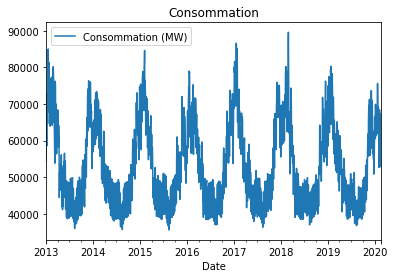

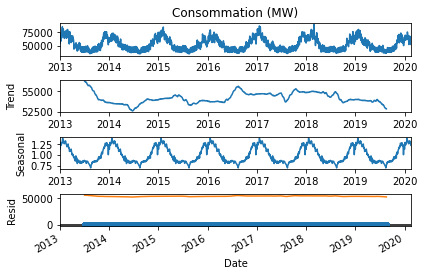

In [76]:
# new_energie1 sont les données utilisées pour calculer les prédictions
# new_energie2 sont les données utilisées pour comparer avec les prédictions
new_energie1 = new_energie.iloc[:data_80,:]
new_energie2 = new_energie.iloc[data_80:,:]

print('Dimensions du Dataframe "new_energie1" :',new_energie1.shape)
# Courbes pour la consommation
new_energie1[['Consommation (MW)']].plot(title='Consommation')

# graphique pour visualiser la saisonnalité / tendance 
result=seasonal_decompose(new_energie1['Consommation (MW)'], model='multiplicative', period=365)
result.plot();
result.trend.plot();

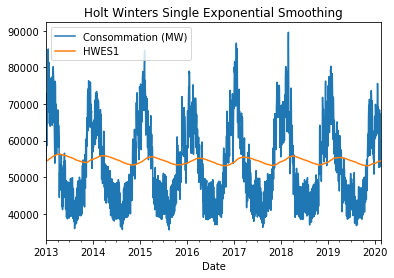

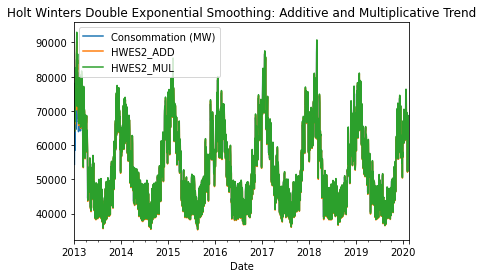

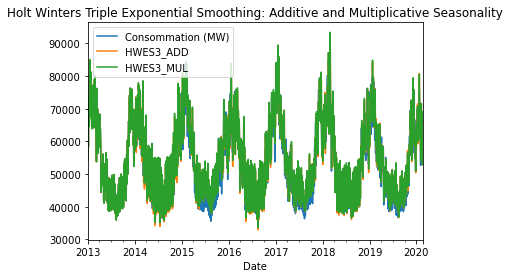

In [77]:
# Calcul du modèle de prédiction avec Holt Winter
m = 365
alpha = 1/(2*m)
new_energie1['HWES1'] = SimpleExpSmoothing(new_energie1['Consommation (MW)']).fit(smoothing_level=alpha, optimized=False,use_brute=True).fittedvalues
new_energie1[['Consommation (MW)','HWES1']].plot(title='Holt Winters Single Exponential Smoothing');

# Double HWES
# méthode additionnelle
new_energie1['HWES2_ADD'] = ExponentialSmoothing(new_energie1['Consommation (MW)'],trend='add').fit().fittedvalues
# méthode multiplicative
new_energie1['HWES2_MUL'] = ExponentialSmoothing(new_energie1['Consommation (MW)'],trend='mul').fit().fittedvalues
new_energie1[['Consommation (MW)','HWES2_ADD','HWES2_MUL']].plot(title='Holt Winters Double Exponential Smoothing: Additive and Multiplicative Trend');

# Triple HWES
# méthode additionnelle
new_energie1['HWES3_ADD'] = ExponentialSmoothing(new_energie1['Consommation (MW)'],trend='ADD',seasonal='add',seasonal_periods=360).fit().fittedvalues
# méthode multiplicative
new_energie1['HWES3_MUL'] = ExponentialSmoothing(new_energie1['Consommation (MW)'],trend='mul',seasonal='mul',seasonal_periods=360).fit().fittedvalues
new_energie1[['Consommation (MW)','HWES3_ADD','HWES3_MUL']].plot(title='Holt Winters Triple Exponential Smoothing: Additive and Multiplicative Seasonality');

## 1. Prédiction avec paramètre additionnel

Text(0.5, 1.0, 'Train, Test et Prediction test avec Holt Winters et la méthode additionnel')

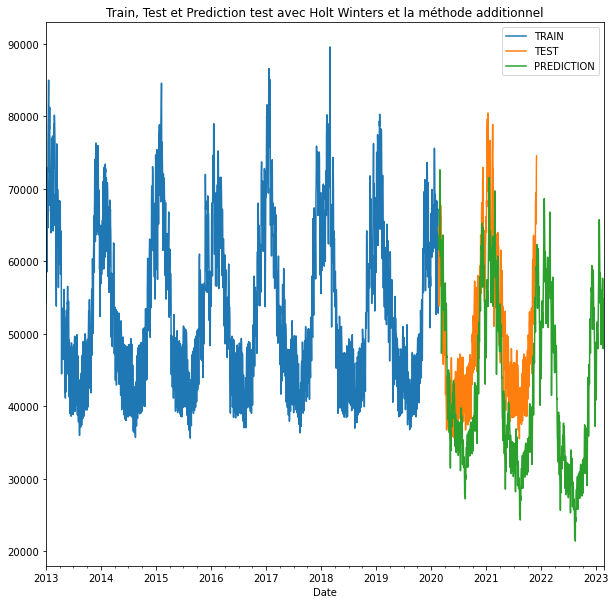

In [78]:
train_energie = new_energie1
test_energie = new_energie2

# Comparaison du modèle avec la réalité avec la méthode additionnelle
fitted_model_add = ExponentialSmoothing(train_energie['Consommation (MW)'],trend='ADD',seasonal='ADD',seasonal_periods=365).fit()
test_predictions_add = fitted_model_add.forecast(1100)
train_energie['Consommation (MW)'].plot(legend=True,label='TRAIN')
test_energie['Consommation (MW)'].plot(legend=True,label='TEST',figsize=(10,10))
test_predictions_add.plot(legend=True,label='PREDICTION')
plt.title('Train, Test et Prediction test avec Holt Winters et la méthode additionnel')

In [79]:
# calcul des performances additionnelles
add = test_predictions_add - test_energie['Consommation (MW)']
mse_add = np.mean(add**2)
mae_add = np.mean(abs(add))
rmse_add = np.sqrt(mse_add)
mean_add = np.mean(test_predictions_add)

print("Performance de la prédiction avec la méthode additionnelle:")
print("Moyenne des prédictions:", np.mean(test_predictions_add))
print("Maximum des prédictions:", np.max(test_predictions_add))
print("Minimum des prédictions:", np.min(test_predictions_add))
print("Moyenne de la conso réelle:", np.mean(test_energie['Consommation (MW)']))
print("Maximum de la conso réelle:", np.max(test_energie['Consommation (MW)']))
print("Minimum de la conso réelle:", np.min(test_energie['Consommation (MW)']))
print("MAE:",mae_add)
print("MSE:", mse_add)
print("RMSE:", rmse_add)

Performance de la prédiction avec la méthode additionnelle:
Moyenne des prédictions: 43299.978528246174
Maximum des prédictions: 72632.65819392349
Minimum des prédictions: 21371.755656414352
Moyenne de la conso réelle: 50491.41685838442
Maximum de la conso réelle: 80476.16666666667
Minimum de la conso réelle: 35502.375
MAE: 8701.505784847484
MSE: 102929766.48131254
RMSE: 10145.430817925504


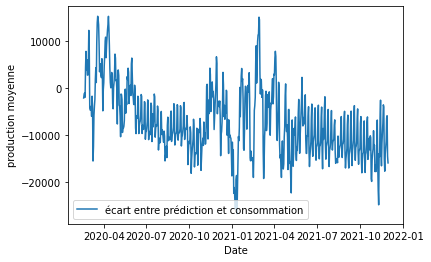

In [80]:
plt.plot(add, label='écart entre prédiction et consommation')
plt.xlabel('Date')
plt.ylabel('production moyenne')
plt.legend(loc='lower left')
plt.show()

Commentaire sur le modèle additionnel : La courbe ci-dessus représente la prédiction moins la consommation réelle. Nous observons qu'il y a plus de valeurs négatives que positives, c'est à dire que la consommation réelle est supérieure à la prédiction. Le modèle sous-estime la consommation.

## 2. Prédiction avec paramètre multiplicatif

Text(0.5, 1.0, 'Train, Test et Prediction test avec Holt Winters et la méthode multiplicative')

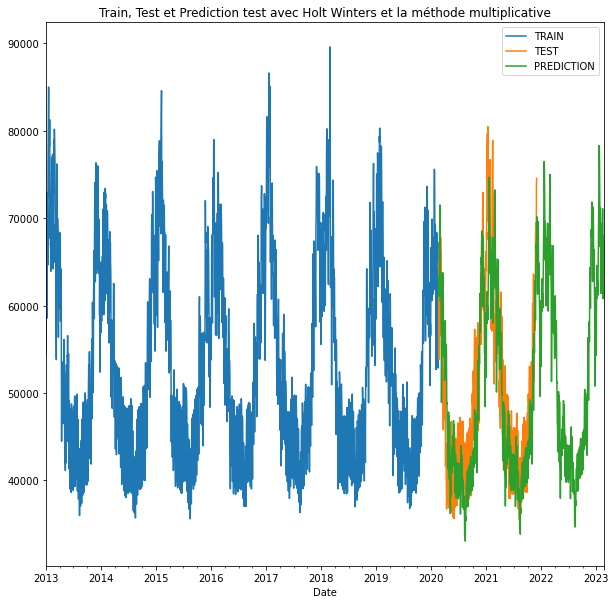

In [81]:
# Comparaison du modèle avec la réalité avec la méthode multiplicative
fitted_model_mul = ExponentialSmoothing(train_energie['Consommation (MW)'],trend='mul',seasonal='mul',seasonal_periods=365).fit()
test_predictions_mul = fitted_model_mul.forecast(1100)
train_energie['Consommation (MW)'].plot(legend=True,label='TRAIN')
test_energie['Consommation (MW)'].plot(legend=True,label='TEST',figsize=(10,10))
test_predictions_mul.plot(legend=True,label='PREDICTION')
plt.title('Train, Test et Prediction test avec Holt Winters et la méthode multiplicative')

In [83]:
# calcul des performances multiplicatives
mul = test_predictions_mul - test_energie['Consommation (MW)']
mean_mul = np.mean(mul)
mse_mul = np.mean(mul**2)
mae_mul = np.mean(abs(mul))
rmse_mul = np.sqrt(mse_mul)


print("Performance de la prédiction:")
print("Moyenne des prédictions:", np.mean(test_predictions_mul))
print("Maximum des prédictions:", np.max(test_predictions_mul))
print("Minimum des prédictions:", np.min(test_predictions_mul))
print("Moyenne de la conso réelle:", np.mean(test_energie['Consommation (MW)']))
print("Maximum de la conso réelle:", np.max(test_energie['Consommation (MW)']))
print("Minimum de la conso réelle:", np.min(test_energie['Consommation (MW)']))
print("MAE:",mae_mul)
print("MSE:", mse_mul)
print("RMSE:", rmse_mul)

Performance de la prédiction:
Moyenne des prédictions: 51159.22615952278
Maximum des prédictions: 78314.6788458783
Minimum des prédictions: 33038.48907972637
Moyenne de la conso réelle: 50491.41685838442
Maximum de la conso réelle: 80476.16666666667
Minimum de la conso réelle: 35502.375
MAE: 5111.045577786061
MSE: 39393242.340916075
RMSE: 6276.403615201629


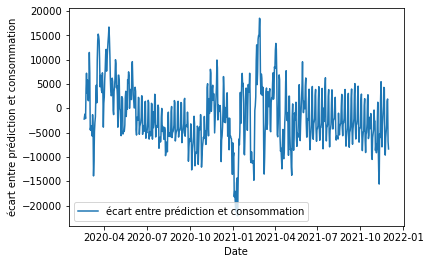

In [84]:
plt.plot(mul, label='écart entre prédiction et consommation')
plt.xlabel('Date')
plt.ylabel('écart entre prédiction et consommation')
plt.legend(loc='lower left')
plt.show()

Commentaire sur le modèle multiplicatif : 
La courbe ci-dessus représente la prédiction moins la consommation réelle. Nous observons qu'il y a approximativement autant de valeurs négatives que positives. 

#### Conclusion méthode Holt Winter

<p>Nous observons que les prédictions avec la méthode de Holt Winter sont meilleures lorsque nous utilisons en paramètre la multiplication plutôt qu'avec le paramètre additionnel.
<p>Ces prédictions sont réalisées par la méthode de Holt Winter avec une donnée par jour et une saisonnalité de 1 an.

Les résultats de la prédiction avec la méthode additionnelle ne sont pas proches de la consommation réelle : 
    <br/>- avec un maximum à 72632 au lieu de 80476
    <br/>- une moyenne à 72632 au lieu de 80476
    <br/>- et un minimum à 21371 au lieu de 35502
<br/>La méthode additionnelle sous-estime la consommation d'électricité en France.
    
    
Les résultats de la prédiction avec la méthode multiplicative sont proches de la consommation réelle.  
Les valeurs obtenues sont :
    <br/>- au maximum à 78314 alors que le réel est à 80476, soit un écart de 2000.
    <br/>- une moyenne de 51159 alors que le réel est à 50491, soit une légère sur-estimation
    <br/>- un minimum à 33038 au lieu de 35502 soit un écart de 2000.
<br/>Cette prédiction sous-estime la consommation sur les extrêmes mais en moyenne sur-estime légèrement la consommation. 
Cet écart peut être compensé par une utilisation des productions thermique ou hydraulique.

# IV- Modélisation de la consommation avec SARIMA

<p>ARMA est une des méthodes de base pour modéliser des séries temporelles. Elle se base sur la stationnarité des processus. Une série temporelle est considérée comme étant stationnaire lorsque sa moyenne ou espérance est constante, que sa variance est constante et finie et que l'autocorrélation entre la variable Xt et Xt-k ne dépend que du décalage k.
<p>ARIMA et SARIMA sont des méthodes plus complètes pour modéliser les données temporelles, non limitées par la stationnarité.
<p>Du fait des variations importantes des phénomènes et des différents impacts externes liés à l'environnement météorologique et sociétal, il est plus juste d'entamer la modélisation de façon la plus complète possible.
<p>Par ailleurs, pour des raisons pratiques, nous effectuerons ces modélisations sur les bases de temps du jour et de la semaine correspondant approximativement à celles développées à travers l'approche naïve précédente, et nous viserons les pics de consommation. Ces bases de temps sont les plus susceptibles d'être adaptées à une réactivité. Prédire sur 1 mois, par exemple, engloberait une période trop large et inexploitable. Prédire pour chaque heure peut être intéressant, mais cela demanderait trop de ressources pour une valeur ajoutée discutable.
<p>Cette étude sera divisée en 3 phases : visualisation, analyse et prédiction.

## 1. Visualisation

In [85]:
sarima_ = df[['Région','Consommation (MW)']]
#sarima_idf = df[df['Région'] == 'Île-de-France']['Consommation (MW)']
#sarima_idf_month = sarima_idf.groupby(pd.Grouper(freq="M")).max()
#sarima_idf_week = sarima_idf.groupby(pd.Grouper(freq="W")).max()
#sarima_idf_day = sarima_idf.groupby(pd.Grouper(freq="D")).max()
#sarima_idf_hour = sarima_idf.groupby(pd.Grouper(freq="H")).max()
#plt.plot(sarima_idf)

# Fonction
# Données d'entrainement et de test sélectionnées à la main (ordre chronologique)
# Ratio 80-20.
# Modèle SARIMA très coûteux : 1000 points max. pour assurer la performance.
def chrono_train(dataframe):
    return dataframe.iloc[0:round(dataframe.shape[0]*4/5)] if dataframe.shape[0] < 500 else dataframe.iloc[round(dataframe.shape[0]-500):round(dataframe.shape[0]-500/5)]

def chrono_test(dataframe):
    return dataframe.iloc[round(dataframe.shape[0]*4/5):round(dataframe.shape[0])] if dataframe.shape[0] < 500 else dataframe.iloc[round(dataframe.shape[0]-500/5):round(dataframe.shape[0])]
    
def recap_train_test(name_df_train, name_df_test, base_time):
    print("Nombre de données d'entrainement :", name_df_train.shape[0])
    print('Nombre de données de test :', name_df_test.shape[0])
    print("Date de fin d'entrainement :",name_df_train.index[-1])
    plt.plot(name_df_train, label='Train')
    plt.plot(name_df_test, label='Test')
    plt.legend(title='Data', bbox_to_anchor=(1, 1))
    plt.xlabel('Date')
    plt.ylabel('Consommation [MW]')
    plt.title('Valeur max. de chaque '+ base_time);

# Initialisation des variables utilisées ultérieurement pour l'entrainement et le test
#sarima_idf_week_train, sarima_idf_week_test, sarima_idf_day_train, sarima_idf_day_test = '', '', '', ''

Nombre de données d'entrainement : 373
Nombre de données de test : 93
Date de fin d'entrainement : 2020-02-23 00:00:00


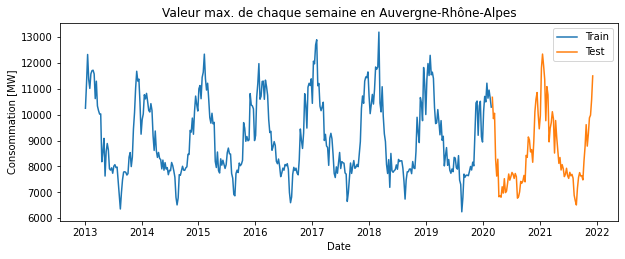

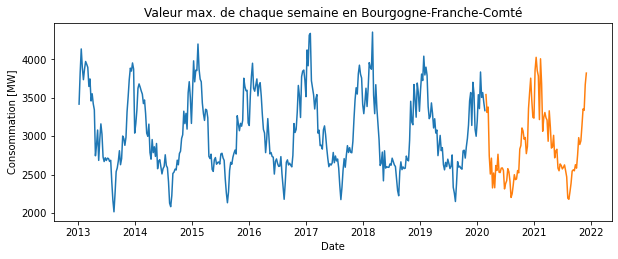

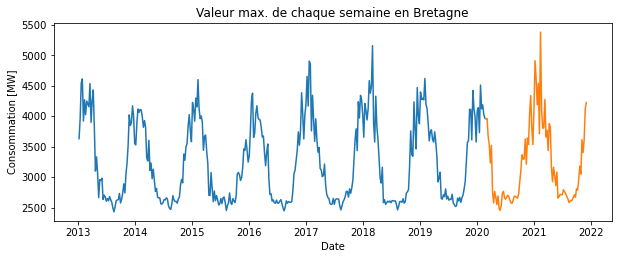

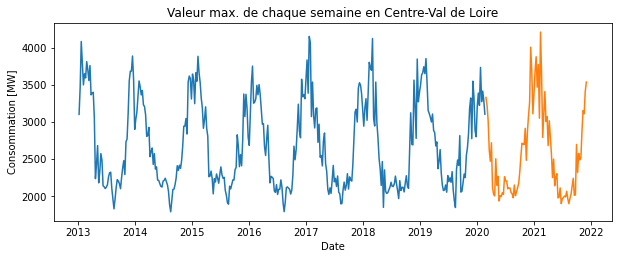

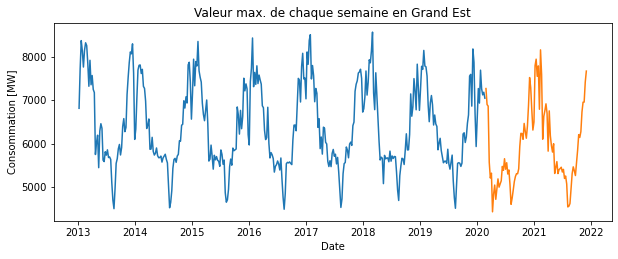

...

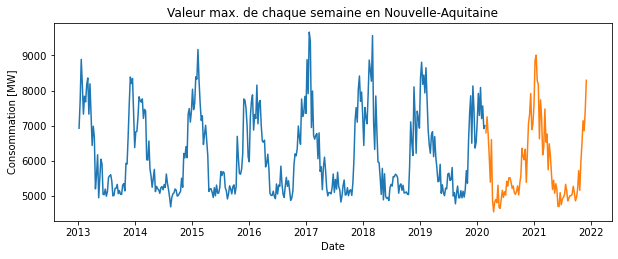

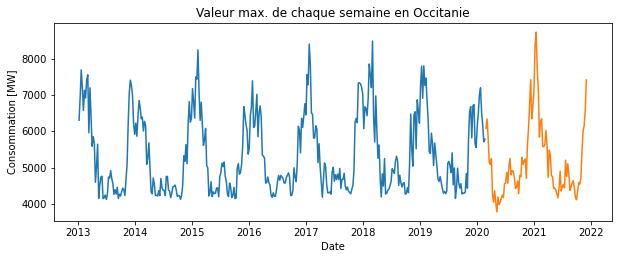

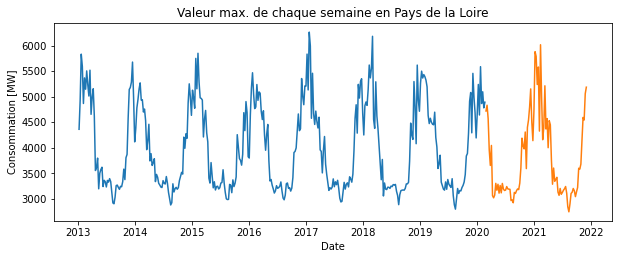

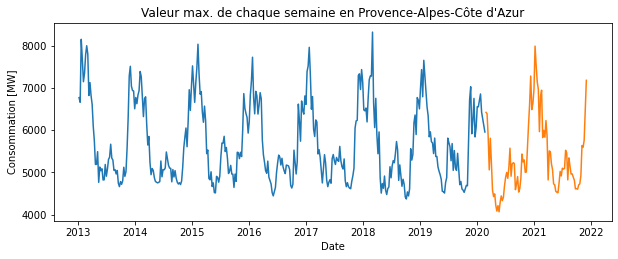

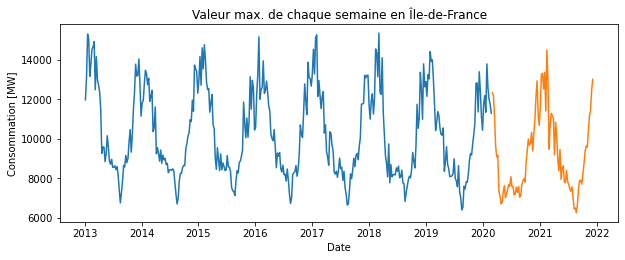

In [86]:
for i in range(len(regions)):
    plt.figure(figsize=(10, 8))
    plt.subplot(2,1,1)
    plt.plot(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), label='Train')
    plt.plot(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), label='Test')
    if i==0:
        print("Nombre de données d'entrainement :", chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()).shape[0])
        print('Nombre de données de test :', chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()).shape[0])
        print("Date de fin d'entrainement :", chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()).index[-1])
        plt.legend()
    
    plt.xlabel('Date')
    plt.ylabel('Consommation [MW]')
    plt.title('Valeur max. de chaque semaine en '+regions[i]);
    

## 2. Analyse

Décomposition automatique pour la région Auvergne-Rhône-Alpes


<Figure size 720x576 with 0 Axes>

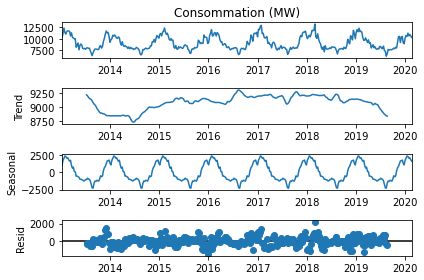

Décomposition automatique pour la région Bourgogne-Franche-Comté


<Figure size 720x576 with 0 Axes>

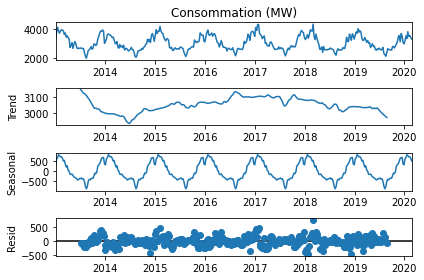

Décomposition automatique pour la région Bretagne


<Figure size 720x576 with 0 Axes>

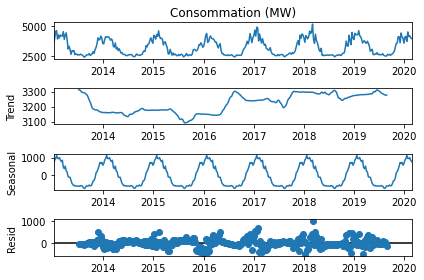

Décomposition automatique pour la région Centre-Val de Loire


<Figure size 720x576 with 0 Axes>

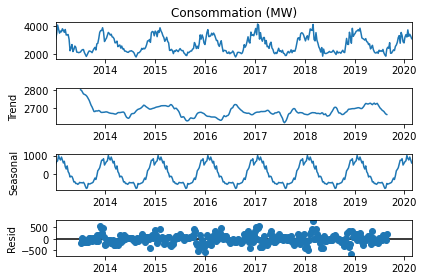

Décomposition automatique pour la région Grand Est


<Figure size 720x576 with 0 Axes>

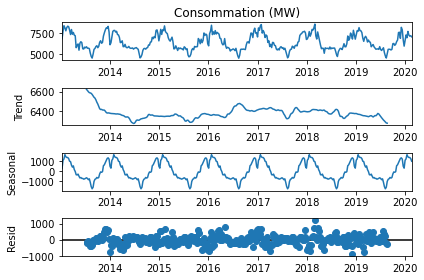

Décomposition automatique pour la région Hauts-de-France


<Figure size 720x576 with 0 Axes>

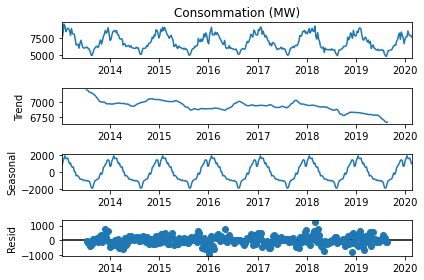

Décomposition automatique pour la région Normandie


<Figure size 720x576 with 0 Axes>

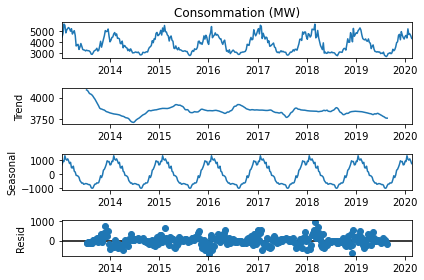

Décomposition automatique pour la région Nouvelle-Aquitaine


<Figure size 720x576 with 0 Axes>

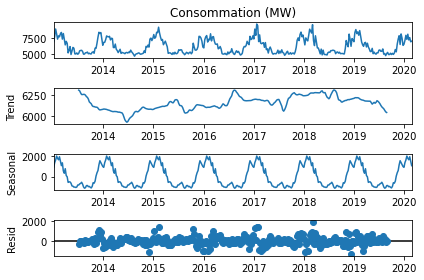

Décomposition automatique pour la région Occitanie


<Figure size 720x576 with 0 Axes>

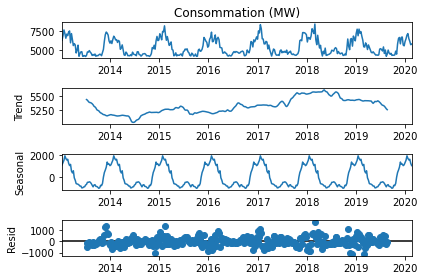

Décomposition automatique pour la région Pays de la Loire


<Figure size 720x576 with 0 Axes>

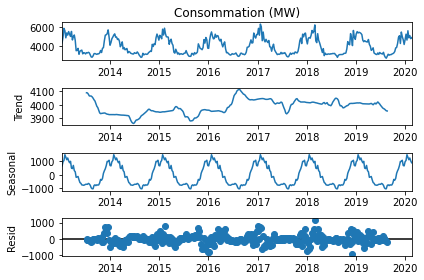

Décomposition automatique pour la région Provence-Alpes-Côte d'Azur


<Figure size 720x576 with 0 Axes>

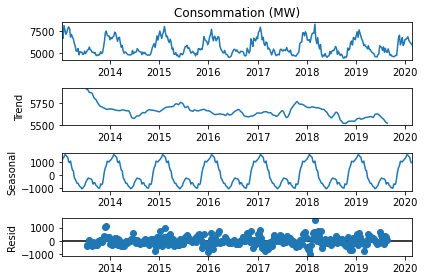

Décomposition automatique pour la région Île-de-France


<Figure size 720x576 with 0 Axes>

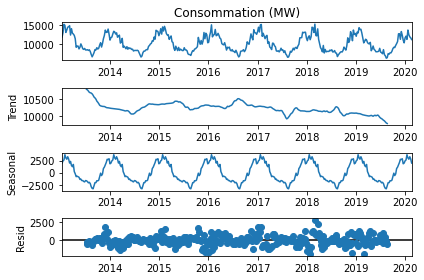

In [87]:
for i in range(len(regions)):
    plt.figure(figsize=(10, 8))
    res = seasonal_decompose(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), period = 52) # On fixe une période à 1 an
    res.plot()
    print('Décomposition automatique pour la région '+regions[i])
    plt.show()

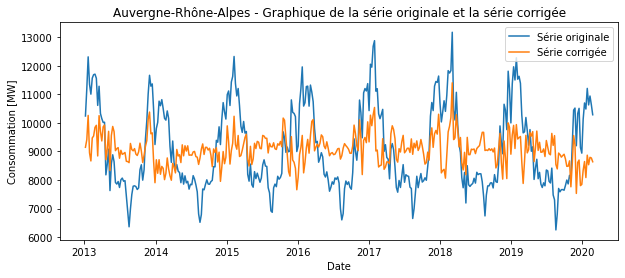

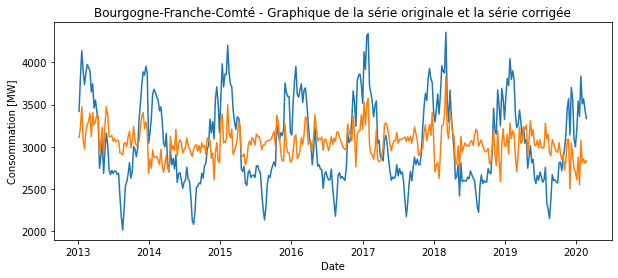

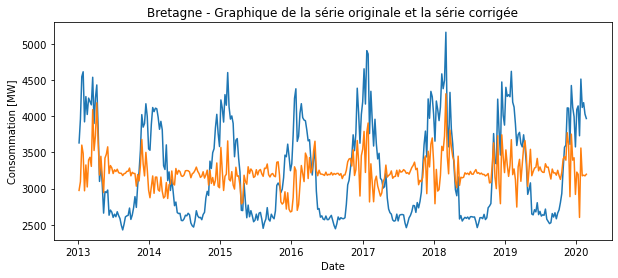

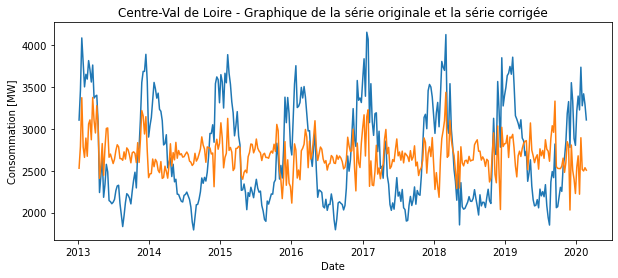

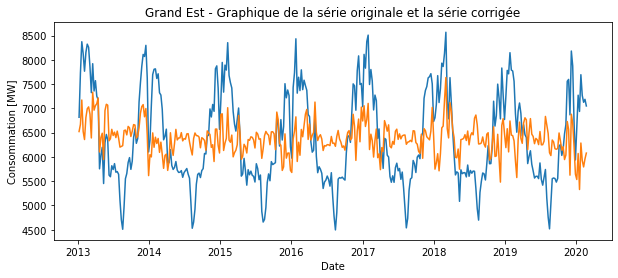

...

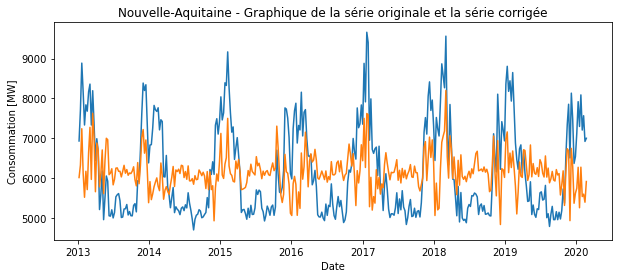

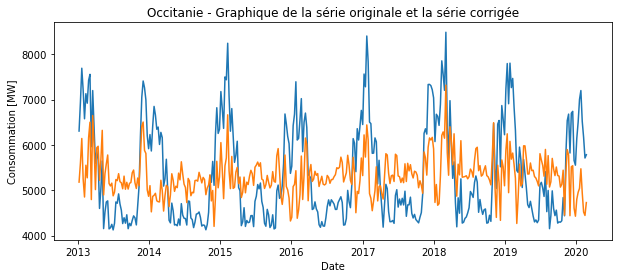

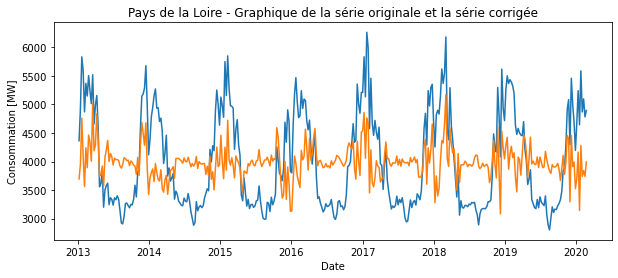

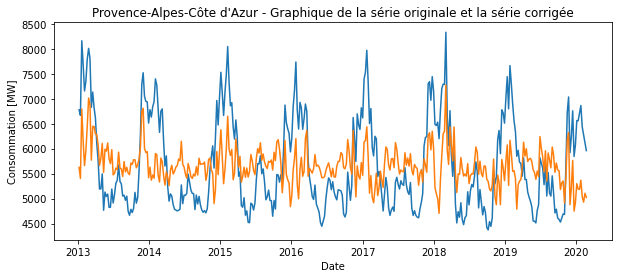

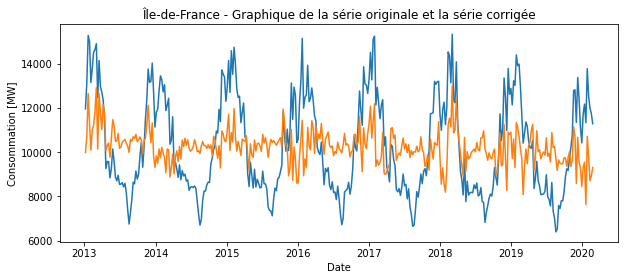

In [88]:
for i in range(len(regions)):
    # On soustrait les coefficients saisonniers à la série sarima_idf
    cvs=chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()) - seasonal_decompose(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), period = 52).seasonal
    
    # On affiche la série
    plt.figure(figsize=(10,4))
    plt.plot(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), label='Série originale')
    plt.plot(cvs, label='Série corrigée') 
    plt.title(regions[i]+' - Graphique de la série originale et la série corrigée')
    plt.xlabel('Date')
    plt.ylabel('Consommation [MW]')
    if i==0:
        plt.legend()

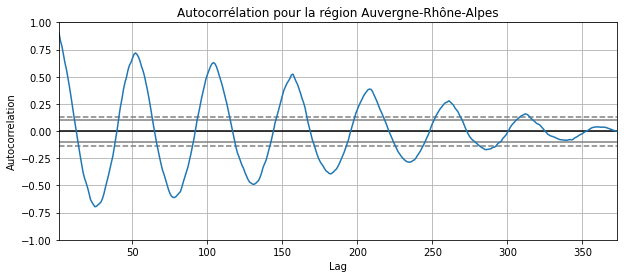

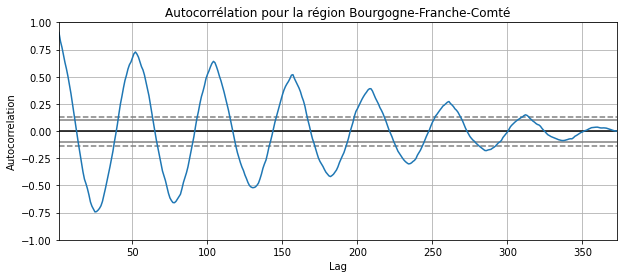

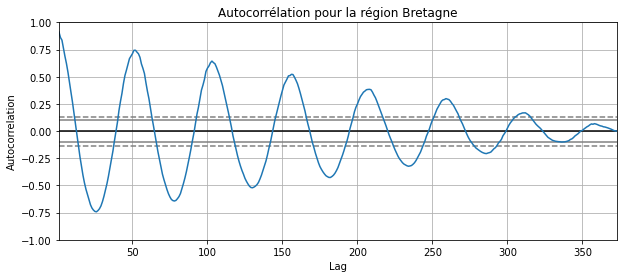

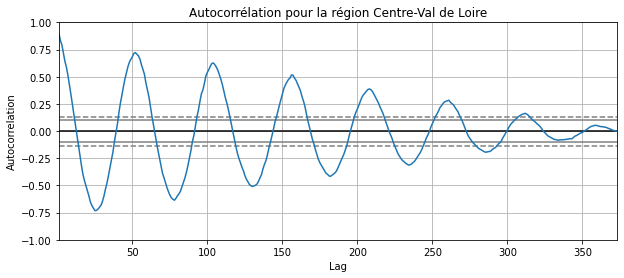

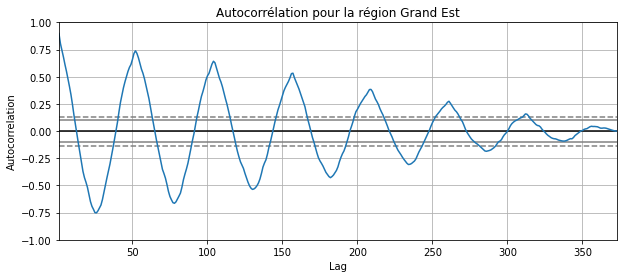

...

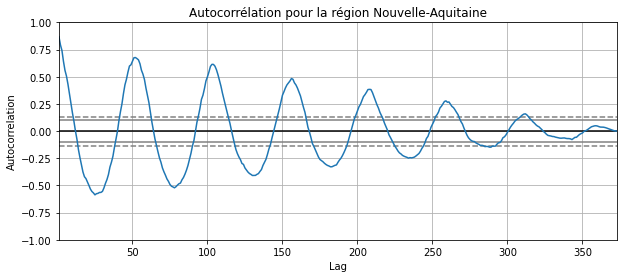

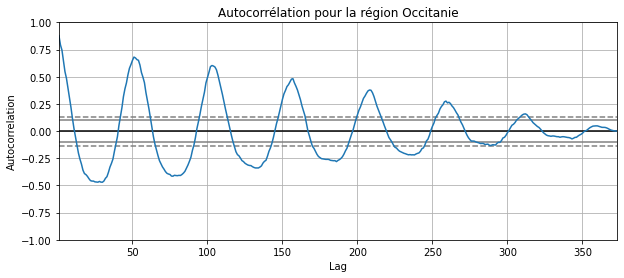

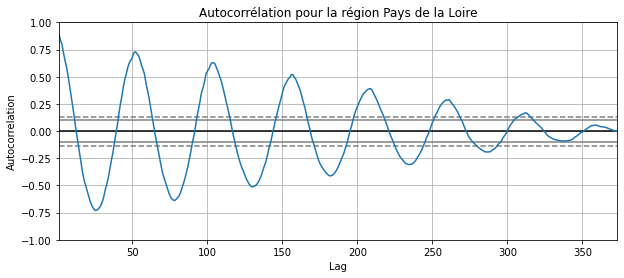

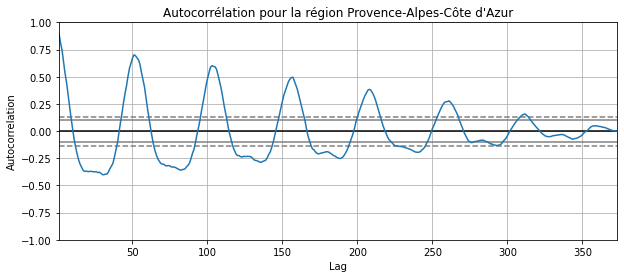

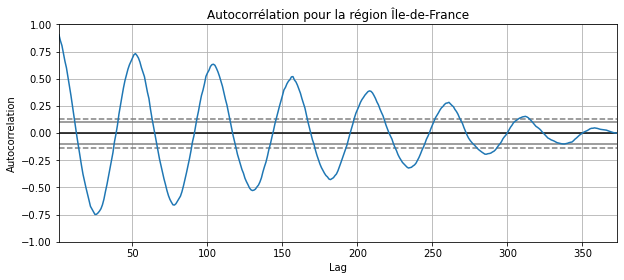

In [89]:
for i in range(len(regions)):
    # Autocorrélation de la série de données
    plt.figure(figsize=(10,4))
    plt.title('Autocorrélation pour la région '+regions[i])
    pd.plotting.autocorrelation_plot(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()));

### → Différentiation d'ordre 1

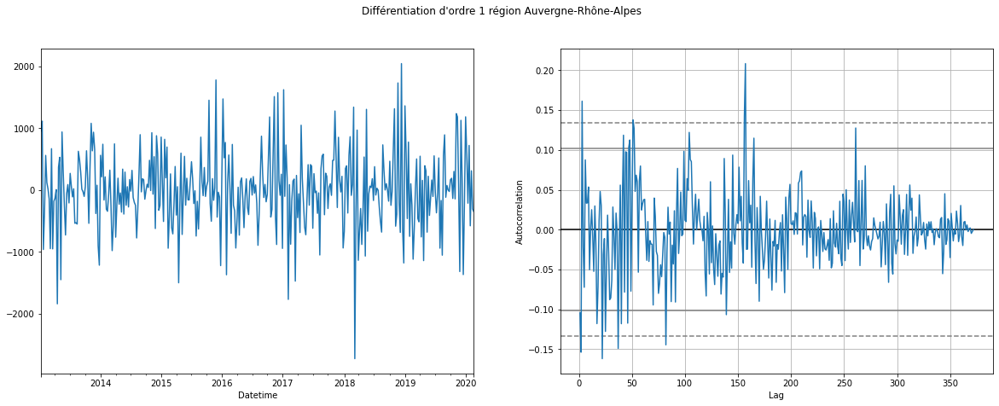

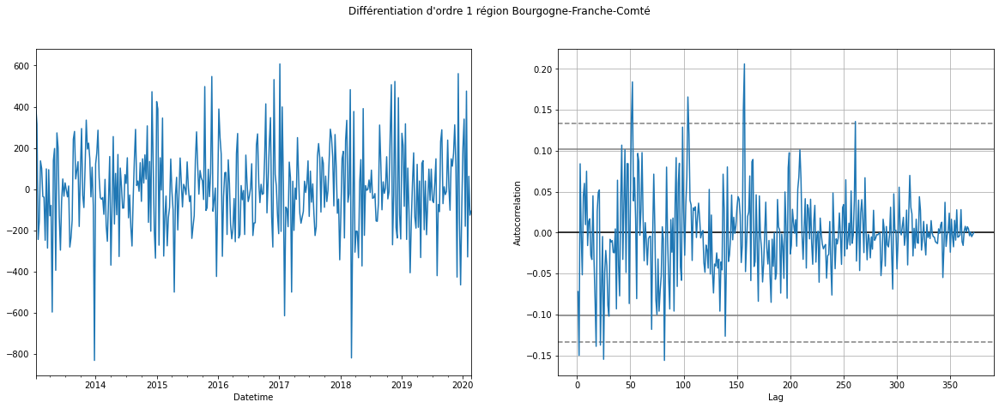

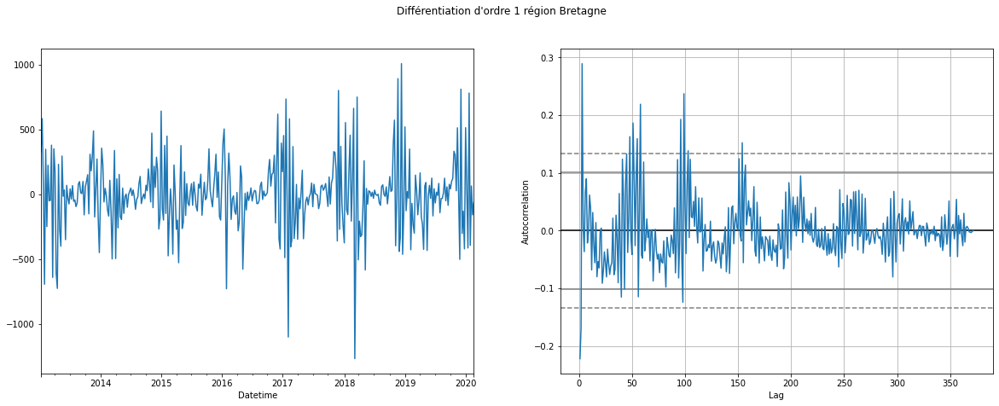

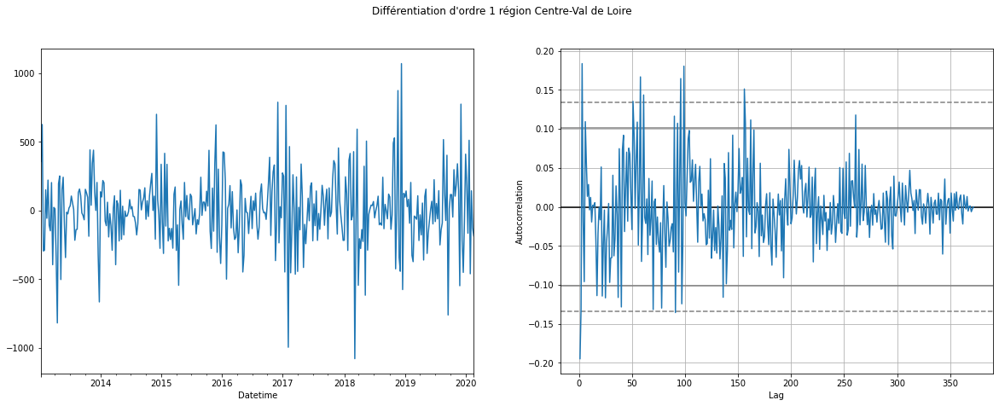

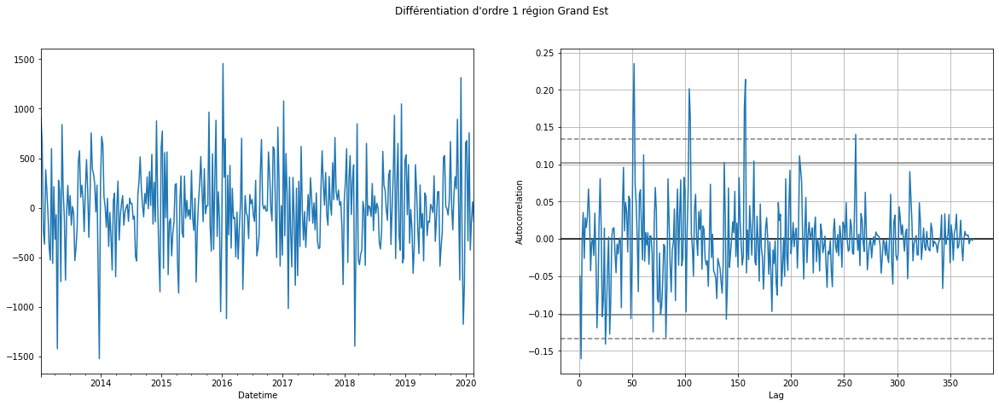

...

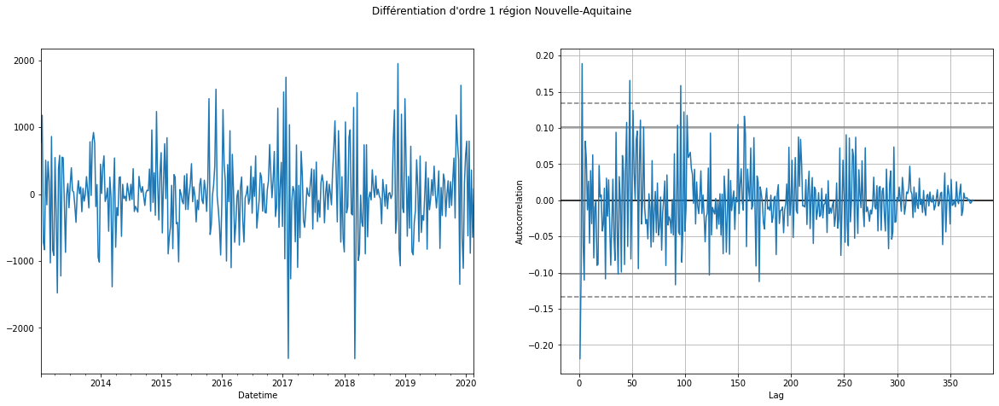

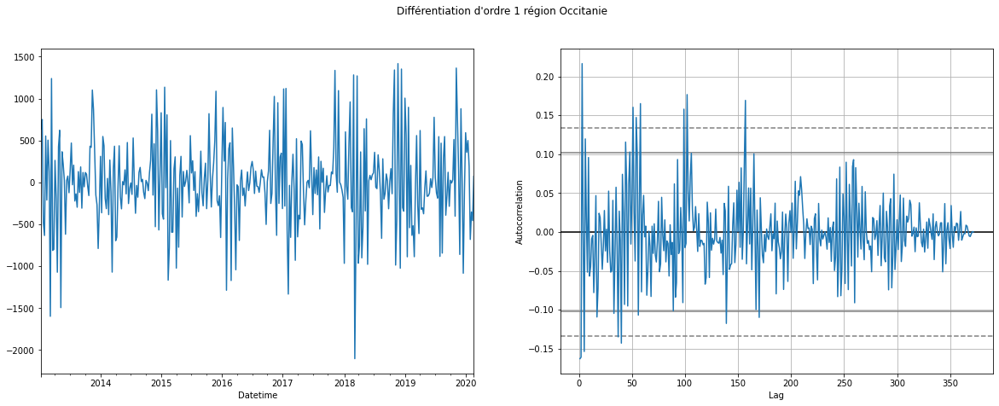

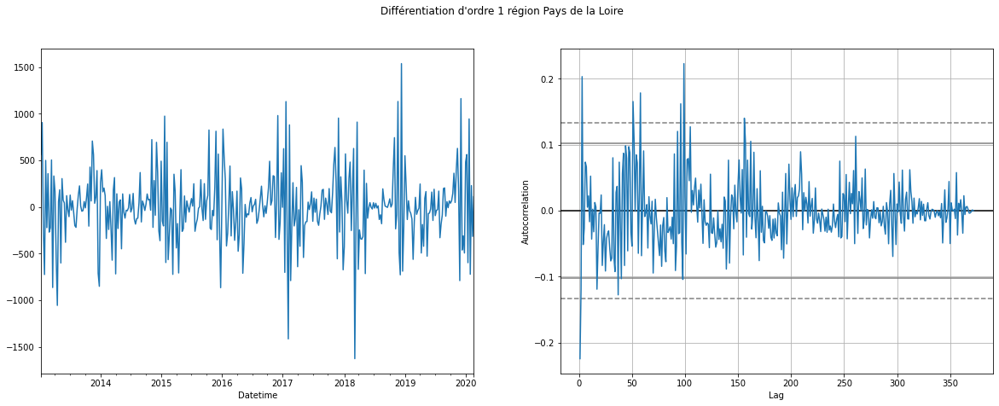

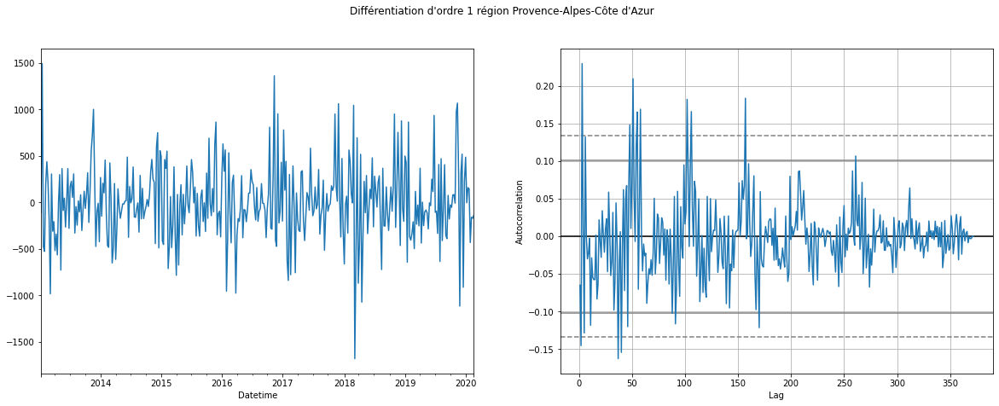

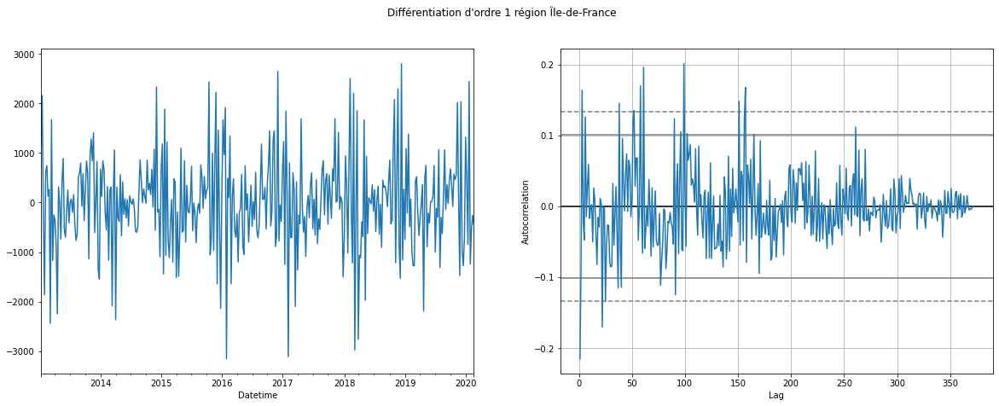

In [90]:
for i in range(len(regions)):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7)) # Création de la figure et des axes
    plt.suptitle("Différentiation d'ordre 1 région "+regions[i])
    AC_1 = chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()).diff().dropna() # Différenciation ordre 1
    AC_1.plot(ax = ax1) # Série temporelle différenciée
    pd.plotting.autocorrelation_plot(AC_1, ax = ax2); # Autocorrélogramme de la série différenciée

### → Différentiation annuelle

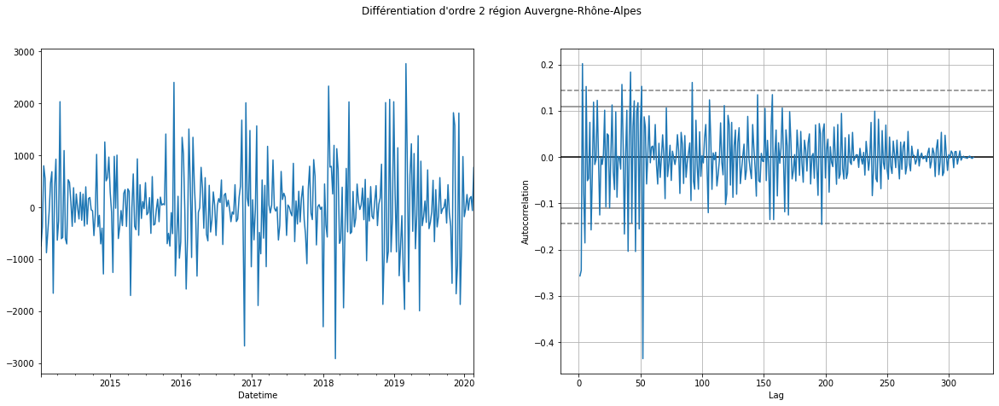

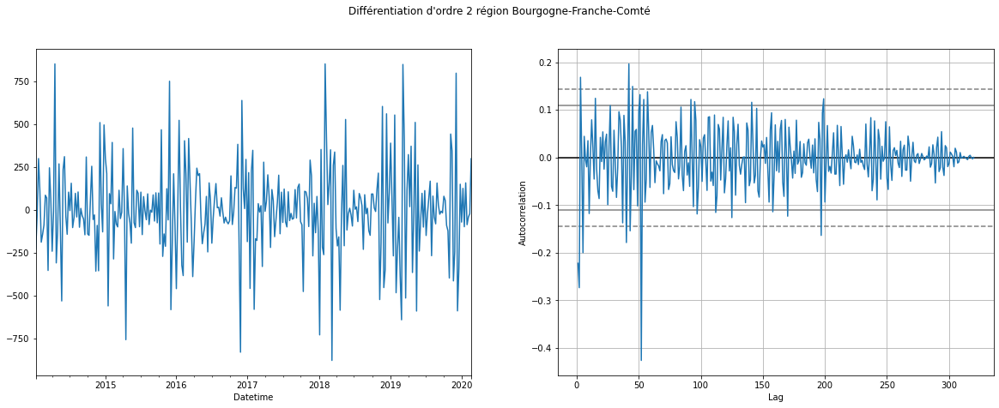

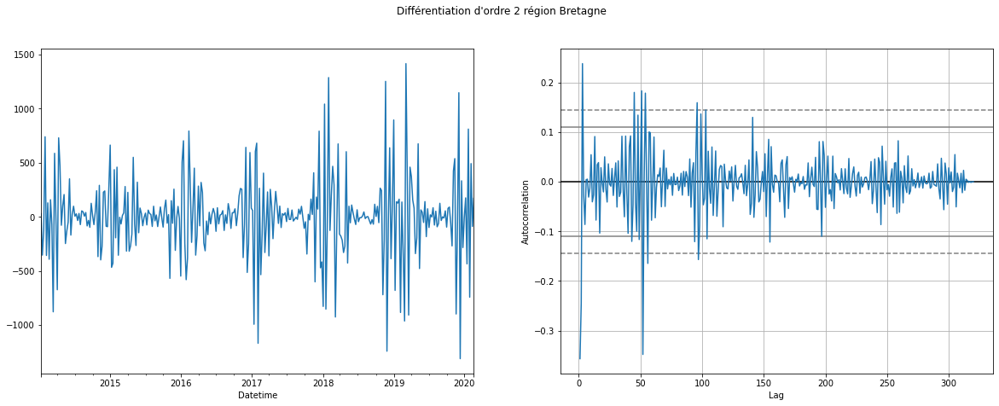

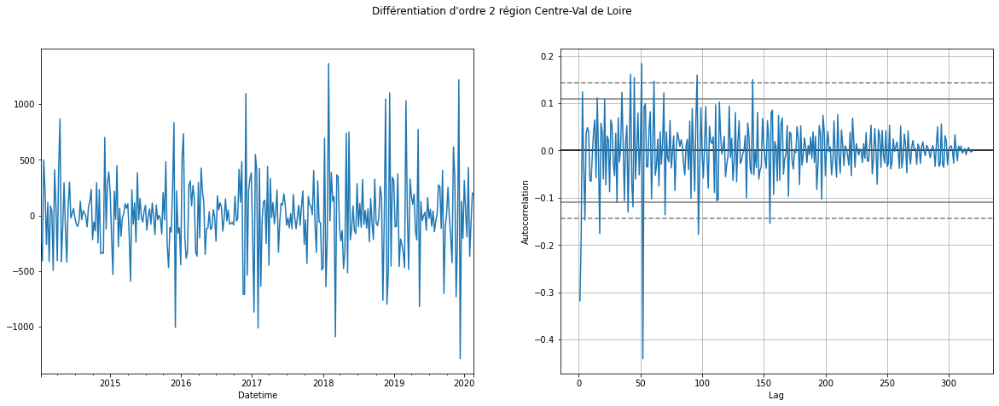

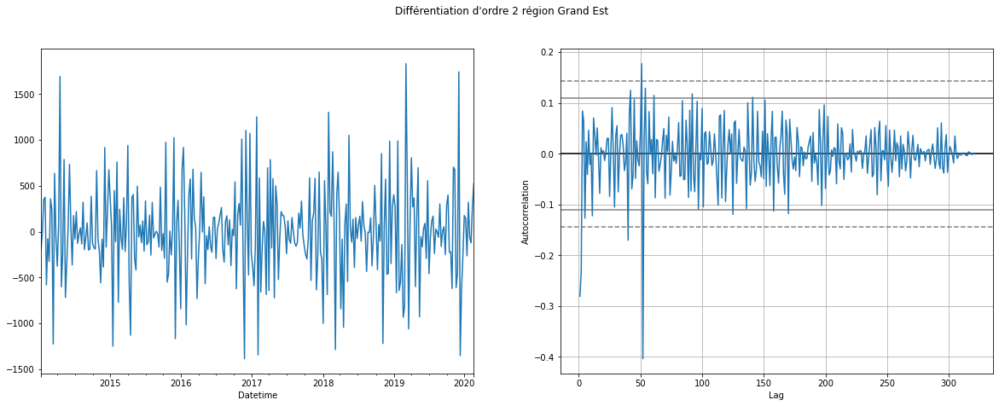

...

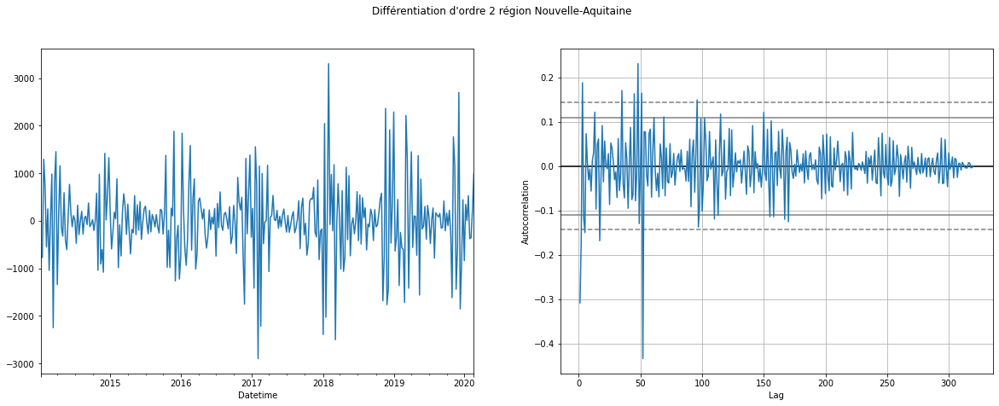

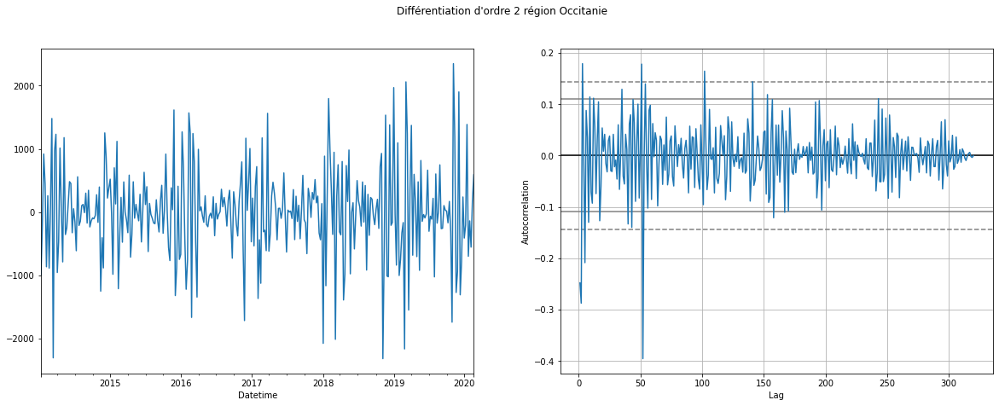

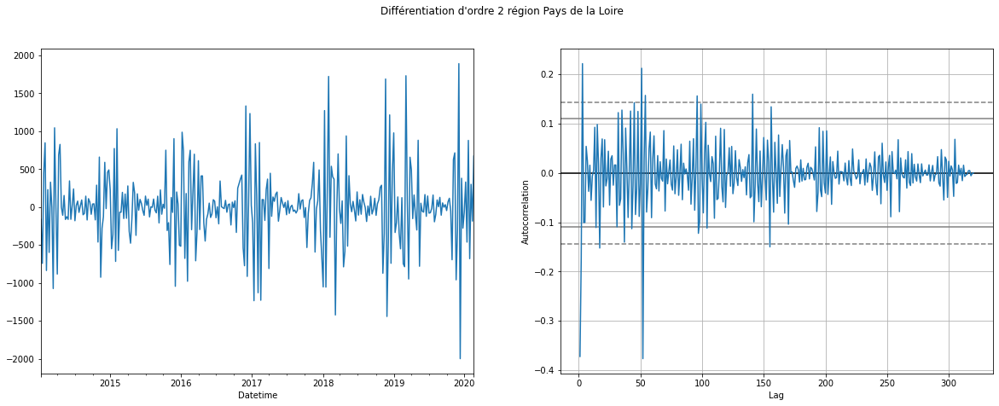

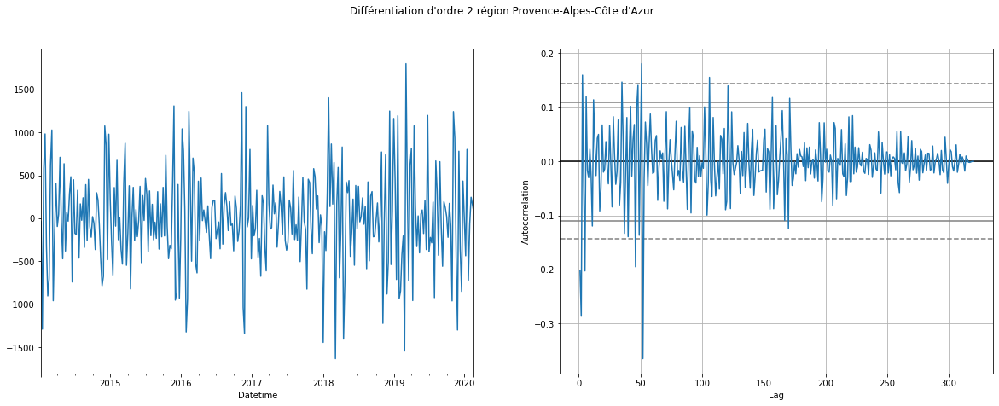

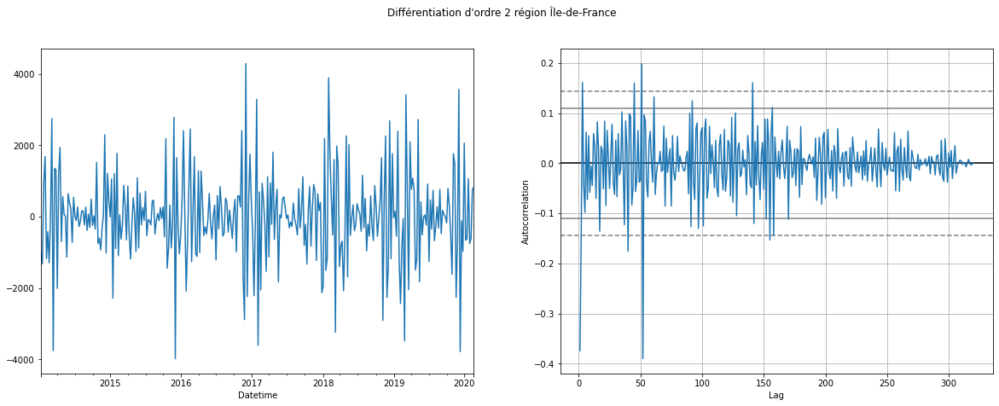

In [91]:
for i in range(len(regions)):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7)) # Création de la figure et des axes
    plt.suptitle("Différentiation d'ordre 2 région "+regions[i])
    AC_2 = chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()).diff().dropna().diff(periods = 52).dropna() #Différenciation d'ordre 2 période 52 semaines (1 an)
    AC_2.plot(ax = ax1) # Série doublement différenciée
    pd.plotting.autocorrelation_plot(AC_2, ax = ax2); # Autocorrélogramme de la série

On applique le test augmenté de Dickey-Fuller à la série doublement différenciée afin de vérifier l'hypothèse H0 : "la série n'est pas stationnaire".

In [92]:
for i in range(len(regions)):
    _, p_value, _, _, _, _  = sm.tsa.stattools.adfuller(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()).diff().dropna().diff(periods = 52).dropna())
    print('p_value région',regions[i],':',round(p_value,2))  # p-valeurs de 0% : on peut considérer la série comme stationnaire.

p_value région Auvergne-Rhône-Alpes : 0.0
p_value région Bourgogne-Franche-Comté : 0.0
p_value région Bretagne : 0.0
p_value région Centre-Val de Loire : 0.0
p_value région Grand Est : 0.0
p_value région Hauts-de-France : 0.0
p_value région Normandie : 0.0
p_value région Nouvelle-Aquitaine : 0.0
p_value région Occitanie : 0.0
p_value région Pays de la Loire : 0.0
p_value région Provence-Alpes-Côte d'Azur : 0.0
p_value région Île-de-France : 0.0


Suite à ce travail de stationnarisation, nous pouvons enchaîner avec le choix des ordres de processus SARIMA.

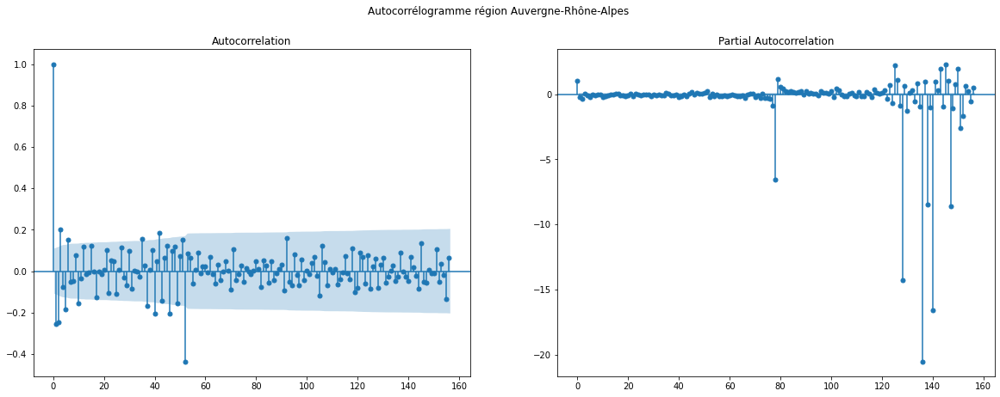

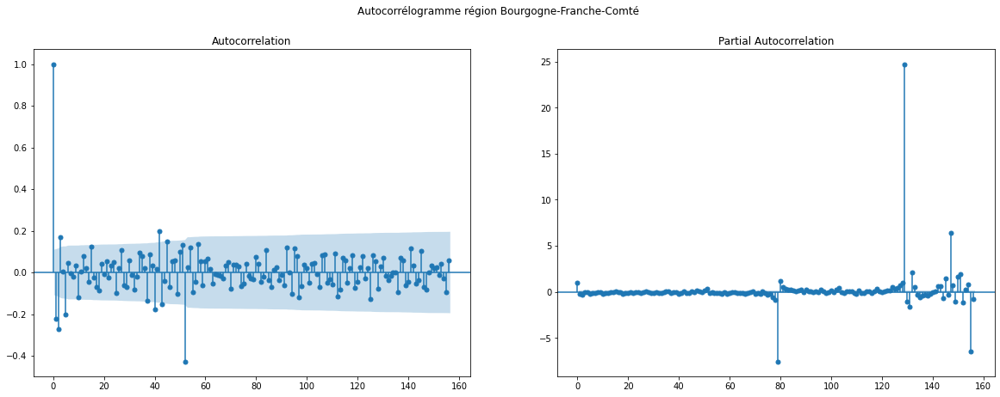

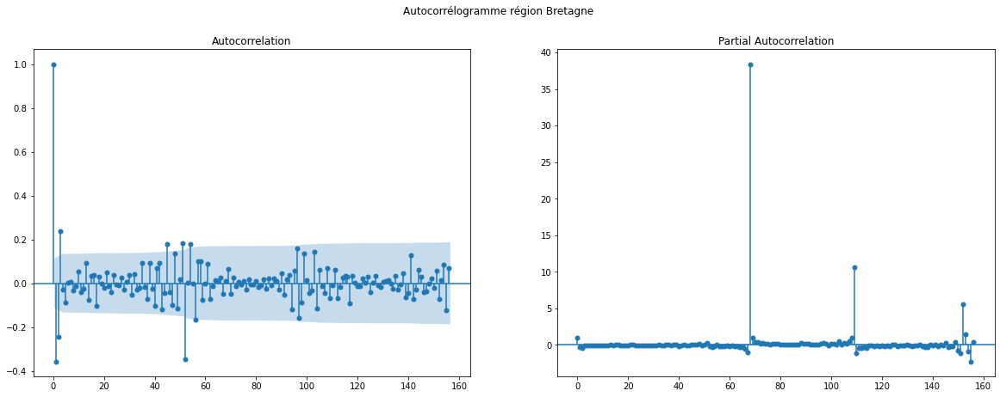

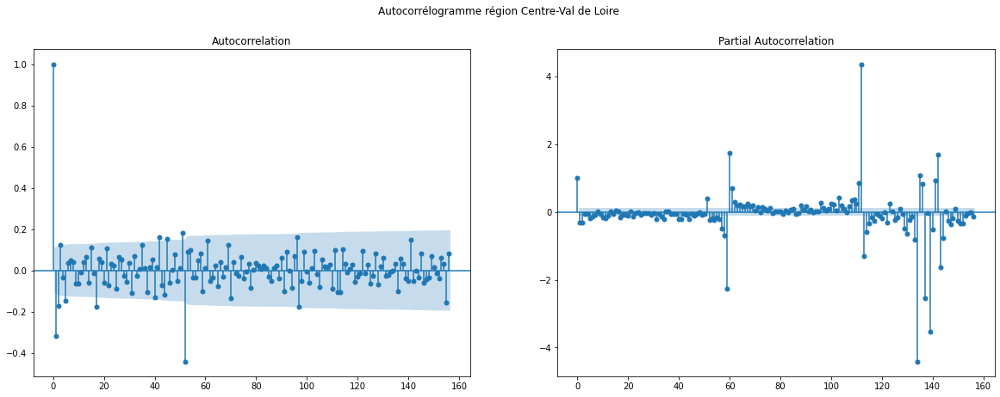

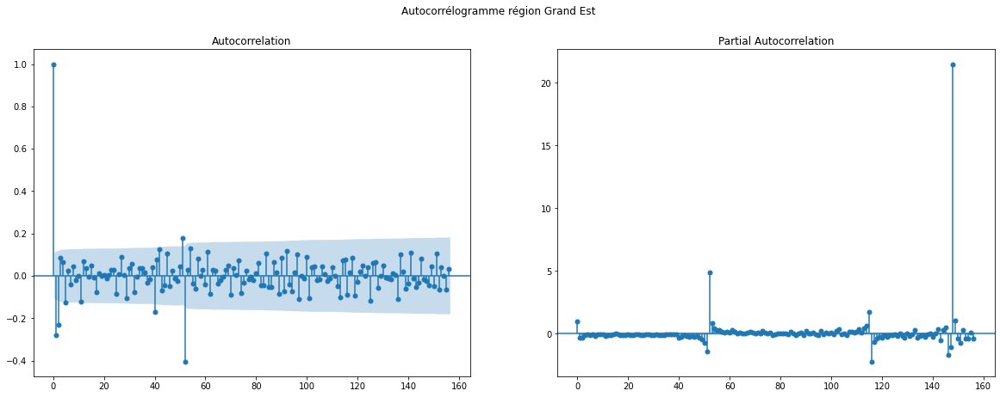

...

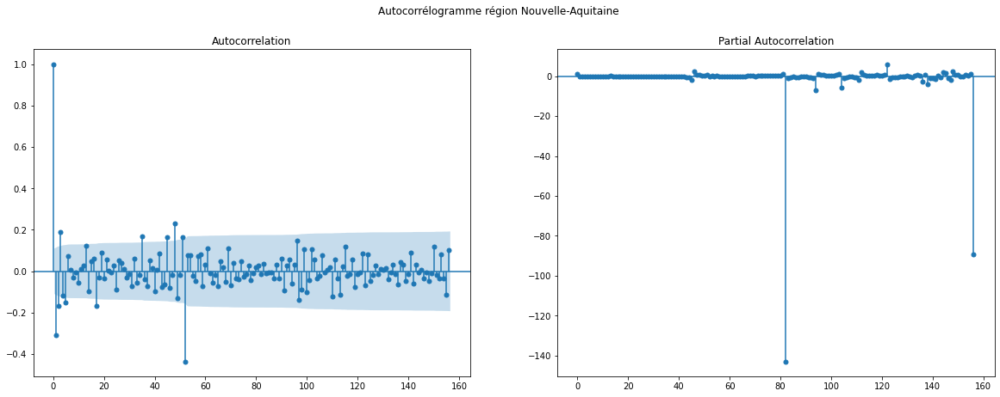

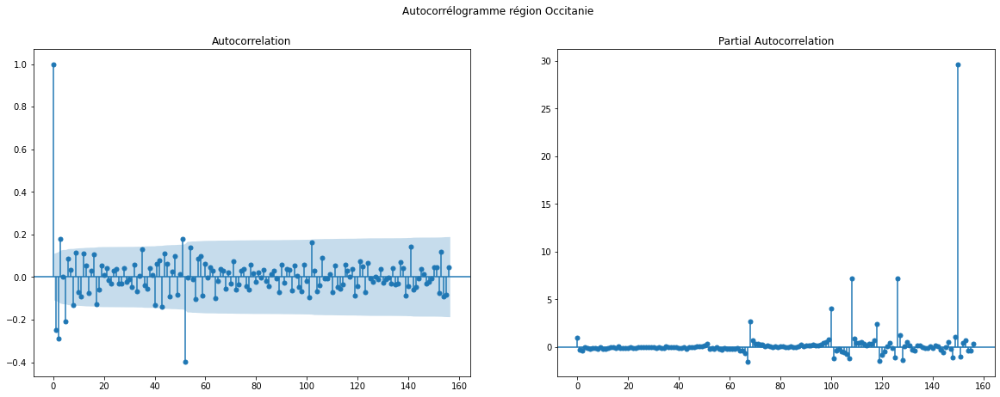

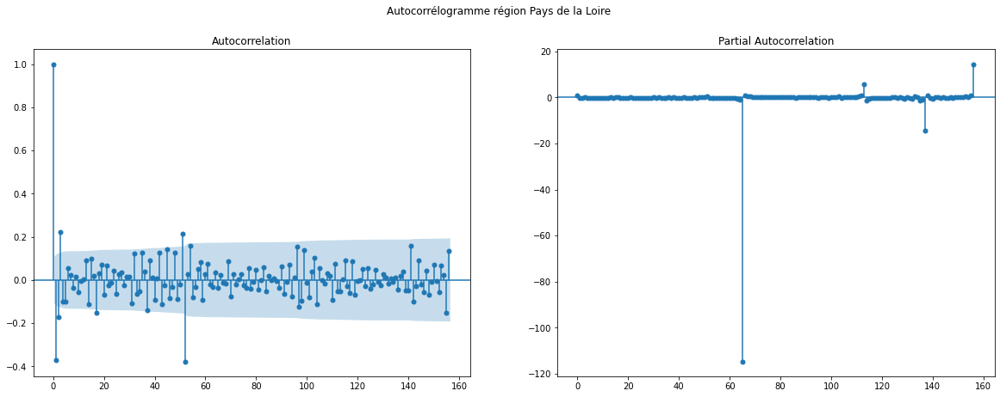

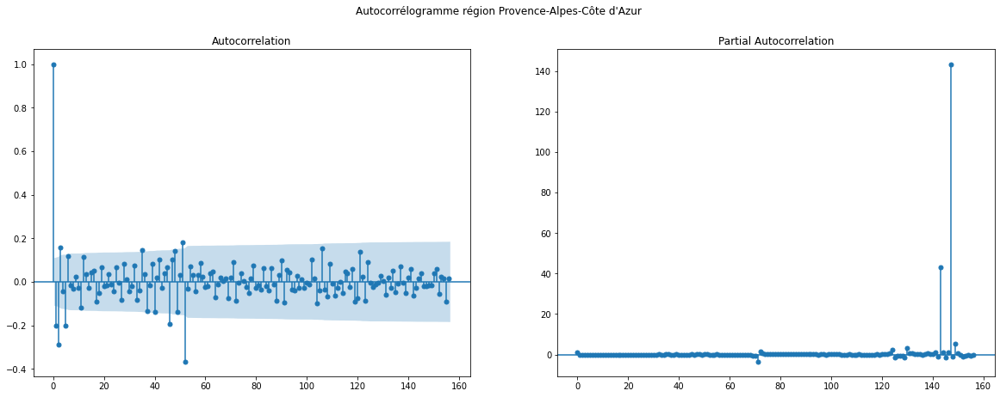

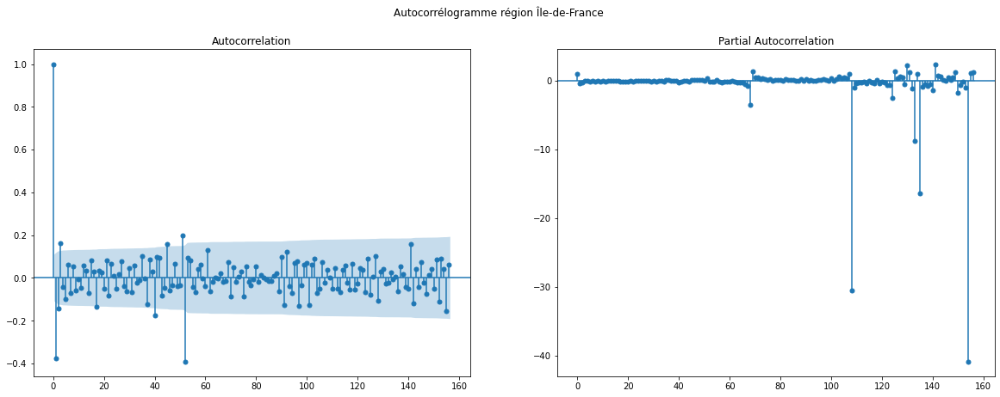

In [93]:
for i in range(len(regions)):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
    plt.suptitle("Autocorrélogramme région "+regions[i])
    plot_acf(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()).diff().dropna().diff(periods = 52).dropna(), lags = 156, ax=ax1)
    plot_pacf(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()).diff().dropna().diff(periods = 52).dropna(), lags = 156, ax=ax2)
    plt.show()

<p>On ne remarque pas de coupure en particulier. On suppose donc un processus  ARMA(p,q). Nous allons donc commencer par estimer via un  ARMA(1,1)  la partie non saisonnière de notre série temporelle.
<p>Pour les ordres saisonniers (P et Q), il suffit de se référer aux mêmes règles mais en regardant uniquement les pics saisonniers (n fois la période). Ici on regarde donc les  52ème ,  104ème  et  156ème  pics.
<p>Pour l'autocorrélation simple, on observe une forte valeur au  52ème  pic, tandis que le  104ème  et  156ème  pics sont extrêmement faibles. La règle sur l'ACF pour un processus  MA⁡(1) est respectée.
<p>Pour l'autocorrélation partielle, on n'observe pas de coupure nette. La règle sur la PACF pour un processus  MA⁡(1) est encore respectée.
<p>On suppose donc pour la partie saisonnière un processus  MA⁡(1) ce qui équivaut à un ARMA⁡(0,1).

In [94]:
for i in range(len(regions)):
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,1,52))
    sarima=model.fit()
    print('')
    print('\033[1m' + 'Modèle SARIMA(1,1,1)(0,1,1)52, région '+regions[i] + '\033[0m')
    print(sarima.summary())


Modèle SARIMA(1,1,1)(0,1,1)52, région Auvergne-Rhône-Alpes
                                     SARIMAX Results                                      
Dep. Variable:                  Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 1)x(0, 1, 1, 52)   Log Likelihood               -2494.163
Date:                            Sun, 13 Mar 2022   AIC                           4996.326
Time:                                    23:51:41   BIC                           5011.399
Sample:                                01-06-2013   HQIC                          5002.345
                                     - 02-23-2020                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5014      0.038     13.087      0.000


Modèle SARIMA(1,1,1)(0,1,1)52, région Hauts-de-France
                                     SARIMAX Results                                      
Dep. Variable:                  Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 1)x(0, 1, 1, 52)   Log Likelihood               -2340.055
Date:                            Sun, 13 Mar 2022   AIC                           4688.110
Time:                                    23:53:01   BIC                           4703.183
Sample:                                01-06-2013   HQIC                          4694.129
                                     - 02-23-2020                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4024      0.046      8.719      0.000     


Modèle SARIMA(1,1,1)(0,1,1)52, région Pays de la Loire
                                     SARIMAX Results                                      
Dep. Variable:                  Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 1)x(0, 1, 1, 52)   Log Likelihood               -2323.283
Date:                            Sun, 13 Mar 2022   AIC                           4654.566
Time:                                    23:54:06   BIC                           4669.639
Sample:                                01-06-2013   HQIC                          4660.585
                                     - 02-23-2020                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3185      0.038      8.282      0.000    

<p>La significativité des paramètres diffère selon les régions. Celle-ci se mesure en étudiant les p_values. Les paramètres sont significatifs dans le modèle si les p_values sont inférieures à 5%.
<p>3 profils distincts ressortent ainsi parmi les régions, nécessitant des ajustements spécifiques.
<ul>
    <li>ma.L1 non significatif – régions Auvergne-Rhône-Alpes, Grand Est et Hauts-de-France ;</li>
    <li>ma.L1 et ma.S.L52 non significatifs – régions Bretagne, Centre-Val de Loire, Normandie, Nouvelle-Aquitaine, Occitanie, Pays de la Loire et Provence-Alpes-Côte d'Azur ;</li>
    <li>Tous les paramètres sont significatifs – régions Bourgogne-Franche-Comté et Île-de-France – nous n'appliquerons aucun ajustement.</li>
</ul>
<p>Il apparaît également, sur les cas de régions aux paramètres non significatifs, que le paramètre "sigma2" possède souvent une p-value trop élevée également.
<p>L'objectif est d'ajuster les paramètres les moins significatifs un à un et constater l'impact sur l'ensemble des paramètres du modèle pour chaque région.

### → Ajustement du modèle pour les régions Auvergne-Rhône-Alpes, Grand Est, Hauts-de-France, Occitanie et Provence-Alpes-Côte d'Azur : SARIMA(1,1,0)(0,1,1)52

<p>Le paramètre ma.L1 possède la plus grande p-value pour ces régions. Nous commencerons donc par annuler le paramètre q dont la p-value est la plus élevée.
<p>Cela revient donc à tester un SARIMA(1,1,0)(0,1,1)52 sur ces régions.

In [95]:
for i in [0,4,5,8,10]: # Indices des régions souhaitées uniquement
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,1,52))
    sarima=model.fit()
    print('')
    print('\033[1m' + 'Modèle SARIMA(1,1,0)(0,1,1)52, région '+regions[i] + '\033[0m')
    print(sarima.summary())


Modèle SARIMA(1,1,0)(0,1,1)52, région Auvergne-Rhône-Alpes
                                      SARIMAX Results                                       
Dep. Variable:                    Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 0)x(0, 1, [1], 52)   Log Likelihood               -2524.268
Date:                              Sun, 13 Mar 2022   AIC                           5054.536
Time:                                      23:54:52   BIC                           5065.841
Sample:                                  01-06-2013   HQIC                          5059.050
                                       - 02-23-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2641      0.043     -

<p>Les paramètres sont cette fois tous significatifs à l'exception de la région Provence-Alpes-Côte d'Azur, pour laquelle le paramètre ma.S.L52 reste trop élevé.
<p>Nous allons donc repartir sur le modèle initial pour cette région, en annulant cette fois le paramètre "Q" uniquement (associé à la saisonnalité) pour cette région ainsi que pour toutes celles qui restent pour lesquelles ce paramètre reste non significatif.

### → Ajustement du modèle pour les régions Bretagne, Centre-Val de Loire, Normandie, Nouvelle-Aquitaine, Pays de la Loire et Provence-Alpes-Côte d'Azur : SARIMA(1,1,1)(0,1,0)52

<p>Pour ces régions, nous allons tester notre modèle en annulant le paramètre Q associé à ma.S.L52 dont la p-value est la plus élevée.
<p>Cela revient donc à tester un SARIMA(1,1,1)(0,1,0)52 sur ces régions.

In [96]:
for i in [2,3,6,7,9,10]: # Indices des régions souhaitées uniquement
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,0,52))
    sarima=model.fit()
    print('')
    print('\033[1m' + 'Modèle SARIMA(1,1,1)(0,1,0)52, région '+regions[i] + '\033[0m')
    print(sarima.summary())


Modèle SARIMA(1,1,1)(0,1,0)52, région Bretagne
                                      SARIMAX Results                                      
Dep. Variable:                   Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 1)x(0, 1, [], 52)   Log Likelihood               -2291.925
Date:                             Sun, 13 Mar 2022   AIC                           4589.849
Time:                                     23:55:35   BIC                           4601.154
Sample:                                 01-06-2013   HQIC                          4594.363
                                      - 02-23-2020                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4172      0.041     10.059      0.000    


Modèle SARIMA(1,1,1)(0,1,0)52, région Provence-Alpes-Côte d'Azur
                                      SARIMAX Results                                      
Dep. Variable:                   Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 1)x(0, 1, [], 52)   Log Likelihood               -2434.921
Date:                             Sun, 13 Mar 2022   AIC                           4875.843
Time:                                     23:55:45   BIC                           4887.148
Sample:                                 01-06-2013   HQIC                          4880.357
                                      - 02-23-2020                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5252      0.046     11.

<p>Les paramètres sont significatifs à l'exception des régions Centre-Val de Loire, Pays de la Loire et Provence-Alpes-Côte d'Azur, pour lesquelles le paramètre ma.L1 reste trop élevé.
<p>Pour ces régions, nous annulerons donc également le paramètre q associé à ma.L1.

### → Ajustement du modèle pour les régions Centre-Val de Loire, Pays de la Loire et Provence-Alpes-Côte d'Azur : SARIMA(1,1,0)(0,1,0)52

In [97]:
for i in [3,9,10]: # Indices des régions souhaitées uniquement
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,0,52))
    sarima=model.fit()
    print('')
    print('\033[1m' + 'Modèle SARIMA(1,1,1)(0,1,0)52, région '+regions[i] + '\033[0m')
    print(sarima.summary())


Modèle SARIMA(1,1,1)(0,1,0)52, région Centre-Val de Loire
                                     SARIMAX Results                                      
Dep. Variable:                  Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 52)   Log Likelihood               -2314.440
Date:                            Sun, 13 Mar 2022   AIC                           4632.880
Time:                                    23:55:46   BIC                           4640.416
Sample:                                01-06-2013   HQIC                          4635.889
                                     - 02-23-2020                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3162      0.042     -7.494      0.000 

### → Récapitulatif des modèles retenus par région

<p>Nous retenons donc 4 modèles que nous appliquons aux différentes régions concernées :
<ul>
    <li>SARIMA(1,1,1)(0,1,1)52 : Bourgogne-Franche-Comté et Île-de-France ;
    <li>SARIMA(1,1,0)(0,1,1)52 : Auvergne-Rhône-Alpes, Grand Est, Hauts-de-France et Occitanie ;
    <li>SARIMA(1,1,1)(0,1,0)52 : Bretagne, Normandie et Nouvelle-Aquitaine
    <li>SARIMA(1,1,0)(0,1,0)52 : Centre-Val de Loire, Pays de la Loire et Provence-Alpes-Côte d'Azur
</ul>
<p>Ci-dessous sont récapitulés les résultats de ces différents modèles retenus.


In [98]:
for i in [1,11]: # Indices des régions Bourgogne-Franche-Comté et Île-de-France
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,1,52))
    sarima=model.fit()
    print('')
    print('\033[1m' + 'Modèle SARIMA(1,1,1)(0,1,0)52, région '+regions[i] + '\033[0m')
    print(sarima.summary())

for i in [0,4,5,8]: # Indices des régions Auvergne-Rhône-Alpes, Grand Est, Hauts-de-France et Occitanie
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,1,52))
    sarima=model.fit()
    print('')
    print('\033[1m' + 'Modèle SARIMA(1,1,1)(0,1,0)52, région '+regions[i] + '\033[0m')
    print(sarima.summary())

for i in [2,6,7]: # Indices des régions Bretagne, Normandie et Nouvelle-Aquitaine
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,0,52))
    sarima=model.fit()
    print('')
    print('\033[1m' + 'Modèle SARIMA(1,1,1)(0,1,0)52, région '+regions[i] + '\033[0m')
    print(sarima.summary())
    
for i in [3,9,10]: # Indices des régions Centre-Val de Loire, Pays de la Loire et Provence-Alpes-Côte d'Azur
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,0,52))
    sarima=model.fit()
    print('')
    print('\033[1m' + 'Modèle SARIMA(1,1,1)(0,1,0)52, région '+regions[i] + '\033[0m')
    print(sarima.summary())


Modèle SARIMA(1,1,1)(0,1,0)52, région Bourgogne-Franche-Comté
                                     SARIMAX Results                                      
Dep. Variable:                  Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 1)x(0, 1, 1, 52)   Log Likelihood               -2136.702
Date:                            Sun, 13 Mar 2022   AIC                           4281.404
Time:                                    23:56:00   BIC                           4296.477
Sample:                                01-06-2013   HQIC                          4287.423
                                     - 02-23-2020                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4993      0.045     11.007      0.


Modèle SARIMA(1,1,1)(0,1,0)52, région Occitanie
                                      SARIMAX Results                                       
Dep. Variable:                    Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 0)x(0, 1, [1], 52)   Log Likelihood               -2481.294
Date:                              Sun, 13 Mar 2022   AIC                           4968.588
Time:                                      23:56:58   BIC                           4979.893
Sample:                                  01-06-2013   HQIC                          4973.102
                                       - 02-23-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2912      0.041     -7.118      


Modèle SARIMA(1,1,1)(0,1,0)52, région Pays de la Loire
                                     SARIMAX Results                                      
Dep. Variable:                  Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 52)   Log Likelihood               -2421.686
Date:                            Sun, 13 Mar 2022   AIC                           4847.372
Time:                                    23:57:07   BIC                           4854.909
Sample:                                01-06-2013   HQIC                          4850.382
                                     - 02-23-2020                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3709      0.039     -9.510      0.000    

<p>Le test de  Ljung-Box - "Prob(Q)" ne dépasse pas 5% pour les régions Occitanie et Pays de la Loire. Cela signifie qu'on rejette l'hypothèse H0 : "Le résidu est un bruit blanc".
<p>Le test de Jacques-Bera – "Prob(JB)" ne dépasse pas 5% à l'exception de la région Provence-Alpes-Côte d'Azur. Cela signifie que l'on rejette l'hypothèse H0 : "Le résidu suit une distribution normale".
<p>Il peut être intéressant de reprendre l'étude mais à l'échelle nationale, c'est-à-dire en sommant les régions, afin de voir si le profil de distribution se rapproche davantage d'une loi normale.
<p>De plus, d'un point de vue "métier", prédire à l'échelle nationale a tout son sens dans le but d'éviter un Black-Out.
<p>La suite présente ainsi la même étude, cette fois-ci uniquement sur la nation.
<p>Nous comparerons ainsi les deux méthodes. Le test SARIMA n'étant pas parfaitement satisfaisant du fait du rejet des hypothèses nulles pour certaines les régions, nous verrons s'il reste plus intéressant de procéder à l'étude région par région afin de prédire la consommation nationale, ou si une étude directe à l'échelle de la nation suffit.

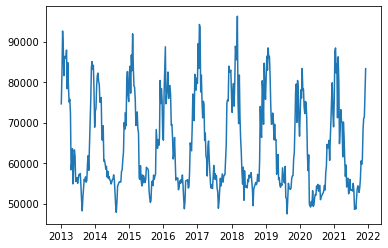

In [99]:
# Création du Dataframe à l'échelle nationale

df_national = df[['Région','Consommation (MW)']].groupby(df.index).sum()
df_national = df_national.groupby(pd.Grouper(freq="W")).max()
df_national = df_national.squeeze() # Dataframe passé en séries
df_national.head(50)
plt.plot(df_national);

Nombre de données d'entrainement : 373
Nombre de données de test : 93
Date de fin d'entrainement : 2020-02-23 00:00:00


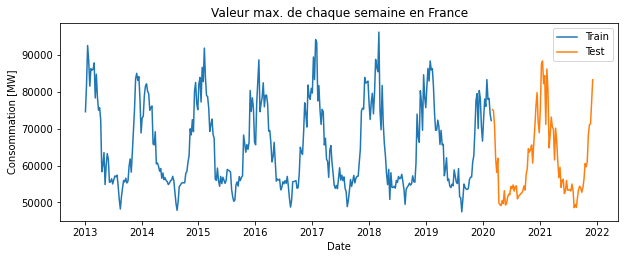

In [100]:
df_national_train = chrono_train(df_national)
df_national_test = chrono_test(df_national)

plt.figure(figsize=(10, 8))
plt.subplot(2,1,1)
plt.plot(df_national_train, label='Train')
plt.plot(df_national_test, label='Test')
print("Nombre de données d'entrainement :", df_national_train.shape[0])
print('Nombre de données de test :', df_national_test.shape[0])
print("Date de fin d'entrainement :", df_national_train.index[-1])
plt.legend()
plt.xlabel('Date')
plt.ylabel('Consommation [MW]')
plt.title('Valeur max. de chaque semaine en France');

Décomposition automatique en France


<Figure size 720x576 with 0 Axes>

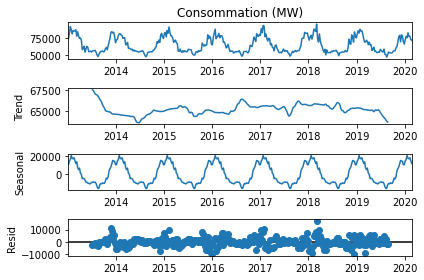

In [101]:
plt.figure(figsize=(10, 8))
res = seasonal_decompose(df_national_train, period = 52) # On fixe une période à 1 an
res.plot()
print('Décomposition automatique en France')
plt.show()


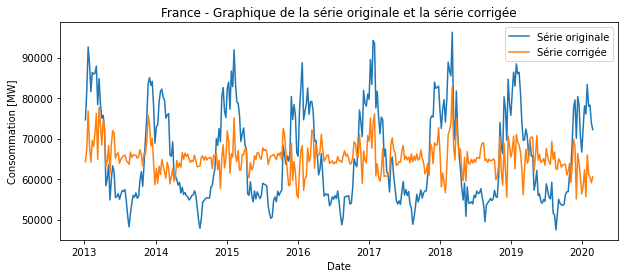

In [102]:
# On soustrait les coefficients saisonniers à la série sarima_idf
cvs_national=df_national_train - res.seasonal

    
# On affiche la série
plt.figure(figsize=(10,4))
plt.plot(df_national_train, label='Série originale')
plt.plot(cvs_national, label='Série corrigée') 
plt.title('France - Graphique de la série originale et la série corrigée')
plt.xlabel('Date')
plt.ylabel('Consommation [MW]')
plt.legend()

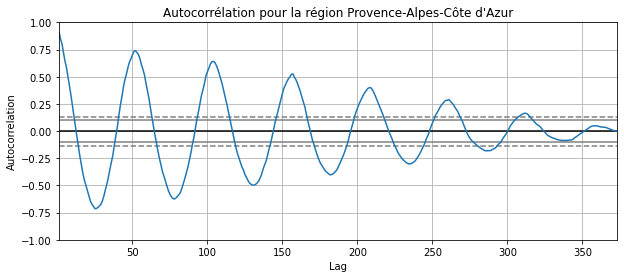

In [103]:
plt.figure(figsize=(10,4))
plt.title('Autocorrélation pour la région '+regions[i])
pd.plotting.autocorrelation_plot(df_national_train);

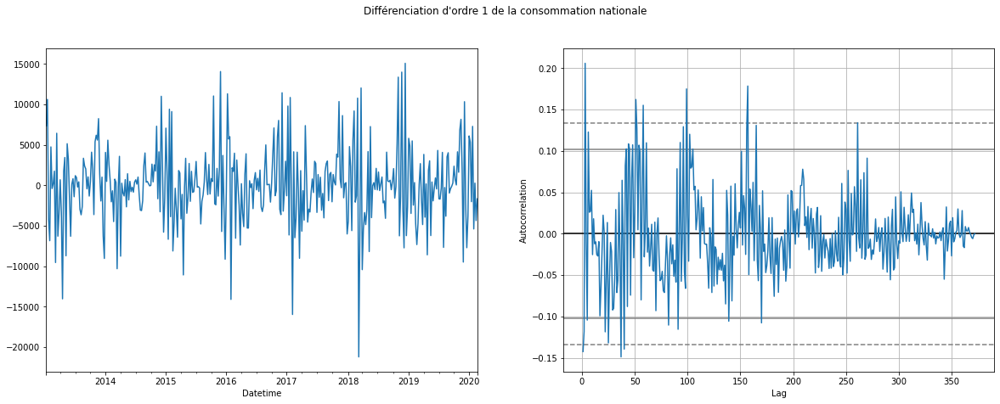

In [104]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7)) # Création de la figure et des axes
plt.suptitle("Différenciation d'ordre 1 de la consommation nationale")
df_national_train_1 = df_national_train.diff().dropna() # Différenciation ordre 1
df_national_train_1.plot(ax = ax1) # Série temporelle différenciée
pd.plotting.autocorrelation_plot(df_national_train_1, ax = ax2); # Autocorrélogramme de la série différenciée

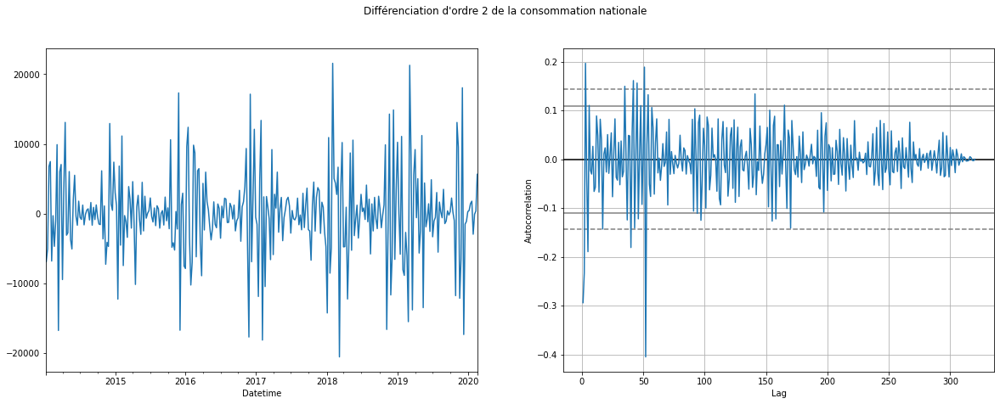

In [105]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7)) # Création de la figure et des axes
plt.suptitle("Différenciation d'ordre 2 de la consommation nationale")
df_national_train_2 = df_national_train_1.diff(periods = 52).dropna() #Différenciation d'ordre 2 période 52 semaines (1 an)
df_national_train_2.plot(ax = ax1) # Série doublement différenciée
pd.plotting.autocorrelation_plot(df_national_train_2, ax = ax2); # Autocorrélogramme de la série

In [106]:
_, p_value, _, _, _, _  = sm.tsa.stattools.adfuller(df_national_train_2)
print('p_value :',round(p_value,2))  # p-valeur de 0% : on peut considérer la série comme stationnaire.

p_value : 0.0


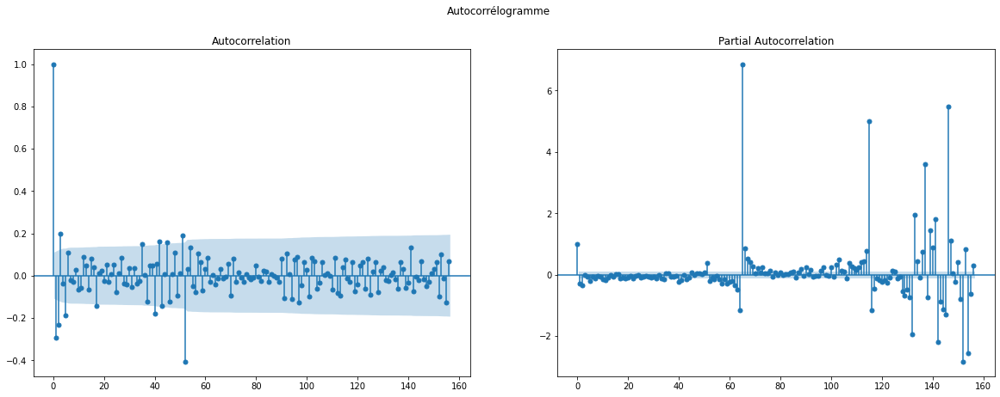

In [107]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
plt.suptitle("Autocorrélogramme")
plot_acf(df_national_train_2, lags = 156, ax=ax1)
plot_pacf(df_national_train_2, lags = 156, ax=ax2)
plt.show()

In [108]:
model=sm.tsa.SARIMAX(df_national_train,order=(1,1,1),seasonal_order=(0,1,1,52))
sarima=model.fit()
print(sarima.summary())

                                     SARIMAX Results                                      
Dep. Variable:                  Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(1, 1, 1)x(0, 1, 1, 52)   Log Likelihood               -3185.100
Date:                            Sun, 13 Mar 2022   AIC                           6378.200
Time:                                    23:57:15   BIC                           6393.274
Sample:                                01-06-2013   HQIC                          6384.219
                                     - 02-23-2020                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2869      0.170      1.692      0.091      -0.045       0.619
ma.L1         -0.5757      0.148   

Le paramètre "AR" d'ordre 1 a une p-valeur bien supérieure à 5%. Nous pouvons donc considérer ce terme comme non significatif et le supprimer pour simplifier le modèle.
Nous allons donc relancer le modèle en considérant le paramètre "p" nul. Cela signifie un SARIMA(1,1,1)(0,1,1)52.

In [109]:
model_national=sm.tsa.SARIMAX(df_national_train,order=(0,1,1),seasonal_order=(0,1,1,52))
sarima_national=model_national.fit()
print(sarima_national.summary())

                                     SARIMAX Results                                      
Dep. Variable:                  Consommation (MW)   No. Observations:                  373
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 52)   Log Likelihood               -3186.576
Date:                            Sun, 13 Mar 2022   AIC                           6379.152
Time:                                    23:57:18   BIC                           6390.457
Sample:                                01-06-2013   HQIC                          6383.666
                                     - 02-23-2020                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3259      0.035     -9.256      0.000      -0.395      -0.257
ma.S.L52      -0.6115      0.046   

<p>Tous les paramètres semblent être significatifs dans le modèle : les p-values sont inférieures à 5%. En revanche, cela inclut Prob(JB). On rejette donc l'hypothèse selon laquelle le modèle suit une loi normale.
<p>Notre modèle prend la semaine comme base de temps. Nous allons le tester en considérant cette fois une base de temps du jour afin de voir si l'augmentation du nombre de points change sensiblement les résultats. Nous lancerons ainsi un modèle SARIMA(0,1,1)(1,1,1)365 avec une base de temps journalière.

Text(0.5, 0, 'Date')

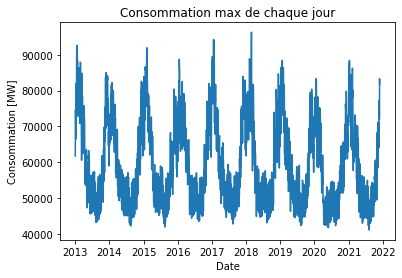

In [110]:
df_national_D = df[['Région','Consommation (MW)']].groupby(df.index).sum().groupby(pd.Grouper(freq="D")).max().squeeze()
df_national_D.head(50)
plt.plot(df_national_D)
plt.title('Consommation max de chaque jour')
plt.ylabel('Consommation [MW]')
plt.xlabel('Date')

Nombre de données d'entrainement : 400
Nombre de données de test : 100
Date de fin d'entrainement : 2021-08-22 00:00:00


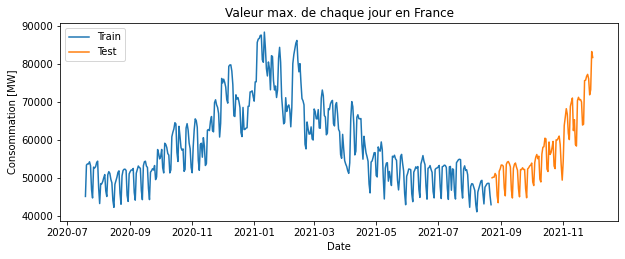

In [111]:
df_national_D_train = chrono_train(df_national_D)
df_national_D_test = chrono_test(df_national_D)

plt.figure(figsize=(10, 8))
plt.subplot(2,1,1)
plt.plot(df_national_D_train, label='Train')
plt.plot(df_national_D_test, label='Test')
print("Nombre de données d'entrainement :", df_national_D_train.shape[0])
print('Nombre de données de test :', df_national_D_test.shape[0])
print("Date de fin d'entrainement :", df_national_D_train.index[-1])
plt.legend()
plt.xlabel('Date')
plt.ylabel('Consommation [MW]')
plt.title('Valeur max. de chaque jour en France');

In [112]:
# Ce code étant trop volumineux pour être chargé, il est laissé en commentaire à titre informatif.
# Cf. explications plus bas.

# model=sm.tsa.SARIMAX(df_national_train,order=(0,1,1),seasonal_order=(0,1,1,365))
# sarima=model.fit()
# print(sarima.summary())

<p><i>"Unable to allocate 1.50 GiB for an array with shape (733, 733, 374) and data type float64"</i>
<p>En dépit d'une durée très limitée de données d'entraînement (environ 1 an, soit 1 période sur la base de la saisonnalité considérée), le nombre de données est trop important pour être entraîné. Le meilleur compromis reste donc celui sur la base de la semaine.
<p>Nous allons donc évaluer ce modèle en comparant les données prédites aux données réelles de test.
<p>Cette étude se fera en deux temps :
<ul>
    <li>Pour chaque région, en additionnant ensuite ces valeurs pour les comparer aux données de test à l'échelle nationale.</li>
    <li>Pour la nation, avec la même comparaison.</li>
</ul>
<p>Cela permettra de confronter ces deux approches et définir si isoler les régions pour les prédictions présente un intérêt significatif vis à vis de ce modèle.

Tous les paramètres semblent être significatifs dans le modèle (p_values inférieures à 5%).

### 3. Prédiction

### → Échelle régionale

MAE Bourgogne-Franche-Comté : 166.74


TypeError: 'numpy.float64' object is not callable

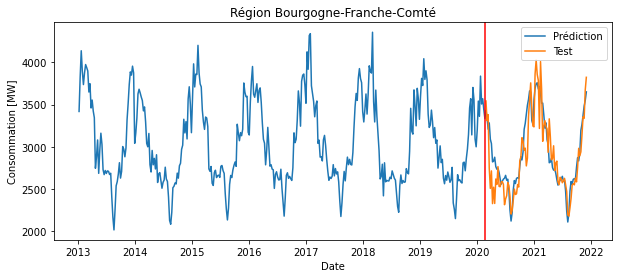

In [113]:
for i in [1,11]: # Indices des régions Bourgogne-Franche-Comté et Île-de-France
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,1,52))
    sarima=model.fit()
    pred = sarima.predict(373, 465) # Prédiction
    df_regional_pred = pd.concat([chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred]) # Concaténation des prédictions
    plt.figure(figsize=(10,4))
    plt.title('Région '+regions[i])
    plt.plot(df_regional_pred, label='Prédiction') # Visualisation
    plt.plot(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), label='Test')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Consommation [MW]')
    plt.axvline(x= date(2020,2,23), color='red'); # Ajout de la ligne verticale
    print('MAE',regions[i],':',round(mae(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred),2))
    print('RMSE',regions[i],':',round(rmse(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred)**0.5,2))

for i in [0,4,5,8]: # Indices des régions Auvergne-Rhône-Alpes, Grand Est, Hauts-de-France et Occitanie
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,1,52))
    sarima=model.fit()
    pred = sarima.predict(373, 465) # Prédiction
    df_regional_pred = pd.concat([chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred]) # Concaténation des prédictions
    plt.figure(figsize=(10,4))
    plt.title('Région '+regions[i])
    plt.plot(df_regional_pred, label='Prédiction') # Visualisation
    plt.plot(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), label='Test')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Consommation [MW]')
    plt.axvline(x= date(2020,2,23), color='red'); # Ajout de la ligne verticale
    print('MAE',regions[i],':',round(mae(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred),2))
    print('RMSE',regions[i],':',round(rmse(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred)**0.5,2))

for i in [2,6,7]: # Indices des régions Bretagne, Normandie et Nouvelle-Aquitaine
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,0,52))
    sarima=model.fit()
    pred = sarima.predict(373, 465) # Prédiction
    df_regional_pred = pd.concat([chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred]) # Concaténation des prédictions
    plt.figure(figsize=(10,4))
    plt.title('Région '+regions[i])
    plt.plot(df_regional_pred, label='Prédiction') # Visualisation
    plt.plot(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), label='Test')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Consommation [MW]')
    plt.axvline(x= date(2020,2,23), color='red'); # Ajout de la ligne verticale
    print('MAE',regions[i],':',round(mae(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred),2))
    print('RMSE',regions[i],':',round(rmse(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred)**0.5,2))
    
for i in [3,9,10]: # Indices des régions Centre-Val de Loire, Pays de la Loire et Provence-Alpes-Côte d'Azur
    model=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,0,52))
    sarima=model.fit()
    pred = sarima.predict(373, 465) # Prédiction
    df_regional_pred = pd.concat([chrono_train(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred]) # Concaténation des prédictions
    plt.figure(figsize=(10,4))
    plt.title('Région '+regions[i])
    plt.plot(df_regional_pred, label='Prédiction') # Visualisation
    plt.plot(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), label='Test')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Consommation [MW]')
    plt.axvline(x= date(2020,2,23), color='red'); # Ajout de la ligne verticale
    print('MAE',regions[i],':',round(mae(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred),2))
    print('RMSE',regions[i],':',round(rmse(chrono_test(df[df['Région'] == regions[i]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()), pred)**0.5,2))

<p>Si l'on compare les prédictions aux tests, il apparaît que le modèle prédit assez bien les valeurs de consommation. Cela corrobore les valeurs de MAE et RMSE relativement faibles.
<p>La région Occitanie semble présenter un décalage plus important. Cela s'explique par un changement plus important des profils de consommation dans cette région, sans doute liés à l'influence du Covid. Cela démontre par ailleurs l'intérêt de prédictions à l'échelle régionale car le comportement de chaque région n'est pas le même.

In [ ]:
# Remarque : Nous pourrions utiliser des boucles, mais cela ne rendrait pas le code plus lisible du fait des différents modèles SARIMA à appliquer selon la région. Cela simplifie également la création de variables.

# Création d'un Dataframe rassemblant les valeurs pour chaque région
model_0=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[0]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,1,52))
model_1=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[1]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,1,52))
model_2=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[2]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,0,52))
model_3=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[3]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,0,52))
model_4=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[4]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,1,52))
model_5=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[5]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,1,52))
model_6=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[6]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,0,52))
model_7=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[7]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,0,52))
model_8=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[8]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,1,52))
model_9=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[9]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,0,52))
model_10=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[10]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,0),seasonal_order=(0,1,0,52))
model_11=sm.tsa.SARIMAX(chrono_train(df[df['Région'] == regions[11]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max()),order=(1,1,1),seasonal_order=(0,1,1,52))

sarima_0, sarima_1, sarima_2, sarima_3, sarima_4, sarima_5, sarima_6, sarima_7, sarima_8, sarima_9, sarima_10, sarima_11 = model_0.fit(), model_1.fit(), model_2.fit(), model_3.fit(), model_4.fit(), model_5.fit(), model_6.fit(), model_7.fit(), model_8.fit(), model_9.fit(), model_10.fit(), model_11.fit()

# Prédictions
pred_0, pred_1, pred_2, pred_3, pred_4, pred_5, pred_6, pred_7, pred_8, pred_9, pred_10, pred_11 = sarima_0.predict(373, 465), sarima_1.predict(373, 465), sarima_2.predict(373, 465), sarima_3.predict(373, 465), sarima_4.predict(373, 465), sarima_5.predict(373, 465), sarima_6.predict(373, 465), sarima_7.predict(373, 465), sarima_8.predict(373, 465), sarima_9.predict(373, 465), sarima_10.predict(373, 465), sarima_11.predict(373, 465)  

# Tests
national_0 = chrono_test(df[df['Région'] == regions[0]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_1 = chrono_test(df[df['Région'] == regions[1]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_2 = chrono_test(df[df['Région'] == regions[2]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_3 = chrono_test(df[df['Région'] == regions[3]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_4 = chrono_test(df[df['Région'] == regions[4]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_5 = chrono_test(df[df['Région'] == regions[5]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_6 = chrono_test(df[df['Région'] == regions[6]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_7 = chrono_test(df[df['Région'] == regions[7]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_8 = chrono_test(df[df['Région'] == regions[8]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_9 = chrono_test(df[df['Région'] == regions[9]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_10 = chrono_test(df[df['Région'] == regions[10]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())
national_11 = chrono_test(df[df['Région'] == regions[11]]['Consommation (MW)'].groupby(pd.Grouper(freq="W")).max())

d = {'Données prédites nationales [MW]': pred_0+pred_1+pred_2+pred_3+pred_4+pred_5+pred_6+pred_7+pred_8+pred_9+pred_10+pred_11,
     'Données test nationales [MW]': national_0+national_1+national_2+national_3+national_4+national_5+national_6+national_7+national_8+national_9+national_10+national_11}

df_regional_to_national = pd.DataFrame(data=d, index=pred_0.index)
df_regional_to_national.head()

In [ ]:
# Visualisation
plt.figure(figsize=(10,4))
plt.plot(df_regional_to_national['Données prédites nationales [MW]'], label='Prédiction') 
plt.plot(df_regional_to_national['Données test nationales [MW]'], label='Test')
plt.title('Consommation nationale région par région')
plt.legend()
plt.ylabel('Consommation (MW)')
plt.xlabel('Date')

# Scores
print('MAE :',round(mae(df_regional_to_national['Données test nationales [MW]'], df_regional_to_national['Données prédites nationales [MW]']),2))
print('RMSE :',round(rmse(df_regional_to_national['Données test nationales [MW]'], df_regional_to_national['Données prédites nationales [MW]'])**0.5,2))

### → Échelle nationale

In [ ]:
pred_nationale = sarima_national.predict(373, 465) # Prédiction

df_national_pred = pd.concat([df_national_train, pred_nationale]) # Concaténation des prédictions

plt.plot(df_national_pred, label='Prédiction') # Visualisation
plt.plot(df_national_test, label='Test')
plt.title('Consommation nationale')
plt.legend()
plt.ylabel('Consommation (MW)')
plt.xlabel('Date')

plt.axvline(x= date(2020,2,23), color='red'); # Ajout de la ligne verticale

print('MAE :',round(mae(df_national_test, pred_nationale),2))
print('RMSE :',round(rmse(df_national_test, pred_nationale)**0.5,2))

In [ ]:
# Visualisation
plt.figure(figsize=(10,4))
plt.plot(df_regional_to_national['Données prédites nationales [MW]'], label='Prédiction région par région')
plt.plot(pred_nationale, label='Prédiction nationale')
plt.plot(df_regional_to_national['Données test nationales [MW]'], label='Test')
plt.title('Consommation nationale : comparaison des modèles de prédiction')
plt.legend()
plt.ylabel('Consommation (MW)')
plt.xlabel('Date')

<p>Sans surprise, le modèle de prédiction région par région présente les meilleurs résultats.
<p>Non seulement ses scores sont sensiblement meilleurs, ainsi que le confirme le graphique comparatif, mais en plus sur notre exemple il prédit des consommations supérieures au modèle de prédiction nationale.
<p>Cela signifie que cette méthode tend davantage à majorer la valeur de consommation, ce qui nous intéresse lorsqu'il s'agit d'éviter des black-out.

### → Prédiction avec intervalle de confiance

In [ ]:
# Prédictions avec intervalle de confiance
prediction_0, prediction_1, prediction_2, prediction_3, prediction_4, prediction_5, prediction_6, prediction_7, prediction_8, prediction_9, prediction_10, prediction_11 = sarima_0.get_forecast(steps=52).summary_frame(), sarima_1.get_forecast(steps=52).summary_frame(), sarima_2.get_forecast(steps=52).summary_frame(), sarima_3.get_forecast(steps=52).summary_frame(), sarima_4.get_forecast(steps=52).summary_frame(), sarima_5.get_forecast(steps=52).summary_frame(), sarima_6.get_forecast(steps=52).summary_frame(), sarima_7.get_forecast(steps=52).summary_frame(), sarima_8.get_forecast(steps=52).summary_frame(), sarima_9.get_forecast(steps=52).summary_frame(), sarima_10.get_forecast(steps=52).summary_frame(), sarima_11.get_forecast(steps=52).summary_frame()  

fig, ax = plt.subplots(figsize = (15,5))

plt.plot(df_national_train)

# Visualisation de la moyenne
(prediction_0['mean']+prediction_1['mean']+prediction_2['mean']+prediction_3['mean']+prediction_4['mean']+prediction_5['mean']+prediction_6['mean']+prediction_7['mean']+prediction_8['mean']+prediction_9['mean']+prediction_10['mean']+prediction_11['mean']).plot(ax = ax, style = 'k--')

# Visualisation de l'intervalle de confiance
ax.fill_between(prediction_0.index,
                (prediction_0['mean_ci_lower']+prediction_1['mean_ci_lower']+prediction_2['mean_ci_lower']+prediction_3['mean_ci_lower']+prediction_4['mean_ci_lower']+prediction_5['mean_ci_lower']+prediction_6['mean_ci_lower']+prediction_7['mean_ci_lower']+prediction_8['mean_ci_lower']+prediction_9['mean_ci_lower']+prediction_10['mean_ci_lower']+prediction_11['mean_ci_lower']),
                (prediction_0['mean_ci_upper']+prediction_1['mean_ci_upper']+prediction_2['mean_ci_upper']+prediction_3['mean_ci_upper']+prediction_4['mean_ci_upper']+prediction_5['mean_ci_upper']+prediction_6['mean_ci_upper']+prediction_7['mean_ci_upper']+prediction_8['mean_ci_upper']+prediction_9['mean_ci_upper']+prediction_10['mean_ci_upper']+prediction_11['mean_ci_upper']),
                color='k', alpha=0.5);

### 4. Synthèse

<p>Les modèles développés via SARIMA prédisent de la façon la plus complète possible les pics de consommation hebdomadaires. Nous préférons la méthode région par région, qui apporte davantage d'informations. Les prédictions se font ici à l'échelle de la semaine. Avec du matériel adapté, nous pourrions sans doute optimiser le modèle en l'ajustant à la journée.
<p>Il y a néanmoins une incertitude et des limites à ce modèle, qu'il semble intéressant de compléter par la corrélation de la consommation avec l'un des facteurs identifiés comme ayant un impact majeur vis à vis des pics : la température. Nous pourrons ainsi ajuster nos prédictions en associant une correction en cas de conditions météorologiques inhabituelles.

# VI- Conclusion

<p>Différentes approches ont été réalisées afin d'établir un profil estimé de la consommation.
<p>Chaque approche peut compléter les autres. Les résultats et les performances des modèles diffèrent.
<p>La prédiction utilisant la méthode SARIMA apparaît être la plus pertinente.
<p>La base de temps hebdomadaire nous semble être le meilleur compromis pour obtenir un résultat correct sans utiliser trop de ressources tout en ayant un résultat exploitable.
<p>Le fait de l'ajuster pour chaque région permet d'isoler les comportements différents liés à la géographie ; il est important de sommer ces consommations prédites pour obtenir la valeur nationale, plus utile pour la suite.